In [1]:
# Εγκατάσταση των βιβλιοθηκών numpy (για αριθμητικούς υπολογισμούς), pandas (για επεξεργασία δεδομένων),
# matplotlib και seaborn (για οπτικοποίηση δεδομένων), scikit-learn (για machine learning) και torch (για deep learning)
# Οι βιβλιοθήκες είναι ήδη εγκατεστημένες στο περιβάλλον και δεν χρειάζεται να τις ξαναεγκαταστήσουμε.
# Αν κάποιος τρέξει το notebook σε νέο περιβάλλον, θα χρειαστεί να εκτελέσει την εξής εντολή για να εγκαταστήσει τις βιβλιοθήκες:
# !pip install numpy pandas matplotlib seaborn scikit-learn torch


Φορτώνουμε τις εικόνες από τις κατηγορίες "BreastMRI", "ChestCT", "CXR", "Hand" και οπτικοποιούμε τις 5 πρώτες από κάθε κατηγορία για να ελέγξουμε την ποιότητα των δεδομένων και να επιβεβαιώσουμε την ορθότητα της ταξινόμησης. Η οπτικοποίηση μας βοηθά να εντοπίσουμε τυχόν προβλήματα ή ασυμφωνίες στις εικόνες.

In [2]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Φάκελος με τις εικόνες
input_dir = './archive' 

# Οι κατηγορίες
my_categories = ['BreastMRI', 'ChestCT', 'CXR', 'Hand']

# Αποθήκευση εικόνων και ετικετών
images = []
labels = []

# Φόρτωση εικόνων μόνο από τις συγκεκριμένες κατηγορίες
for category in my_categories:
    category_path = os.path.join(input_dir, category)
    if os.path.isdir(category_path):
        print(f"Φορτώνεται κατηγορία: {category}")
        for filename in os.listdir(category_path):
            if filename.endswith('.jpeg') or filename.endswith('.png'):
                image_path = os.path.join(category_path, filename)
                try:
                    img = Image.open(image_path).convert('L')
                    img = img.resize((64, 64))  # σε περίπτωση που υπάρχουν διαφορετικά μεγέθη
                    images.append(np.array(img))
                    labels.append(category)
                except Exception as e:
                    print(f"Πρόβλημα με την εικόνα {image_path}: {e}")

# Μετατροπή σε NumPy πίνακες
X = np.array(images)
y = np.array(labels)

# Έλεγχος
print(f"Σύνολο εικόνων: {len(X)}")
print(f"Σχήμα πίνακα εικόνων: {X.shape}")
print(f"Κατηγορίες που φορτώθηκαν: {np.unique(y)}")

Φορτώνεται κατηγορία: BreastMRI
Φορτώνεται κατηγορία: ChestCT
Φορτώνεται κατηγορία: CXR
Φορτώνεται κατηγορία: Hand
Σύνολο εικόνων: 38953
Σχήμα πίνακα εικόνων: (38953, 64, 64)
Κατηγορίες που φορτώθηκαν: ['BreastMRI' 'CXR' 'ChestCT' 'Hand']


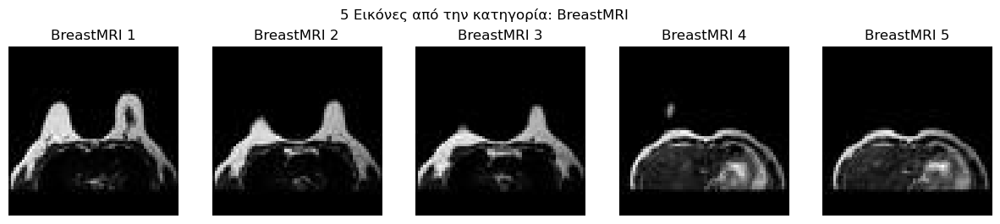

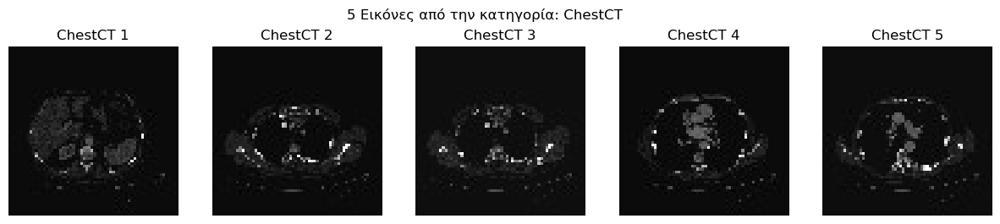

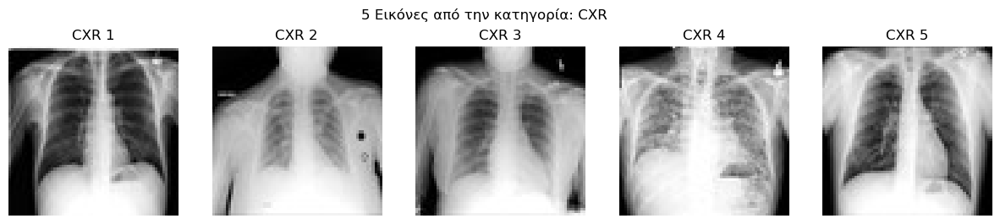

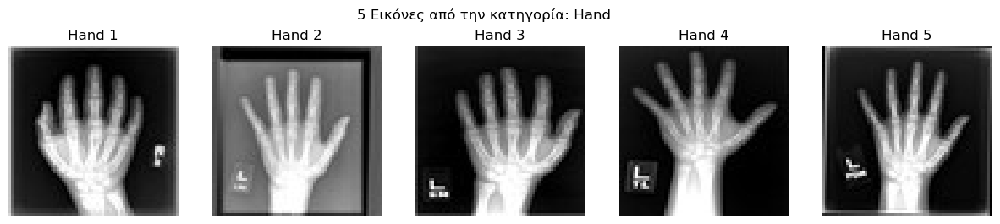

In [3]:
def plot_first_5_images_per_class(X, y, categories):
    for category in categories:
        idxs = [i for i, label in enumerate(y) if label == category][:5]
        plt.figure(figsize=(15, 3))
        for i, idx in enumerate(idxs):
            plt.subplot(1, 5, i + 1)
            plt.imshow(X[idx], cmap='gray')
            plt.title(f"{category} {i+1}")
            plt.axis('off')
        plt.suptitle(f"5 Εικόνες από την κατηγορία: {category}")
        plt.show()

plot_first_5_images_per_class(X, y, my_categories)

In [4]:
import numpy as np

# Υπολογισμός των βασικών στατιστικών
mean_pixel_value = np.mean(X)
median_pixel_value = np.median(X)
std_pixel_value = np.std(X)
min_pixel_value = np.min(X)
max_pixel_value = np.max(X)

# Υπολογισμός του 25ου, 50ου και 75ου εκατοστημόριου
percentiles = np.percentile(X, [25, 50, 75])

print(f"Μέση τιμή pixel: {mean_pixel_value}")
print(f"Διάμεσος: {median_pixel_value}")
print(f"Τυπική απόκλιση: {std_pixel_value}")
print(f"Ελάχιστη τιμή: {min_pixel_value}")
print(f"Μέγιστη τιμή: {max_pixel_value}")
print(f"25ο, 50ο, 75ο εκατοστημόριο: {percentiles}")

Μέση τιμή pixel: 94.17698467970415
Διάμεσος: 123.0
Τυπική απόκλιση: 78.59970893654427
Ελάχιστη τιμή: 0
Μέγιστη τιμή: 255
25ο, 50ο, 75ο εκατοστημόριο: [  7. 123. 139.]


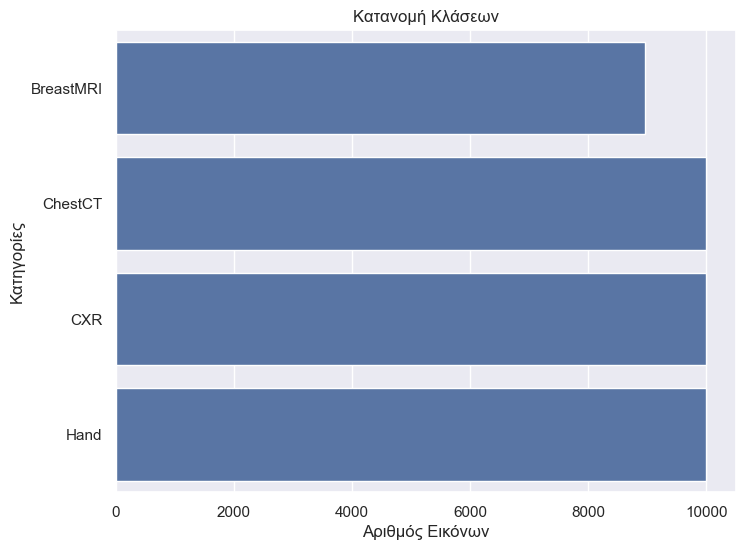

In [5]:
import matplotlib.pyplot as plt

# Ανάλυση κατανομής των κατηγοριών
import seaborn as sns

sns.set(style="darkgrid")
plt.figure(figsize=(8, 6))
sns.countplot(y=y)  # Χρησιμοποιούμε το y για τις ετικέτες
plt.title('Κατανομή Κλάσεων')
plt.xlabel('Αριθμός Εικόνων')
plt.ylabel('Κατηγορίες')
plt.show()

Αρχικά πραγματοποιήθηκε τυποποίηση των pixel τιμών μέσω της μεθόδου StandardScaler, προκειμένου να διασφαλιστεί ότι κάθε χαρακτηριστικό έχει μέση τιμή 0 και τυπική απόκλιση 1.

Ακολούθως, αναλύθηκαν οι κατανομές μέσω boxplots για κάθε κατηγορία. Παρά την τυποποίηση, διαπιστώθηκε η παρουσία ακραιών τιμών (outliers), οι οποίες εντοπίστηκαν με χρήση του κανόνα IQR (Q1 – 1.5IQR, Q3 + 1.5IQR).

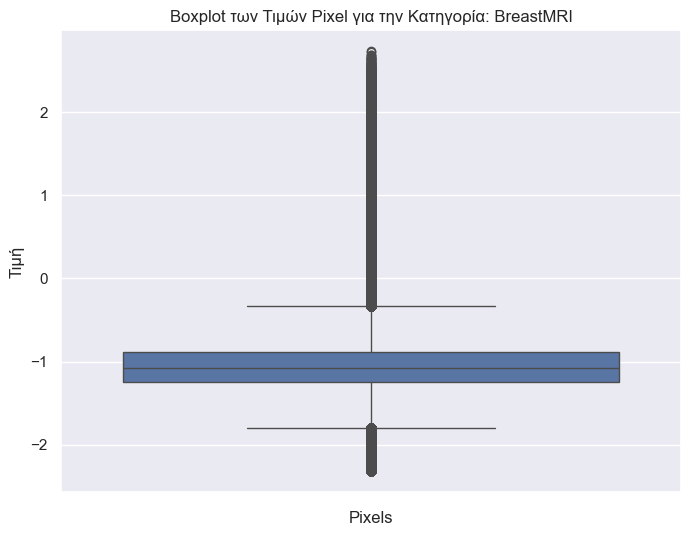

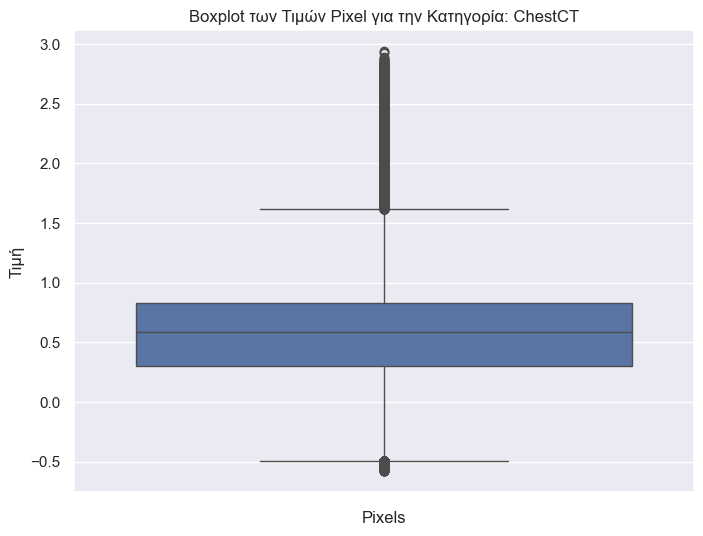

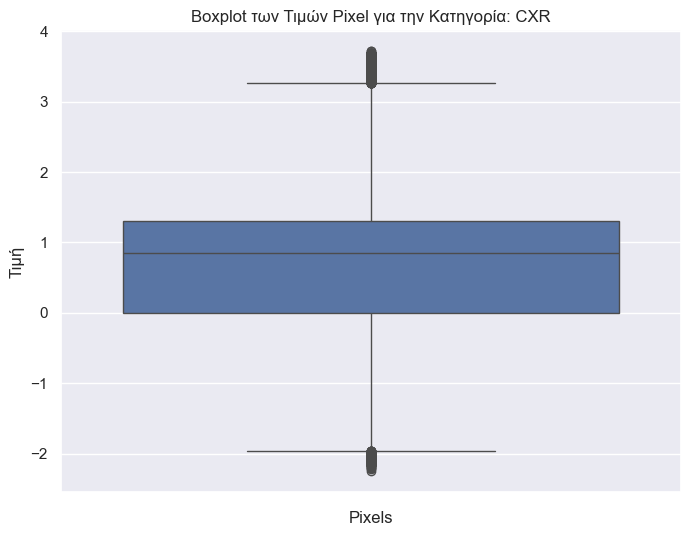

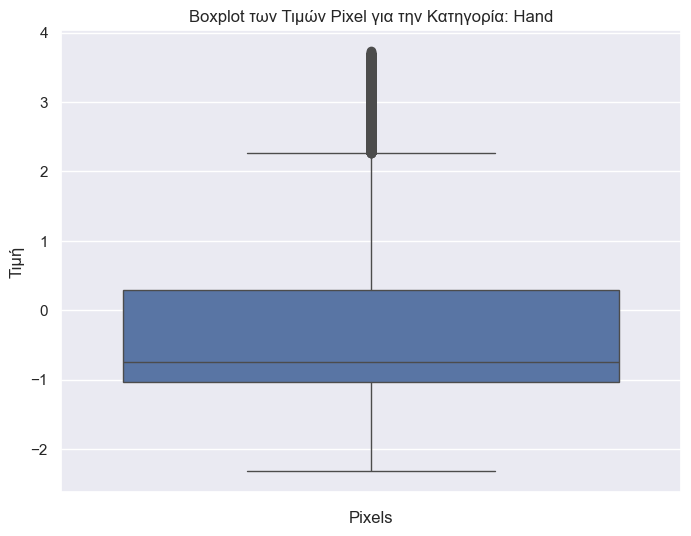

In [6]:
# Εισαγωγή της βιβλιοθήκης seaborn
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# Κανονικοποίηση/Τυποποίηση των εικόνων
X_reshaped = X.reshape(X.shape[0], -1)  # Αναδιάταξη των εικόνων σε ένα επίπεδο (καθε εικόνα 64x64 γίνεται σε έναν πίνακα 4096)
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X_reshaped)  # Τυποποίηση

# Δημιουργία boxplot για κάθε κατηγορία
for category in my_categories:
    idxs = [i for i, label in enumerate(y) if label == category]

    # Λαμβάνουμε μόνο τα πρώτα 500 στοιχεία από κάθε κατηγορία (για να επιταχύνουμε την επεξεργασία)
    category_data = X_normalized[idxs[:500]].reshape(-1)  # Παίρνουμε μόνο τα πρώτα 500 pixels της κατηγορίας

    # Δημιουργία boxplot
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=category_data)  # Δημιουργία boxplot για τα pixel της κατηγορίας
    plt.title(f'Boxplot των Τιμών Pixel για την Κατηγορία: {category}')
    plt.xlabel('Pixels')
    plt.ylabel('Τιμή')
    plt.show()

    # Αποθήκευση του boxplot ως εικόνα για μελλοντική χρήση
    plt.savefig(f'{category}_boxplot.png')
    plt.close()  # Κλείσιμο της εικόνας για να αποδεσμευτεί η μνήμη


Ο αριθμός των outliers είναι 7.750, όπως φαίνεται ακολούθως, κάτι το οποίο θεωρείται αναμενόμενο λόγω της φύσης των δεδομένων εικόνας. Οι εν λόγω τιμές δεν αφαιρέθηκαν καθώς θεωρούνται τμήμα της χρήσιμης πληροφορίας (π.χ. έντονα φωτεινές ή σκοτεινές περιοχές της εικόνας) και όχι σφάλματα μέτρησης. Επιπλέον, η χρήση robust scaling δεν κρίθηκε αναγκαία καθώς η StandardScaler απέδωσε ικανοποιητικά και τα μοντέλα είναι αρκετά ανθεκτικά σε τέτοια outliers. Πραγματοποιήθηκε επίσης έλεγχος για ελλείπουσες τιμές (NaN) και δεν εντοπίστηκε καμία.

In [7]:
import numpy as np

# Μετατροπή του X (εικόνες) σε μονοδιάστατο πίνακα για να αναλύσουμε όλα τα δεδομένα
all_pixels = X_normalized.reshape(-1)  # Μετατροπή όλων των εικόνων σε μονοδιάστατο πίνακα

# Υπολογισμός των στατιστικών
Q1 = np.percentile(all_pixels, 25)
Q3 = np.percentile(all_pixels, 75)
median = np.median(all_pixels)
IQR = Q3 - Q1

# Υπολογισμός των ακραιών τιμών
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = all_pixels[(all_pixels < lower_bound) | (all_pixels > upper_bound)]

# Εκτύπωση των στατιστικών και των ακραιών τιμών
print(f"Στατιστικά για όλες τις εικόνες:")
print(f"  25ο Πεντημόριο (Q1): {Q1:.4f}")
print(f"  Διάμεσος (Median): {median:.4f}")
print(f"  75ο Πεντημόριο (Q3): {Q3:.4f}")
print(f"  Εύρος IQR: {IQR:.4f}")
print(f"  Κατώτατο όριο (Lower Bound): {lower_bound:.4f}")
print(f"  Ανώτατο όριο (Upper Bound): {upper_bound:.4f}")
print(f"  Συνολικός αριθμός ακραιών τιμών (Outliers): {len(outliers)}")
print(f"Ελάχιστη τιμή pixel: {all_pixels.min()}")
print(f"Μέγιστη τιμή pixel: {all_pixels.max()}")
print(f"  Πρώτες 10 ακραιές τιμές (Outliers): {outliers[:10]}")

Στατιστικά για όλες τις εικόνες:
  25ο Πεντημόριο (Q1): -0.9763
  Διάμεσος (Median): 0.1027
  75ο Πεντημόριο (Q3): 0.8236
  Εύρος IQR: 1.7999
  Κατώτατο όριο (Lower Bound): -3.6761
  Ανώτατο όριο (Upper Bound): 3.5235
  Συνολικός αριθμός ακραιών τιμών (Outliers): 7750
Ελάχιστη τιμή pixel: -2.319106606967984
Μέγιστη τιμή pixel: 3.731646965612793
  Πρώτες 10 ακραιές τιμές (Outliers): [3.5705808  3.56406764 3.56211446 3.60300324 3.55152759 3.55725103
 3.53808025 3.62595531 3.59861131 3.57967407]


In [8]:
missing_values = np.isnan(X_normalized)  # Για πίνακες numpy
print(f"Συνολικός αριθμός ελλειπουσών τιμών: {missing_values.sum()}")

Συνολικός αριθμός ελλειπουσών τιμών: 0


In [9]:
from sklearn.feature_selection import VarianceThreshold

# Αφαίρεση χαρακτηριστικών με διακύμανση μικρότερη από 0.01
selector = VarianceThreshold(threshold=0.01)
X_reduced_var = selector.fit_transform(X_normalized)

print(f"Αρχικός αριθμός χαρακτηριστικών: {X_normalized.shape[1]}")
print(f"Αριθμός χαρακτηριστικών μετά τη μείωση: {X_reduced_var.shape[1]}")

Αρχικός αριθμός χαρακτηριστικών: 4096
Αριθμός χαρακτηριστικών μετά τη μείωση: 4096


Παρατηρούμε ότι μετά τη μείωση των χαρακτηριστικών με διακύμανση μικρότερη από 0.01, παρέμειναν 4096, οπότε μπορούμε να παραλείψουμε το συγκεκριμένο feature engineering, καθώς το dataset μας ήδη έχει 4096 χαρακτηριστικά, και μπορούμε να εφαρμόσουμε μείωση διαστάσεων χωρίς να προσθέσουμε επιπλέον χαρακτηριστικά.

In [10]:
# Εισαγωγή των απαραίτητων βιβλιοθηκών
import random
import numpy as np
import torch

# Ορισμός του seed για αναπαραγωγιμότητα
seed = 42
random.seed(seed)  # Για τη βιβλιοθήκη random
np.random.seed(seed)  # Για τη βιβλιοθήκη NumPy

# Για PyTorch, αν το χρησιμοποιείς:
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # Σε πολλαπλές GPU αν υπάρχουν

# Ρυθμίσεις για αναπαραγωγιμότητα με GPU
torch.backends.cudnn.deterministic = True  # Αναγκάζει ντετερμινιστικές πράξεις
torch.backends.cudnn.benchmark = False  # Απενεργοποιεί το benchmarking για τα βελτιστοποιημένα μεγέθη μπλοκ

# Ελέγχουμε εάν το seed έχει ρυθμιστεί σωστά
print(f"Random seed set to {seed}")

Random seed set to 42


In [11]:
import os
import shutil
from pathlib import Path
import random

# Φάκελος πηγής και προορισμού
src_dir = 'archive'    # Διαδρομή για το φάκελο με τα δεδομένα
dest_dir = 'archive_smaller'  # Διαδρομή για το φάκελο προορισμού

# Κατηγορίες και περιορισμός εικόνων ανά κατηγορία
my_categories = ['BreastMRI', 'ChestCT', 'CXR', 'Hand']
max_images_per_class = 1000

# Δημιουργία του φακέλου προορισμού αν δεν υπάρχει
os.makedirs(dest_dir, exist_ok=True)

# Αντιγραφή εικόνων
for class_name in os.listdir(src_dir):
    if class_name in my_categories:  # Ελέγχουμε αν η κατηγορία είναι στην λίστα μας
        class_path = os.path.join(src_dir, class_name)
        if os.path.isdir(class_path):
            dest_class_path = os.path.join(dest_dir, class_name)
            os.makedirs(dest_class_path, exist_ok=True)

            # Βρίσκουμε όλες τις εικόνες για την κατηγορία
            all_images = [f for f in os.listdir(class_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

            # Επιλέγουμε τυχαία εικόνες με περιορισμό στον αριθμό
            selected_images = random.sample(all_images, min(max_images_per_class, len(all_images)))

            # Αντιγραφή των επιλεγμένων εικόνων στον φάκελο προορισμού
            for img in selected_images:
                shutil.copy(os.path.join(class_path, img), os.path.join(dest_class_path, img))

# Φόρτωση και προεπεξεργασία των εικόνων
input_dir = 'archive_smaller'

images = []
labels = []

# Φόρτωση εικόνας από το φάκελο
for category in os.listdir(input_dir):
    category_path = os.path.join(input_dir, category)
    if os.path.isdir(category_path):
        for file_name in os.listdir(category_path):
            if file_name.endswith('.jpeg') or file_name.endswith('.png'):  # Έλεγχος για εικόνες
                img_path = os.path.join(category_path, file_name)
                try:
                    img = Image.open(img_path)
                    img_array = np.array(img)

                    # Αποθήκευση εικόνας και ετικέτας
                    images.append(img_array)
                    labels.append(category)
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")

# Μετατροπή σε πίνακες NumPy
images = np.array(images)
labels = np.array(labels)

# Έλεγχος
print(f"Loaded {len(images)} images.")
print(f"Image shape: {images[0].shape} ")
print(f"Labels: {np.unique(labels)}")


Loaded 4000 images.
Image shape: (64, 64) 
Labels: ['BreastMRI' 'CXR' 'ChestCT' 'Hand']


In [12]:
from sklearn.model_selection import train_test_split
from collections import Counter

# Ορισμός τυχαίας αρχής για αναπαραγωγιμότητα
random_state = 42

# Πρώτα, χωρίζουμε σε Train (70%) και Temp (30% - επικύρωση + δοκιμή)
X_train, X_temp, y_train, y_temp = train_test_split(
    images, labels, test_size=0.3, random_state=random_state, stratify=labels
)

# Στη συνέχεια, χωρίζουμε το temp σε Validation (20%) και Test (10%)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.33, random_state=random_state, stratify=y_temp
)

# Εκτύπωση των σχημάτων των συνόλων
print(f"Shape Train set: {X_train.shape}, labels: {y_train.shape}")
print(f"Shape Validation set: {X_val.shape}, labels: {y_val.shape}")
print(f"Shape Test set: {X_test.shape}, labels:{y_test.shape}")

# Υπολογισμός των αριθμών εικόνας ανά κατηγορία για κάθε σετ
train_counts = Counter(y_train)
val_counts = Counter(y_val)
test_counts = Counter(y_test)

# Εκτύπωση των αποτελεσμάτων
print("\nΑριθμός εικόνων ανά κατηγορία για το Training set:")
for category, count in train_counts.items():
    print(f"{category}: {count}")

print("\nΑριθμός εικόνων ανά κατηγορία για το Validation set:")
for category, count in val_counts.items():
    print(f"{category}: {count}")

print("\nΑριθμός εικόνων ανά κατηγορία για το Test set:")
for category, count in test_counts.items():
    print(f"{category}: {count}")

Shape Train set: (2800, 64, 64), labels: (2800,)
Shape Validation set: (804, 64, 64), labels: (804,)
Shape Test set: (396, 64, 64), labels:(396,)

Αριθμός εικόνων ανά κατηγορία για το Training set:
BreastMRI: 700
CXR: 700
ChestCT: 700
Hand: 700

Αριθμός εικόνων ανά κατηγορία για το Validation set:
CXR: 201
BreastMRI: 201
Hand: 201
ChestCT: 201

Αριθμός εικόνων ανά κατηγορία για το Test set:
ChestCT: 99
Hand: 99
CXR: 99
BreastMRI: 99


Πρώτα, εκπαιδεύουμε με τα δεδομένα χωρίς να κάνουμε μείωση διαστάσεων και αξιολογούμε την απόδοση ώστε να έχουμε μέτρο σύγκρισης.

In [13]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

# Flatten τα δεδομένα για το Training Set
X_train_flattened = X_train.reshape(X_train.shape[0], -1)
X_val_flattened = X_val.reshape(X_val.shape[0], -1)
X_test_flattened = X_test.reshape(X_test.shape[0], -1)

# Εκπαίδευση Logistic Regression πάνω στα αρχικά δεδομένα
clf = LogisticRegression(max_iter=1000)
clf.fit(X_train_flattened, y_train)  # Εκπαίδευση με τα αρχικά δεδομένα

# Προβλέψεις για το Training Set
y_pred_train = clf.predict(X_train_flattened)
train_accuracy = accuracy_score(y_train, y_pred_train)

# Προβλέψεις για το Validation Set
y_pred_val = clf.predict(X_val_flattened)
val_accuracy = accuracy_score(y_val, y_pred_val)

# Προβλέψεις για το Test Set
y_pred_test = clf.predict(X_test_flattened)
test_accuracy = accuracy_score(y_test, y_pred_test)

# Εκτύπωση των αποτελεσμάτων ακρίβειας
print(f"Train Accuracy without PCA: {train_accuracy:.4f}")
print(f"Validation Accuracy without PCA: {val_accuracy:.4f}")
print(f"Test Accuracy without PCA: {test_accuracy:.4f}")

# Εκτύπωση Classification Report για τα αποτελέσματα του Training Set
print("\nClassification Report for Training Set:")
print(classification_report(y_train, y_pred_train))

# Εκτύπωση Classification Report για τα αποτελέσματα του Validation Set
print("\nClassification Report for Validation Set:")
print(classification_report(y_val, y_pred_val))

# Εκτύπωση Classification Report για τα αποτελέσματα του Test Set
print("\nClassification Report for Test Set:")
print(classification_report(y_test, y_pred_test))

Train Accuracy without PCA: 1.0000
Validation Accuracy without PCA: 0.9950
Test Accuracy without PCA: 0.9975

Classification Report for Training Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       700
         CXR       1.00      1.00      1.00       700
     ChestCT       1.00      1.00      1.00       700
        Hand       1.00      1.00      1.00       700

    accuracy                           1.00      2800
   macro avg       1.00      1.00      1.00      2800
weighted avg       1.00      1.00      1.00      2800


Classification Report for Validation Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       201
         CXR       0.99      1.00      0.99       201
     ChestCT       1.00      1.00      1.00       201
        Hand       0.99      0.99      0.99       201

    accuracy                           1.00       804
   macro avg       1.00      1.00      1.00   

Εφαρμόζουμε PCA

Original shape (Train): (2800, 4096)
PCA reduced shape (Train): (2800, 50)


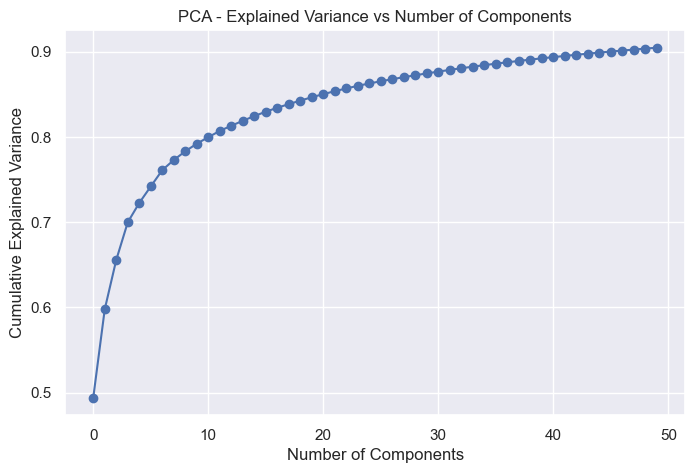

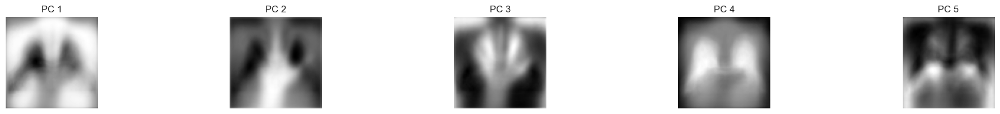

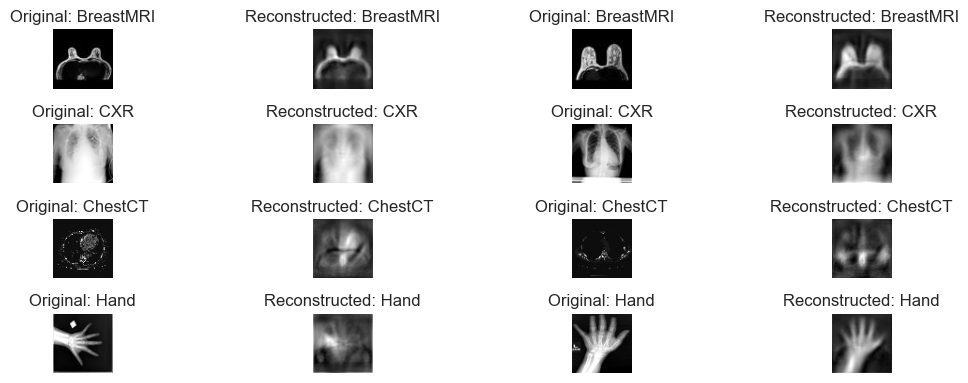

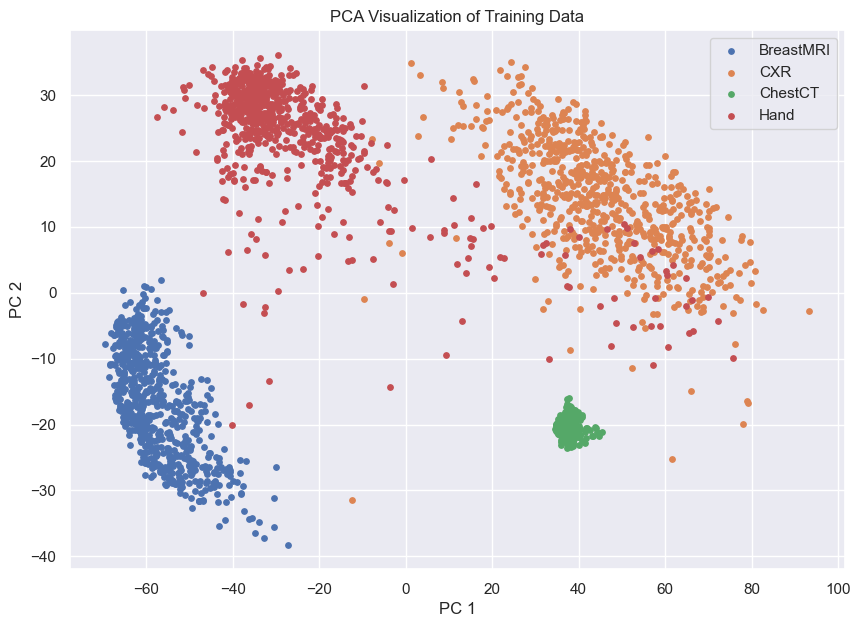

Original shape (Validation): (804, 4096)
PCA reduced shape (Validation): (804, 50)
Original shape (Test): (396, 4096)
PCA reduced shape (Test): (396, 50)


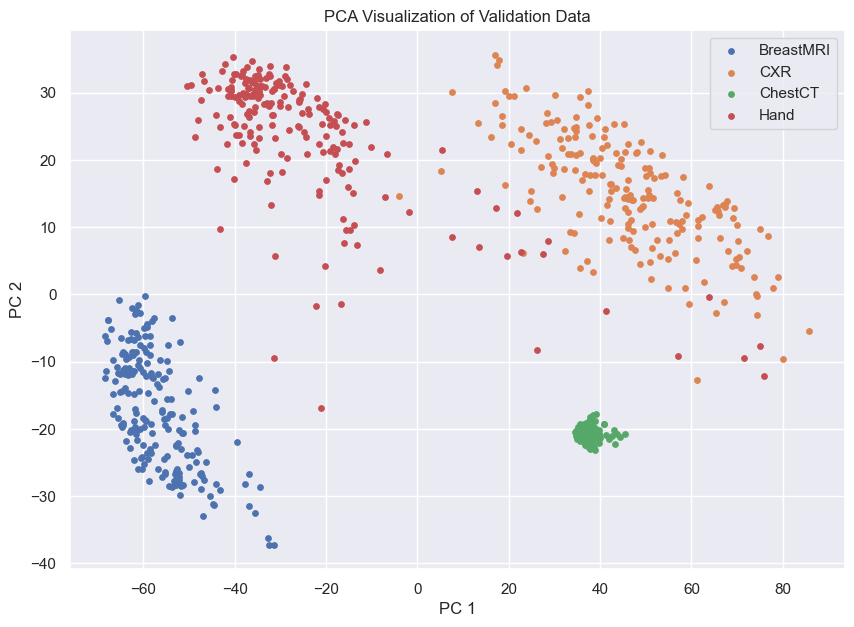

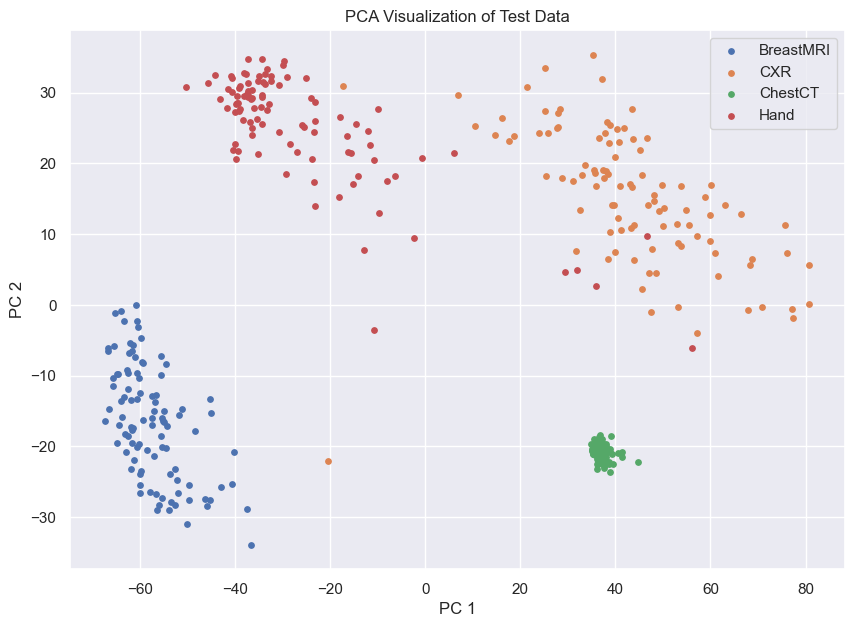

In [14]:
import os
import numpy as np
from PIL import Image
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Διαδικασία εφαρμογής PCA στο Training Set
num_samples = X_train.shape[0]
flattened_images = X_train.reshape(num_samples, -1)

# Standardize τα δεδομένα
scaler = StandardScaler()
flattened_images_std = scaler.fit_transform(flattened_images)

# Εφαρμογή PCA με 50 κύριες συνιστώσες
n_components = 50
pca = PCA(n_components=n_components, random_state=42)
principal_components = pca.fit_transform(flattened_images_std)

# Αποθήκευση των αποτελεσμάτων PCA για το Training Set
X_train_pca = principal_components

# Εκτύπωση του σχήματος των δεδομένων πριν και μετά το PCA
print(f"Original shape (Train): {flattened_images.shape}")
print(f"PCA reduced shape (Train): {X_train_pca.shape}")

# Οπτικοποίηση της εξηγημένης διακύμανσης από το PCA
plt.figure(figsize=(8, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA - Explained Variance vs Number of Components')
plt.grid(True)
plt.show()

# Οπτικοποίηση των πρώτων 5 κύριων συνιστωσών
plt.figure(figsize=(20, 4))
for i in range(5):
    plt.subplot(2, 5, i + 1)
    component = pca.components_[i].reshape(X_train[0].shape)  # Σχήμα εικόνας
    plt.imshow(component, cmap='gray')
    plt.title(f'PC {i + 1}')
    plt.axis('off')
plt.tight_layout()
plt.show()

# Αντίστροφη μετασχηματισμός για την ανακατασκευή των εικόνων από το PCA
reconstructed = pca.inverse_transform(X_train_pca)
reconstructed_images = scaler.inverse_transform(reconstructed)
reconstructed_images = reconstructed_images.reshape(X_train.shape)

# Οπτικοποίηση 2 εικόνων ανά κατηγορία: original vs reconstructed
unique_classes = np.unique(y_train)
images_per_class = 2

plt.figure(figsize=(10, 4))  # Μεγαλύτερες εικόνες
plot_idx = 1
for class_label in unique_classes:
    class_indices = np.where(y_train == class_label)[0][:images_per_class]
    for i, idx in enumerate(class_indices):
        plt.subplot(len(unique_classes), images_per_class * 2, plot_idx)
        plt.imshow(X_train[idx], cmap='gray')
        plt.title(f"Original: {class_label}")
        plt.axis('off')
        plot_idx += 1

        plt.subplot(len(unique_classes), images_per_class * 2, plot_idx)
        plt.imshow(reconstructed_images[idx], cmap='gray')
        plt.title(f"Reconstructed: {class_label}")
        plt.axis('off')
        plot_idx += 1

plt.tight_layout()
plt.subplots_adjust(wspace=0.4, hspace=0.6)
plt.show()

# Οπτικοποίηση του Training Set μετά την εφαρμογή PCA
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_train):
    idx = np.where(y_train == class_label)
    plt.scatter(X_train_pca[idx, 0], X_train_pca[idx, 1], label=class_label, s=15)
plt.title("PCA Visualization of Training Data")
plt.xlabel("PC 1")
plt.ylabel("PC 2")
plt.legend()
plt.show()

# Εφαρμογή PCA στο Validation και Test Set
X_val_flattened = X_val.reshape(X_val.shape[0], -1)  # Flatten το validation set
X_test_flattened = X_test.reshape(X_test.shape[0], -1)  # Flatten το test set

X_val_std = scaler.transform(X_val_flattened)
X_test_std = scaler.transform(X_test_flattened)

X_val_pca = pca.transform(X_val_std)
X_test_pca = pca.transform(X_test_std)

# Εκτύπωση των σχημάτων για Validation και Test
print(f"Original shape (Validation): {X_val_flattened.shape}")
print(f"PCA reduced shape (Validation): {X_val_pca.shape}")
print(f"Original shape (Test): {X_test_flattened.shape}")
print(f"PCA reduced shape (Test): {X_test_pca.shape}")

# Οπτικοποίηση του Validation Set μετά την εφαρμογή PCA
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_val):
    idx = np.where(y_val == class_label)
    plt.scatter(X_val_pca[idx, 0], X_val_pca[idx, 1], label=class_label, s=15)
plt.title("PCA Visualization of Validation Data")
plt.xlabel("PC 1")
plt.ylabel("PC 2")
plt.legend()
plt.show()

# Οπτικοποίηση του Test Set μετά την εφαρμογή PCA
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_test):
    idx = np.where(y_test == class_label)
    plt.scatter(X_test_pca[idx, 0], X_test_pca[idx, 1], label=class_label, s=15)
plt.title("PCA Visualization of Test Data")
plt.xlabel("PC 1")
plt.ylabel("PC 2")
plt.legend()
plt.show()

Train Accuracy with PCA: 1.0000
Validation Accuracy with PCA: 0.9925
Test Accuracy with PCA: 0.9949
Classification Report for Training Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       700
         CXR       1.00      1.00      1.00       700
     ChestCT       1.00      1.00      1.00       700
        Hand       1.00      1.00      1.00       700

    accuracy                           1.00      2800
   macro avg       1.00      1.00      1.00      2800
weighted avg       1.00      1.00      1.00      2800

Classification Report for Validation Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       201
         CXR       0.99      0.99      0.99       201
     ChestCT       0.99      1.00      1.00       201
        Hand       0.99      0.98      0.99       201

    accuracy                           0.99       804
   macro avg       0.99      0.99      0.99       804
wei

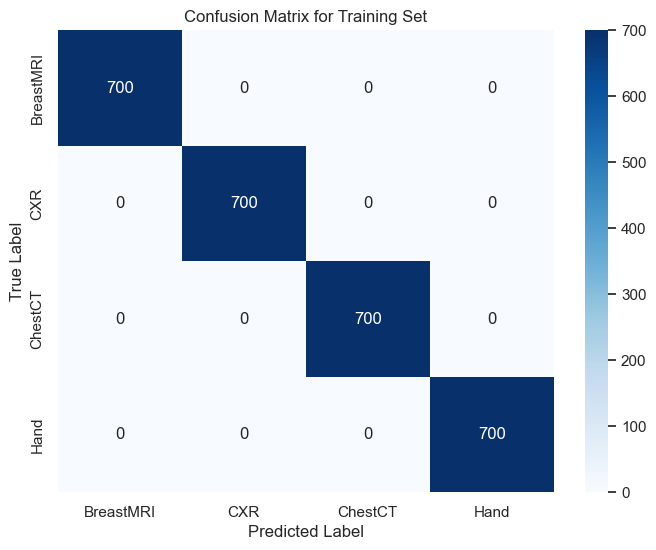

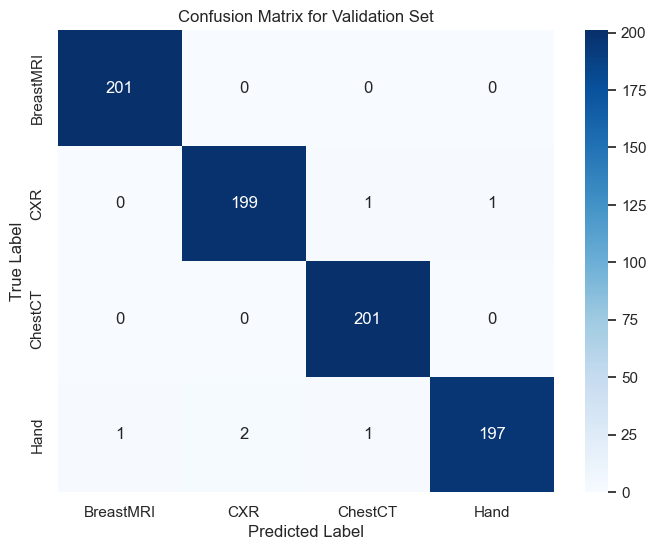

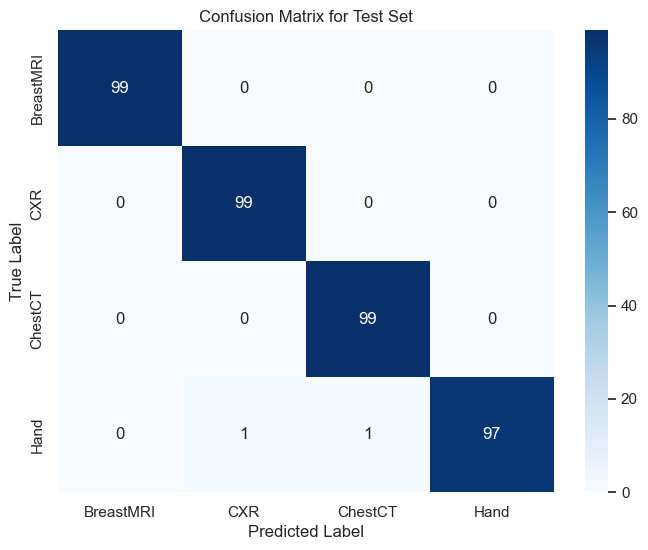

In [15]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns


# Εκπαίδευση Logistic Regression πάνω στα δεδομένα μετά την εφαρμογή PCA
clf_pca = LogisticRegression(max_iter=1000, random_state=42) # μπορούμε να αυξήσουμε και σε max iter 10000 αν χρειάζεται
clf_pca.fit(X_train_pca, y_train)  # Εκπαίδευση με τα δεδομένα που έχουν μειωθεί μέσω PCA

# Προβλέψεις για το Training Set
y_pred_train_pca = clf_pca.predict(X_train_pca)
train_accuracy_pca = accuracy_score(y_train, y_pred_train_pca)

# Προβλέψεις για το Validation Set
y_pred_val_pca = clf_pca.predict(X_val_pca)
val_accuracy_pca = accuracy_score(y_val, y_pred_val_pca)

# Προβλέψεις για το Test Set
y_pred_test_pca = clf_pca.predict(X_test_pca)
test_accuracy_pca = accuracy_score(y_test, y_pred_test_pca)

# Εκτύπωση των αποτελεσμάτων ακρίβειας
print(f"Train Accuracy with PCA: {train_accuracy_pca:.4f}")
print(f"Validation Accuracy with PCA: {val_accuracy_pca:.4f}")
print(f"Test Accuracy with PCA: {test_accuracy_pca:.4f}")

# Εκτύπωση του Classification Report για το Training Set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train_pca))

# Εκτύπωση Classification Report για Validation Set
print("Classification Report for Validation Set:")
print(classification_report(y_val, y_pred_val_pca))

# Εκτύπωση του Classification Report για το Test Set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test_pca))


# Υπολογισμός των confusion matrices για κάθε σύνολο δεδομένων
cm_train_pca = confusion_matrix(y_train, y_pred_train_pca)
cm_val_pca = confusion_matrix(y_val, y_pred_val_pca)
cm_test_pca = confusion_matrix(y_test, y_pred_test_pca)

# Εκτύπωση του Confusion Matrix για το Training Set
print("Confusion Matrix for Training Set:")
print(confusion_matrix(y_train, y_pred_train_pca))

# Print Confusion Matrix for Validation Set
print("Confusion Matrix for Validation Set:")
print(confusion_matrix(y_val, y_pred_val_pca))

# Εκτύπωση του Confusion Matrix για το Test Set
print("Confusion Matrix for Test Set:")
print(confusion_matrix(y_test, y_pred_test_pca))


# Οπτικοποίηση του Confusion Matrix για το Training Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train_pca, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.title("Confusion Matrix for Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Validation Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_val_pca, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_val), yticklabels=np.unique(y_val))
plt.title("Confusion Matrix for Validation Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Test Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test_pca, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title("Confusion Matrix for Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Με βάση τα αποτελέσματα που λάβαμε από την εκπαίδευση του μοντέλου Logistic Regression, παρατηρούμε ότι η εφαρμογή του PCA δεν φαίνεται να επηρεάζει αρνητικά την ικανότητα του μοντέλου να κάνει ακριβείς προβλέψεις. Παρά τη μείωση των διαστάσεων από 4096 σε 50, η ακρίβεια του μοντέλου παραμένει πολύ υψηλή σε όλα τα σύνολα δεδομένων, τόσο στο training set όσο και στο validation set, με train accuracy = 1.0000 και validation accuracy = 0.9925. Αυτό υποδηλώνει ότι το μοντέλο εξακολουθεί να γενικεύει εξαιρετικά καλά, παρά την απομείωση των διαστάσεων μέσω PCA.

Επιπλέον, η test accuracy = 0.9949 δείχνει ότι το μοντέλο διατηρεί την καλή του απόδοση και στα νέα δεδομένα του test set, αν και παρατηρούμε μια μικρή μείωση σε σχέση με την ακρίβεια στο Train Set, το οποίο είναι αναμενόμενο. Αυτή η μικρή μείωση δεν είναι αρνητική ένδειξη, καθώς το μοντέλο φαίνεται να αποδίδει εξαιρετικά καλά και στα δεδομένα που δεν έχει δει κατά τη διάρκεια της εκπαίδευσης. Το γεγονός ότι έχουμε τόσο υψηλές τιμές για το accuracy στα διάφορα σύνολα δεδομένων (train, validation, test) επιβεβαιώνει την ισχυρή απόδοση του μοντέλου, ακόμη και μετά την εφαρμογή του PCA. Αυτό υποδηλώνει ότι το PCA, παρόλο που μείωσε τον αριθμό των χαρακτηριστικών, δεν απομάκρυνε σημαντική πληροφορία για τη διαδικασία ταξινόμησης.

Στη συνέχεια, δοκιμάζουμε να εφαρμόσουμε επίσης LDA, η οποία θα μειώσει τις διαστάσεις των δεδομένων μας, με σκοπό να μεγιστοποιήσει τη διάκριση μεταξύ των κατηγοριών (class separation).

LDA reduced shape (Train): (2800, 2)


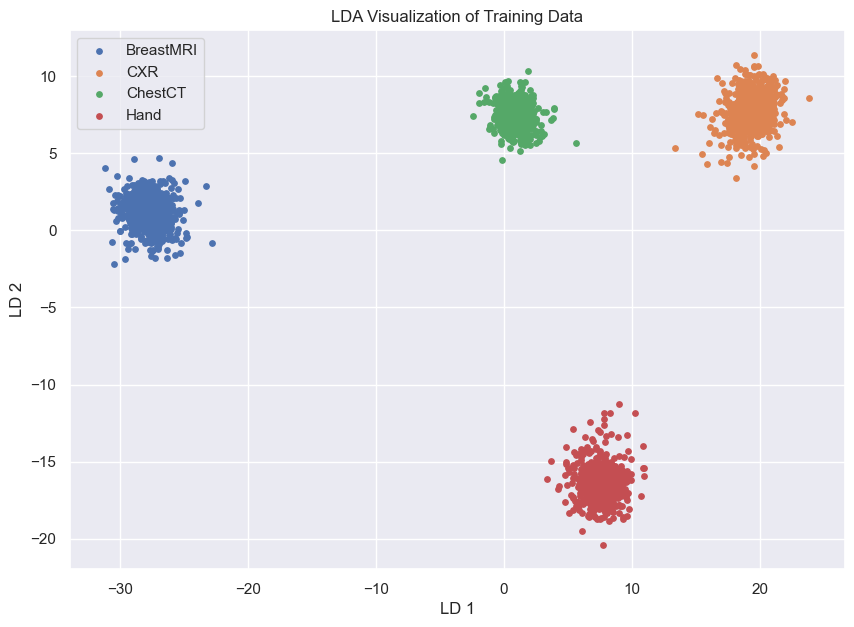

LDA reduced shape (Validation): (804, 2)
LDA reduced shape (Test): (396, 2)


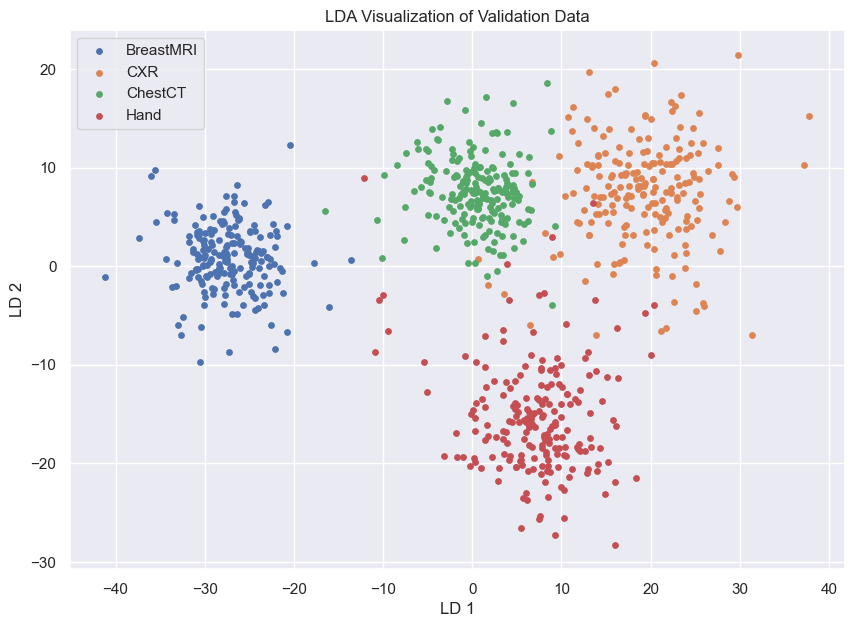

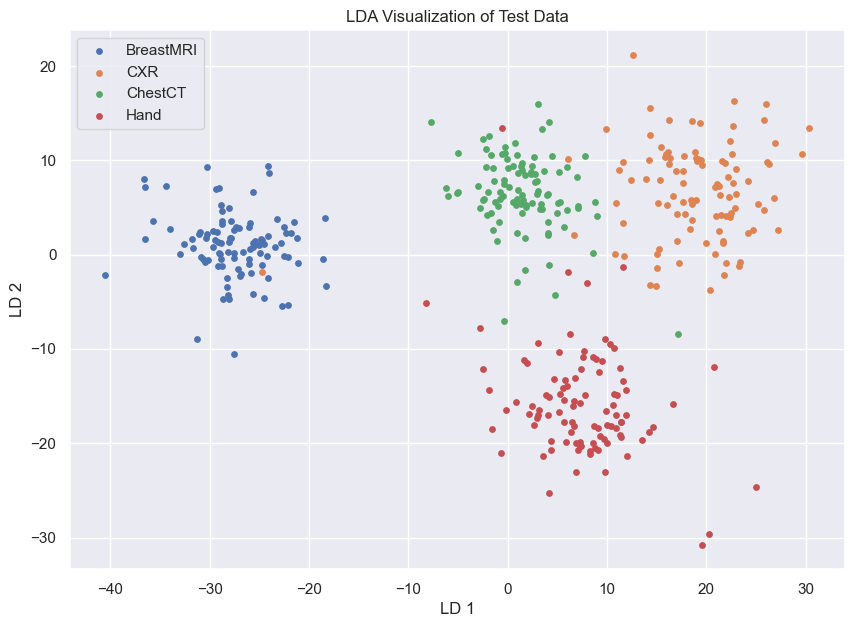

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler

# Εφαρμογή flattening
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_val_flat = X_val.reshape(X_val.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Εφαρμογή standardization (τυποποίηση)
scaler = StandardScaler()
X_train_standardized = scaler.fit_transform(X_train_flat)
X_val_standardized = scaler.transform(X_val_flat)
X_test_standardized = scaler.transform(X_test_flat)

# Εφαρμογή LDA στο Training Set
lda = LinearDiscriminantAnalysis(n_components=2)
X_train_lda = lda.fit_transform(X_train_standardized, y_train)  # Εκπαίδευση LDA και εφαρμογή στο Training Set

# Εκτύπωση του shape των δεδομένων μετά το LDA
print(f"LDA reduced shape (Train): {X_train_lda.shape}")

# Οπτικοποίηση των αποτελεσμάτων LDA στο εκπαιδευτικό σύνολο
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_train):
    idx = np.where(y_train == class_label)
    plt.scatter(X_train_lda[idx, 0], X_train_lda[idx, 1], label=class_label, s=15)
plt.title("LDA Visualization of Training Data")
plt.xlabel("LD 1")
plt.ylabel("LD 2")
plt.legend()
plt.show()

# Εφαρμογή LDA στο Validation Set
X_val_lda = lda.transform(X_val_standardized)

# Εφαρμογή LDA στο Test Set
X_test_lda = lda.transform(X_test_standardized)

# Εκτύπωση των σχημάτων μετά την εφαρμογή LDA για Validation και Test
print(f"LDA reduced shape (Validation): {X_val_lda.shape}")
print(f"LDA reduced shape (Test): {X_test_lda.shape}")

# Οπτικοποίηση του Validation Set μετά την εφαρμογή LDA
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_val):
    idx = np.where(y_val == class_label)
    plt.scatter(X_val_lda[idx, 0], X_val_lda[idx, 1], label=class_label, s=15)
plt.title("LDA Visualization of Validation Data")
plt.xlabel("LD 1")
plt.ylabel("LD 2")
plt.legend()
plt.show()

# Οπτικοποίηση του Test Set μετά την εφαρμογή LDA
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_test):
    idx = np.where(y_test == class_label)
    plt.scatter(X_test_lda[idx, 0], X_test_lda[idx, 1], label=class_label, s=15)
plt.title("LDA Visualization of Test Data")
plt.xlabel("LD 1")
plt.ylabel("LD 2")
plt.legend()
plt.show()


Train Accuracy with LDA: 1.0000
Validation Accuracy with LDA: 0.9366
Test Accuracy with LDA: 0.9242
Classification Report for Training Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       700
         CXR       1.00      1.00      1.00       700
     ChestCT       1.00      1.00      1.00       700
        Hand       1.00      1.00      1.00       700

    accuracy                           1.00      2800
   macro avg       1.00      1.00      1.00      2800
weighted avg       1.00      1.00      1.00      2800

Classification Report for Validation Set:
              precision    recall  f1-score   support

   BreastMRI       0.98      1.00      0.99       201
         CXR       0.90      0.89      0.89       201
     ChestCT       0.90      0.94      0.92       201
        Hand       0.97      0.93      0.95       201

    accuracy                           0.94       804
   macro avg       0.94      0.94      0.94       804
wei

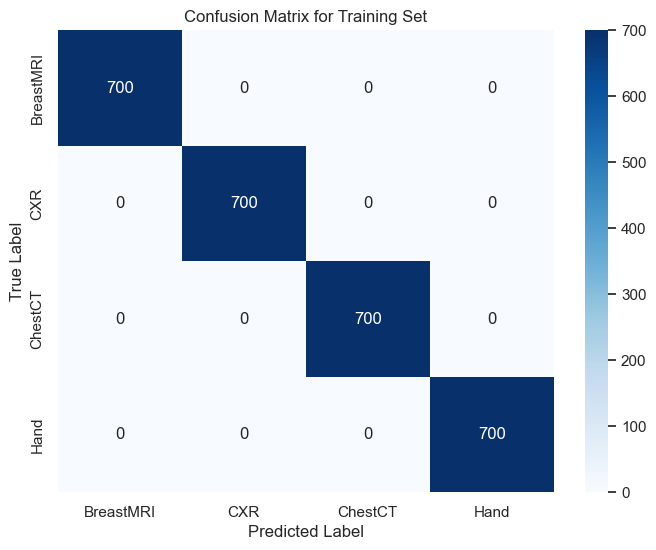

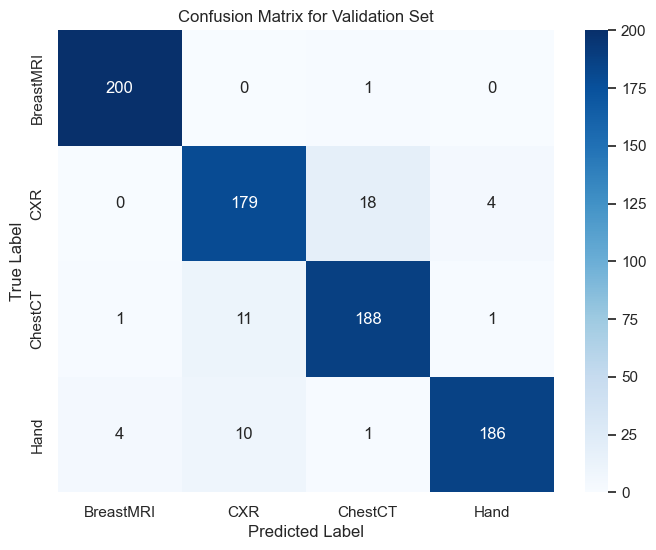

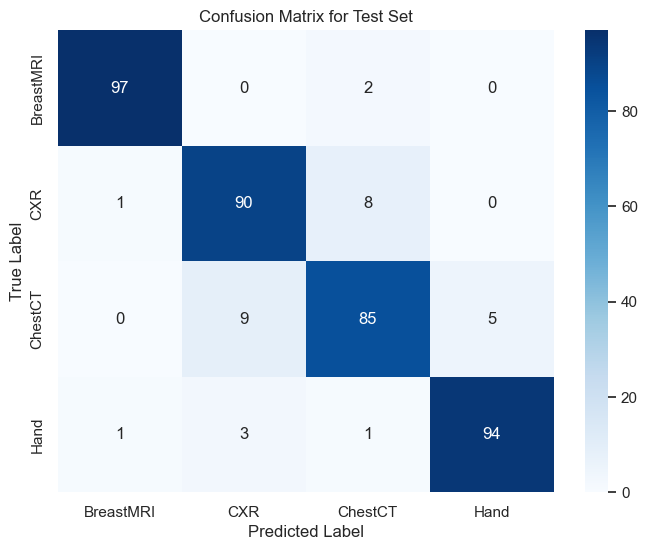

In [17]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Εκπαίδευση Logistic Regression για να δούμε τα αποτελέσματα μετά το LDA
clf_lda = LogisticRegression(max_iter=1000, random_state=42) # μπορούμε να αυξήσουμε και σε max iter 10000 αν χρειάζεται
clf_lda.fit(X_train_lda, y_train)

# Προβλέψεις για το Training Set
y_pred_train_lda = clf_lda.predict(X_train_lda)
train_accuracy_lda = accuracy_score(y_train, y_pred_train_lda)

# Προβλέψεις για το Validation Set
y_pred_val_lda = clf_lda.predict(X_val_lda)
val_accuracy_lda = accuracy_score(y_val, y_pred_val_lda)

# Προβλέψεις για το Test Set
y_pred_test_lda = clf_lda.predict(X_test_lda)
test_accuracy_lda = accuracy_score(y_test, y_pred_test_lda)

# Εκτύπωση των αποτελεσμάτων ακρίβειας
print(f"Train Accuracy with LDA: {train_accuracy_lda:.4f}")
print(f"Validation Accuracy with LDA: {val_accuracy_lda:.4f}")
print(f"Test Accuracy with LDA: {test_accuracy_lda:.4f}")

# Εκτύπωση του Classification Report για το Training Set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train_lda))

# Εκτύπωση Classification Report για Validation Set
print("Classification Report for Validation Set:")
print(classification_report(y_val, y_pred_val_lda))

# Εκτύπωση του Classification Report για το Test Set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test_lda))

# Εκτύπωση του Confusion Matrix για το Training Set
print("Confusion Matrix for Training Set:")
cm_train_lda = confusion_matrix(y_train, y_pred_train_lda)
print(cm_train_lda)

# Εκτύπωση του Confusion Matrix για το Validation Set
print("Confusion Matrix for Validation Set:")
cm_val_lda = confusion_matrix(y_val, y_pred_val_lda)
print(cm_val_lda)

# Εκτύπωση του Confusion Matrix για το Test Set
print("Confusion Matrix for Test Set:")
cm_test_lda = confusion_matrix(y_test, y_pred_test_lda)
print(cm_test_lda)

# Οπτικοποίηση του Confusion Matrix για το Training Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train_lda, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.title("Confusion Matrix for Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Validation Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_val_lda, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_val), yticklabels=np.unique(y_val))
plt.title("Confusion Matrix for Validation Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Test Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test_lda, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title("Confusion Matrix for Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Iδιαίτερα η accuracy στο validation και test set με LDA παρατηρούμε ότι είναι μικρότερες από τις αντίστοιχες του PCA. Ενδεχομένως, το PCA να είναι πιο ευέλικτο στην κατηγοριοποίηση εικόνας όταν τα δεδομένα είναι πιο σύνθετα ή όταν οι κατηγορίες είναι πιο ασαφείς.

Και οι δύο μέθοδοι, ωστόσο, επιτυγχάνουν εξαιρετική γενίκευση στα δεδομένα δοκιμής και είναι αποτελεσματικές για τη συγκεκριμένη εργασία κατηγοριοποίησης εικόνας. Ας δοκιμάσουμε και t-SNE

Original shapes:
X_train shape: (2800, 64, 64)
X_val shape: (804, 64, 64)
X_test shape: (396, 64, 64)

Shapes after flattening:
X_train_flat shape: (2800, 4096)
X_val_flat shape: (804, 4096)
X_test_flat shape: (396, 4096)


c:\Users\demh_\anaconda3\envs\myenv\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
found 0 physical cores < 1
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\demh_\anaconda3\envs\myenv\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")



t-SNE output shapes:
X_train_tsne shape: (2800, 2)


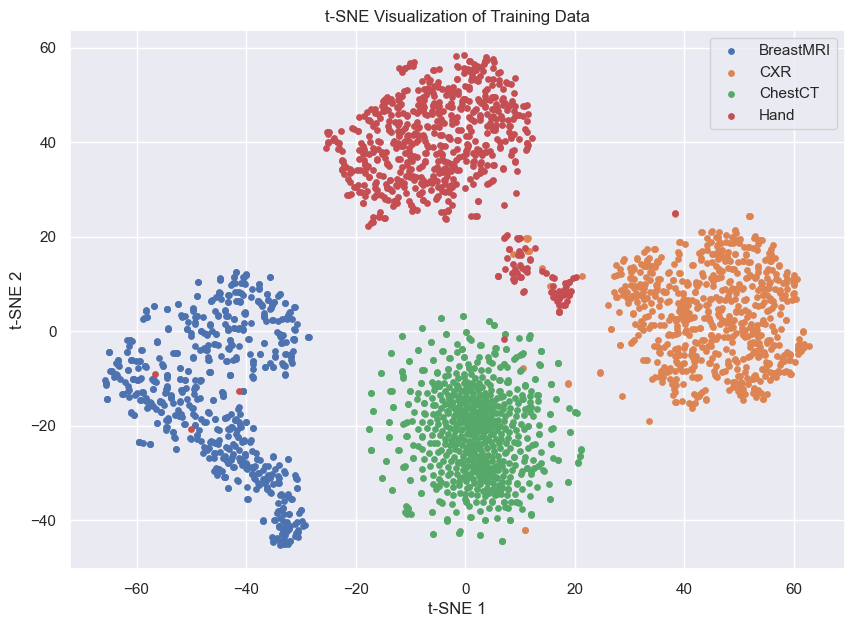

X_val_tsne shape: (804, 2)


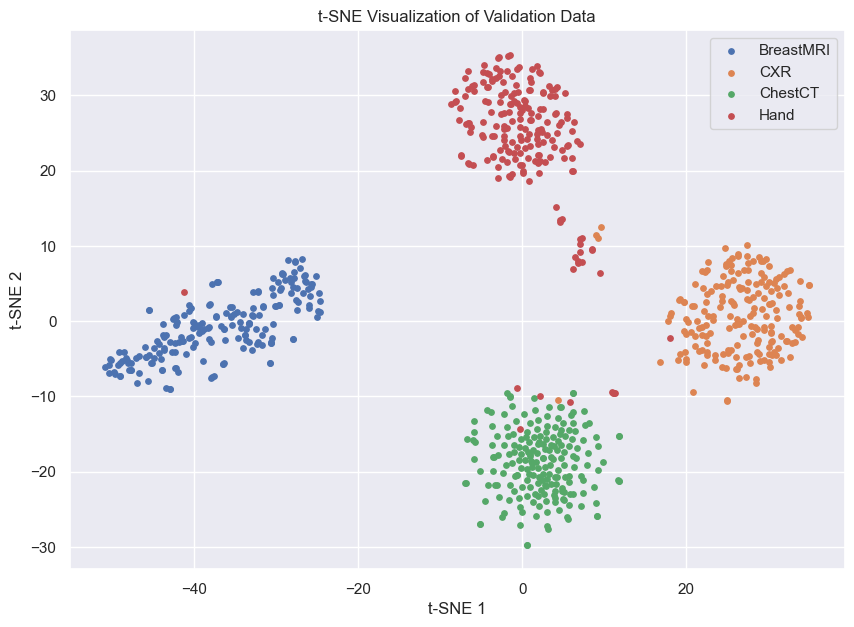

X_test_tsne shape: (396, 2)


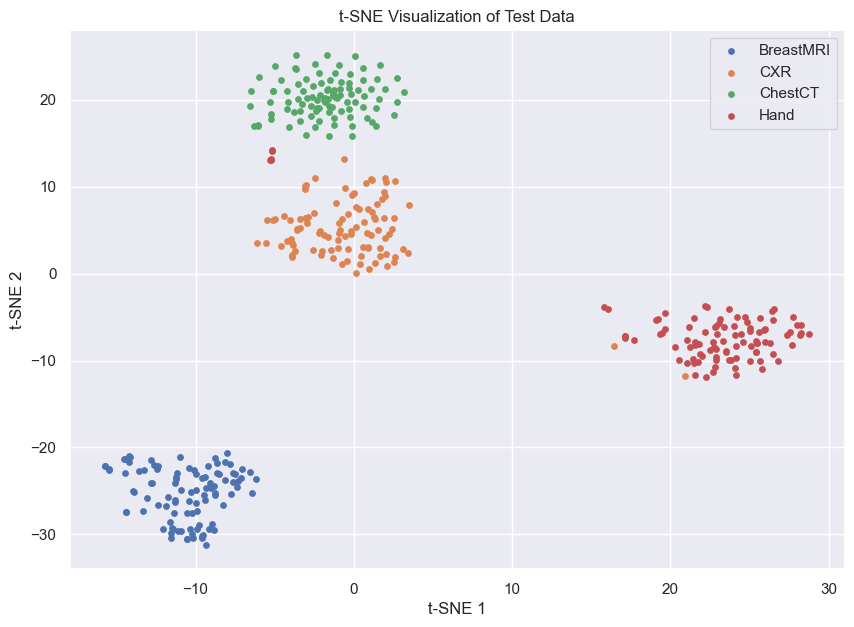

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

# 1. Εμφάνιση του αρχικού σχήματος των δεδομένων
print("Original shapes:")
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"X_test shape: {X_test.shape}")

# 2. Εφαρμογή Flattening στα δεδομένα
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_val_flat = X_val.reshape(X_val.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Εκτύπωση σχήματος μετά το flattening
print("\nShapes after flattening:")
print(f"X_train_flat shape: {X_train_flat.shape}")
print(f"X_val_flat shape: {X_val_flat.shape}")
print(f"X_test_flat shape: {X_test_flat.shape}")

# 3. Εφαρμογή Standardization (τυποποίηση) στα δεδομένα
scaler = StandardScaler()
X_train_standardized = scaler.fit_transform(X_train_flat)
X_val_standardized = scaler.transform(X_val_flat)
X_test_standardized = scaler.transform(X_test_flat)

# 4. Εφαρμογή t-SNE στο Training Set (2D)
tsne_train = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_train_tsne = tsne_train.fit_transform(X_train_standardized)

# Εκτύπωση σχήματος μετά το t-SNE
print("\nt-SNE output shapes:")
print(f"X_train_tsne shape: {X_train_tsne.shape}")

# 5. Οπτικοποίηση του αποτελέσματος του t-SNE για το Training Set
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_train):
    idx = np.where(y_train == class_label)
    plt.scatter(X_train_tsne[idx, 0], X_train_tsne[idx, 1], label=class_label, s=15)
plt.title("t-SNE Visualization of Training Data")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend()
plt.show()

# 6. Εφαρμογή t-SNE στο Validation Set (2D)
tsne_val = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_val_tsne = tsne_val.fit_transform(X_val_standardized)

# Εκτύπωση σχήματος για το Validation Set
print(f"X_val_tsne shape: {X_val_tsne.shape}")

# Οπτικοποίηση του αποτελέσματος του t-SNE για το Validation Set
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_val):
    idx = np.where(y_val == class_label)
    plt.scatter(X_val_tsne[idx, 0], X_val_tsne[idx, 1], label=class_label, s=15)
plt.title("t-SNE Visualization of Validation Data")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend()
plt.show()

# 7. Εφαρμογή t-SNE στο Test Set (2D)
tsne_test = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_test_tsne = tsne_test.fit_transform(X_test_standardized)

# Εκτύπωση σχήματος για το Test Set
print(f"X_test_tsne shape: {X_test_tsne.shape}")

# Οπτικοποίηση του αποτελέσματος του t-SNE για το Test Set
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_test):
    idx = np.where(y_test == class_label)
    plt.scatter(X_test_tsne[idx, 0], X_test_tsne[idx, 1], label=class_label, s=15)
plt.title("t-SNE Visualization of Test Data")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend()
plt.show()


Παρατηρούμε ότι οι κατηγορίες διαχωρίζονται σε δύο διαστάσεις με αρκετά σαφή τρόπο στο training, validation και test set. Φαίνεται πως το t-SNE είναι ικανό να αναδείξει τα ιδιαίτερα χαρακτηριστικά των δεδομένων σε χαμηλότερες διαστάσεις, κάτι που είναι χρήσιμο για την οπτικοποίηση.

Train Accuracy with t-SNE: 0.9907
Validation Accuracy with t-SNE: 0.9751
Test Accuracy with t-SNE: 0.0126
Classification Report for Training Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       700
         CXR       0.99      0.98      0.98       700
     ChestCT       0.99      1.00      1.00       700
        Hand       0.99      0.98      0.98       700

    accuracy                           0.99      2800
   macro avg       0.99      0.99      0.99      2800
weighted avg       0.99      0.99      0.99      2800

Classification Report for Validation Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       201
         CXR       1.00      0.95      0.97       201
     ChestCT       0.93      1.00      0.96       201
        Hand       0.98      0.95      0.97       201

    accuracy                           0.98       804
   macro avg       0.98      0.98      0.98       8

c:\Users\demh_\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\demh_\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\demh_\anaconda3\envs\myenv\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


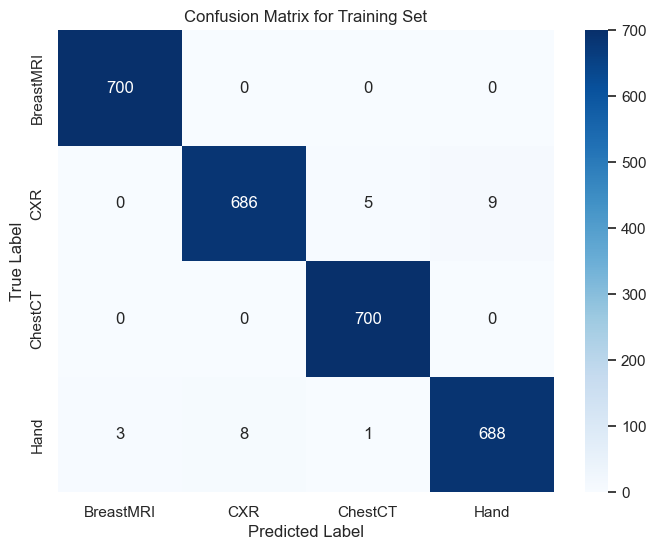

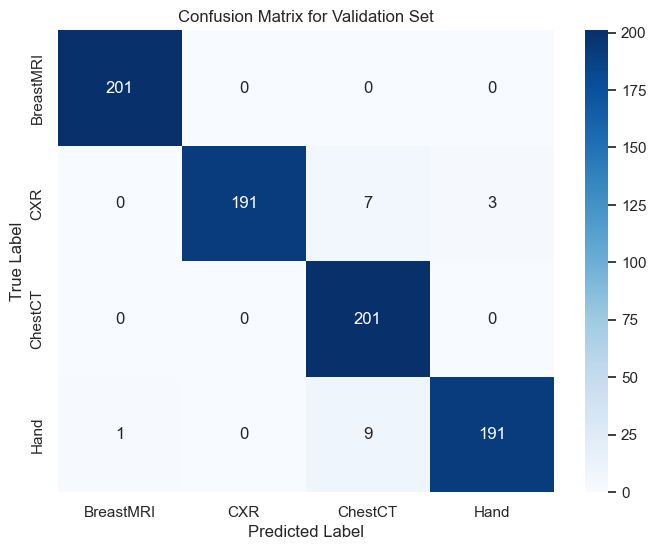

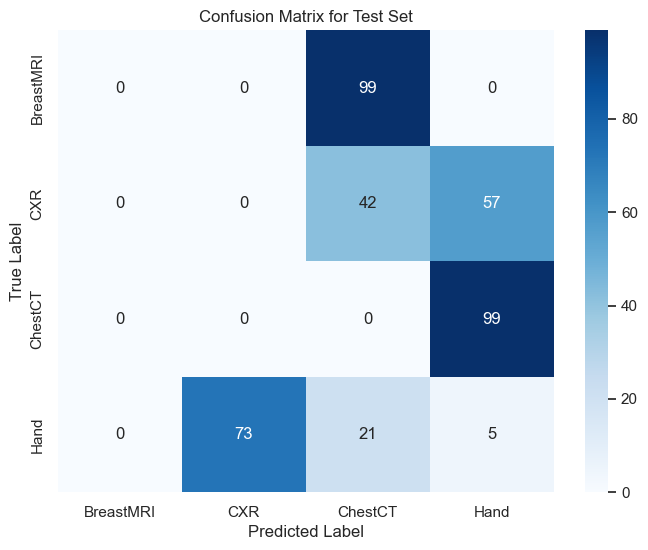

In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Εκπαίδευση του Logistic Regression πάνω στα δεδομένα του t-SNE
clf_tsne = LogisticRegression(max_iter=1000, random_state=42) # μπορούμε να αυξήσουμε και σε max iter 10000 αν χρειάζεται

clf_tsne.fit(X_train_tsne, y_train)

# Προβλέψεις για το Training Set
y_pred_train_tsne = clf_tsne.predict(X_train_tsne)
train_accuracy_tsne = accuracy_score(y_train, y_pred_train_tsne)

# Προβλέψεις για το Validation Set
y_pred_val_tsne = clf_tsne.predict(X_val_tsne)
val_accuracy_tsne = accuracy_score(y_val, y_pred_val_tsne)

# Προβλέψεις για το Test Set
y_pred_test_tsne = clf_tsne.predict(X_test_tsne)
test_accuracy_tsne = accuracy_score(y_test, y_pred_test_tsne)

# Εκτύπωση των αποτελεσμάτων ακρίβειας
print(f"Train Accuracy with t-SNE: {train_accuracy_tsne:.4f}")
print(f"Validation Accuracy with t-SNE: {val_accuracy_tsne:.4f}")
print(f"Test Accuracy with t-SNE: {test_accuracy_tsne:.4f}")

# Εκτύπωση του Classification Report για το Training Set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train_tsne))

# Εκτύπωση του Classification Report για το Validation Set
print("Classification Report for Validation Set:")
print(classification_report(y_val, y_pred_val_tsne))

# Εκτύπωση του Classification Report για το Test Set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test_tsne))

# Εκτύπωση του Confusion Matrix για το Training Set
cm_train = confusion_matrix(y_train, y_pred_train_tsne)
print("Confusion Matrix for Training Set:")
print(cm_train)

# Εκτύπωση του Confusion Matrix για το Validation Set
cm_val = confusion_matrix(y_val, y_pred_val_tsne)
print("Confusion Matrix for Validation Set:")
print(cm_val)

# Εκτύπωση του Confusion Matrix για το Test Set
cm_test = confusion_matrix(y_test, y_pred_test_tsne)
print("Confusion Matrix for Test Set:")
print(cm_test)

# Οπτικοποίηση του Confusion Matrix για το Training Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.title("Confusion Matrix for Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Validation Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_val, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_val), yticklabels=np.unique(y_val))
plt.title("Confusion Matrix for Validation Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Test Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title("Confusion Matrix for Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Παρατηρούμε ότι η Logistic Regression μετά από την εφαρμογή t-SNE στα δεδομένα δεν έχει τόσο καλή απόδοση όσο η Logistic regression στα δεδομένα που έχουν υποστεί PCA ή LDA. Αυτό μπορεί να οφείλεται στο γεγονός ότι το t-SNE είναι μια μη γραμμική μέθοδος μείωσης διαστάσεων και χρησιμοποιείται κυρίως για την οπτικοποίηση των δεδομένων. Το t-SNE, δηλαδή, χρησιμοποιήθηκε κυρίως για τη 2D οπτικοποίηση των δεδομένων. Παρότι έγινε και δοκιμή ταξινόμησης πάνω στα μετασχηματισμένα δεδομένα, δεν ενδείκνυται για τέτοια χρήση, διότι το t-SNE δεν είναι μετασχηματισμός που μπορεί να εφαρμοστεί με συνέπεια σε νέα δεδομένα. Επομένως, τα αποτελέσματα ταξινόμησης με t-SNE κρίνονται ενδεικτικά και όχι αξιόπιστα.

Δοκιμάζουμε να εφαρμόσουμε LDA πάνω στα δεδομένα που προκέκυψαν από PCA, προκειμένου να εξετάσουμε αν αυτή η μέθοδος θα μπορούσε να βελτιώσει περαιτέρω την απόδοση του μοντέλου ταξινόμησης.

LDA after PCA reduced shape (Train): (2800, 2)
LDA after PCA reduced shape (Validation): (804, 2)
LDA after PCA reduced shape (Test): (396, 2)


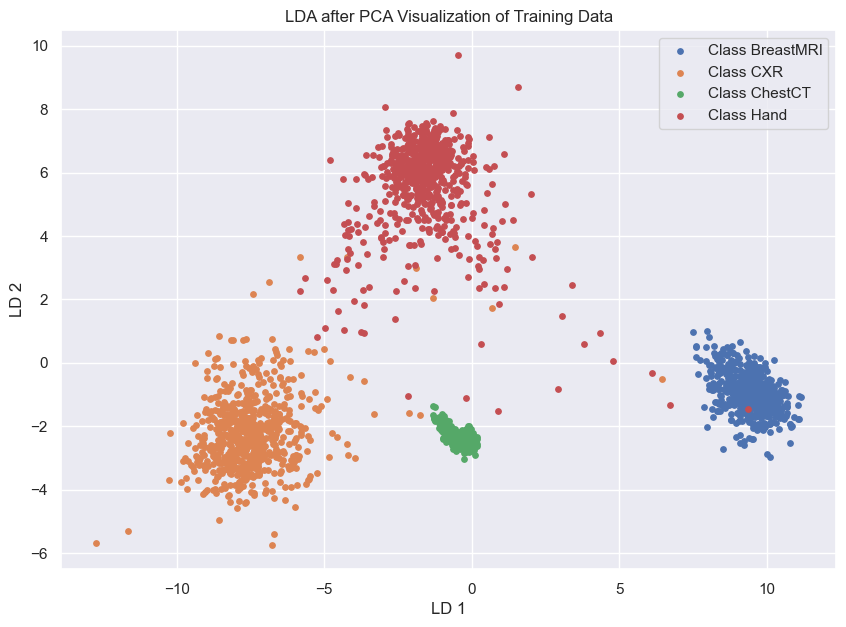

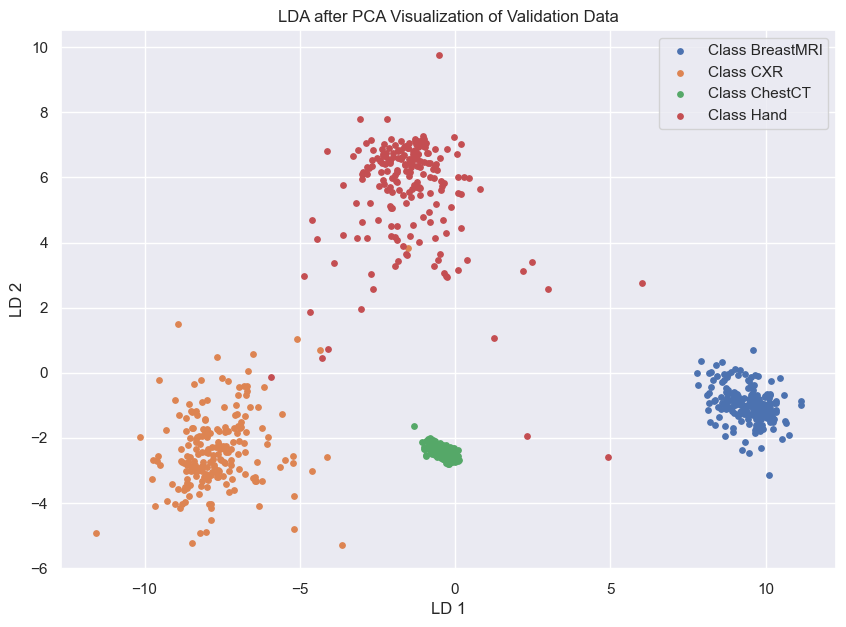

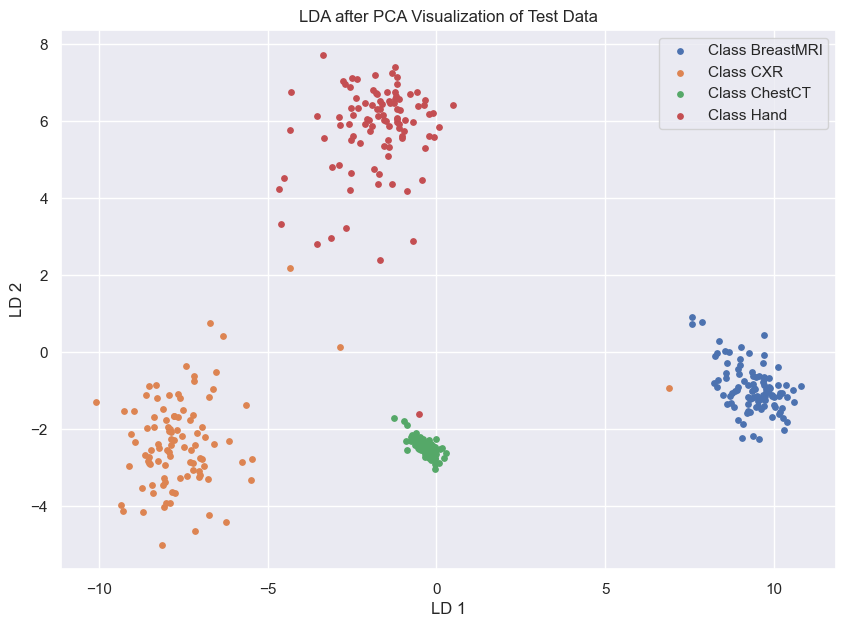

In [20]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import matplotlib.pyplot as plt

# Εφαρμογή LDA στο Training Set (Πάνω στα δεδομένα του PCA) με 2 διαστάσεις
lda = LinearDiscriminantAnalysis(n_components=2)  # Αλλάζουμε σε 2 διαστάσεις
X_train_lda_after_pca = lda.fit_transform(X_train_pca, y_train)

# Εφαρμογή LDA στο Validation και Test Set (Πάνω στα δεδομένα του PCA)
# Εφαρμογή LDA στο Validation και Test Set
X_val_lda_after_pca = lda.transform(X_val_pca) # Εφαρμογή LDA πάνω στα δεδομένα PCA
X_test_lda_after_pca = lda.transform(X_test_pca) # Εφαρμογή LDA πάνω στα δεδομένα PCA

# Εκτύπωση των σχημάτων μετά την εφαρμογή LDA για Validation και Test
print(f"LDA after PCA reduced shape (Train): {X_train_lda_after_pca.shape}")
print(f"LDA after PCA reduced shape (Validation): {X_val_lda_after_pca.shape}")
print(f"LDA after PCA reduced shape (Test): {X_test_lda_after_pca.shape}")

# Οπτικοποίηση των δεδομένων LDA για το Training Set
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_train):
    idx = np.where(y_train == class_label)
    plt.scatter(X_train_lda_after_pca[idx, 0], X_train_lda_after_pca[idx, 1], label=f"Class {class_label}", s=15)
plt.title("LDA after PCA Visualization of Training Data")
plt.xlabel("LD 1")
plt.ylabel("LD 2")
plt.legend()
plt.show()

# Οπτικοποίηση του Validation Set μετά την εφαρμογή LDA
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_val):
    idx = np.where(y_val == class_label)
    plt.scatter(X_val_lda_after_pca[idx, 0], X_val_lda_after_pca[idx, 1], label=f"Class {class_label}", s=15)
plt.title("LDA after PCA Visualization of Validation Data")
plt.xlabel("LD 1")
plt.ylabel("LD 2")
plt.legend()
plt.show()

# Οπτικοποίηση του Test Set μετά την εφαρμογή LDA
plt.figure(figsize=(10, 7))
for class_label in np.unique(y_test):
    idx = np.where(y_test == class_label)
    plt.scatter(X_test_lda_after_pca[idx, 0], X_test_lda_after_pca[idx, 1], label=f"Class {class_label}", s=15)
plt.title("LDA after PCA Visualization of Test Data")
plt.xlabel("LD 1")
plt.ylabel("LD 2")
plt.legend()
plt.show()


Train Accuracy with LDA after PCA: 0.9925
Validation Accuracy with LDA after PCA: 0.9900
Test Accuracy with LDA after PCA: 0.9899
Classification Report for Training Set (LDA after PCA):
              precision    recall  f1-score   support

   BreastMRI       0.99      1.00      1.00       700
         CXR       0.99      0.99      0.99       700
     ChestCT       0.99      1.00      1.00       700
        Hand       0.99      0.98      0.99       700

    accuracy                           0.99      2800
   macro avg       0.99      0.99      0.99      2800
weighted avg       0.99      0.99      0.99      2800

Classification Report for Validation Set (LDA after PCA):
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       201
         CXR       0.99      0.99      0.99       201
     ChestCT       0.98      1.00      0.99       201
        Hand       0.99      0.98      0.98       201

    accuracy                           0.99      

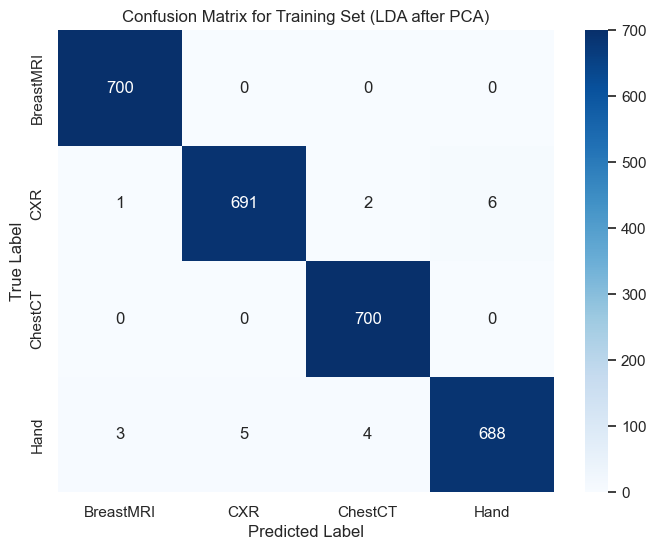

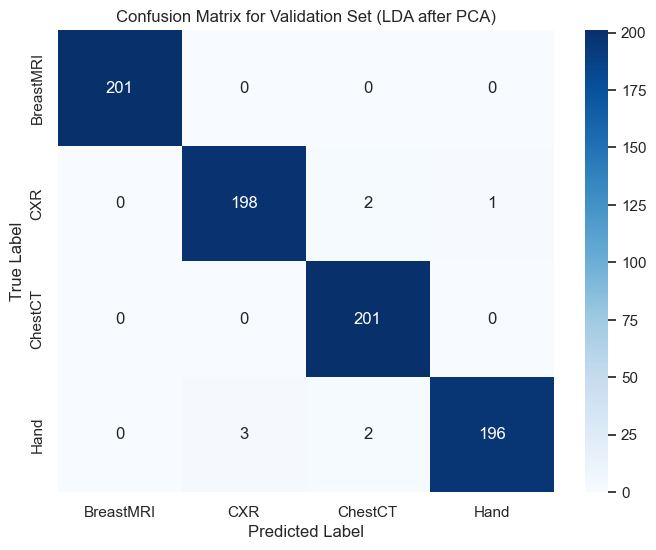

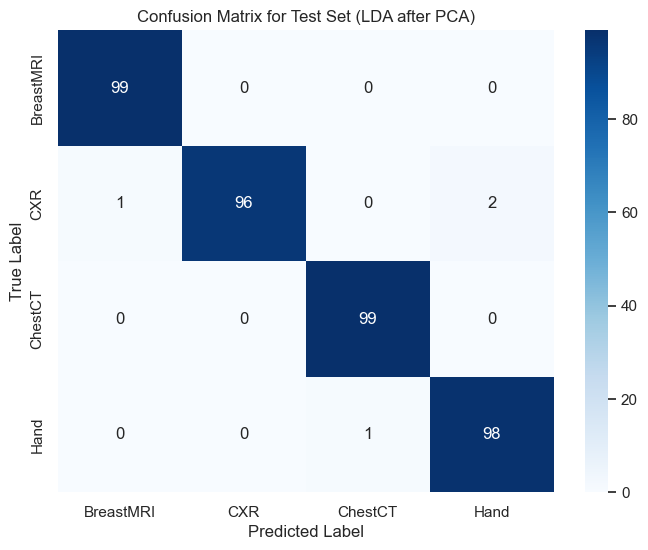

In [21]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Εκπαίδευση Logistic Regression για να δούμε τα αποτελέσματα μετά το LDA που εφαρμόστηκε σε δεδομένα PCA
clf_lda_pca = LogisticRegression(max_iter=1000, random_state=42)  # Μπορούμε να αυξήσουμε max_iter σε 10000 αν χρειάζεται
clf_lda_pca.fit(X_train_lda_after_pca, y_train)  # Εκπαίδευση του μοντέλου με τα δεδομένα LDA μετά το PCA

# Προβλέψεις για το Training Set
y_pred_train_lda_pca = clf_lda_pca.predict(X_train_lda_after_pca)
train_accuracy_lda_pca = accuracy_score(y_train, y_pred_train_lda_pca)

# Προβλέψεις για το Validation Set
y_pred_val_lda_pca = clf_lda_pca.predict(X_val_lda_after_pca)
val_accuracy_lda_pca = accuracy_score(y_val, y_pred_val_lda_pca)

# Προβλέψεις για το Test Set
y_pred_test_lda_pca = clf_lda_pca.predict(X_test_lda_after_pca)
test_accuracy_lda_pca = accuracy_score(y_test, y_pred_test_lda_pca)

# Εκτύπωση των αποτελεσμάτων ακρίβειας
print(f"Train Accuracy with LDA after PCA: {train_accuracy_lda_pca:.4f}")
print(f"Validation Accuracy with LDA after PCA: {val_accuracy_lda_pca:.4f}")
print(f"Test Accuracy with LDA after PCA: {test_accuracy_lda_pca:.4f}")

# Εκτύπωση του Classification Report για το Training Set
print("Classification Report for Training Set (LDA after PCA):")
print(classification_report(y_train, y_pred_train_lda_pca))

# Εκτύπωση Classification Report για Validation Set
print("Classification Report for Validation Set (LDA after PCA):")
print(classification_report(y_val, y_pred_val_lda_pca))

# Εκτύπωση του Classification Report για το Test Set
print("Classification Report for Test Set (LDA after PCA):")
print(classification_report(y_test, y_pred_test_lda_pca))

# Εκτύπωση του Confusion Matrix για το Training Set
print("Confusion Matrix for Training Set (LDA after PCA):")
cm_train_lda_pca = confusion_matrix(y_train, y_pred_train_lda_pca)
print(cm_train_lda_pca)

# Εκτύπωση του Confusion Matrix για το Validation Set
print("Confusion Matrix for Validation Set (LDA after PCA):")
cm_val_lda_pca = confusion_matrix(y_val, y_pred_val_lda_pca)
print(cm_val_lda_pca)

# Εκτύπωση του Confusion Matrix για το Test Set
print("Confusion Matrix for Test Set (LDA after PCA):")
cm_test_lda_pca = confusion_matrix(y_test, y_pred_test_lda_pca)
print(cm_test_lda_pca)

# Οπτικοποίηση του Confusion Matrix για το Training Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train_lda_pca, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.title("Confusion Matrix for Training Set (LDA after PCA)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Validation Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_val_lda_pca, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_val), yticklabels=np.unique(y_val))
plt.title("Confusion Matrix for Validation Set (LDA after PCA)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Test Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test_lda_pca, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title("Confusion Matrix for Test Set (LDA after PCA)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Τα αποτελέσματα που προέκυψαν από την εφαρμογή της LDA πάνω στα δεδομένα που είχαν ήδη υποστεί PCA, δείχνουν πως η ακρίβεια και στα 3 sets (train, validation, test) μειώθηκε.

Συνοπτικά:

Accuracy without dimensional reduction: Training 1.0000, Validation	0.9950, Test 0.9975 
Accuracy PCA: Training 1.0000, Validation 0.9925, Test 0.9949,
Accuracy LDA: Training 1.0000, Validation 0.9366, Test 0.9242	
Accuracy t-SNE: Training 0.9907, Validation 0.9751, Test 0.0126	
Accuracy LDA after PCA: Training 0.9925, Validation 0.9900, Test 0.9899

Επομένως, από τις δοκιμές που πραγματοποιήσαμε καταλάβαμε ότι για μείωση διαστάσεων είναι προτιμότερη η εφαρμογή μόνο PCA.

Εφαρμόζουμε τεχνική grid search (cross validation) για Logistic Regression στα δεδομένα που έχουν υποστεί PCA.

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best parameters found:  {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00        99
         CXR       1.00      0.99      0.99        99
     ChestCT       1.00      1.00      1.00        99
        Hand       0.99      1.00      0.99        99

    accuracy                           1.00       396
   macro avg       1.00      1.00      1.00       396
weighted avg       1.00      1.00      1.00       396

Accuracy:  0.9974747474747475
ROC-AUC:  0.9981124375063769
Shape of X_test_pca: (396, 50)


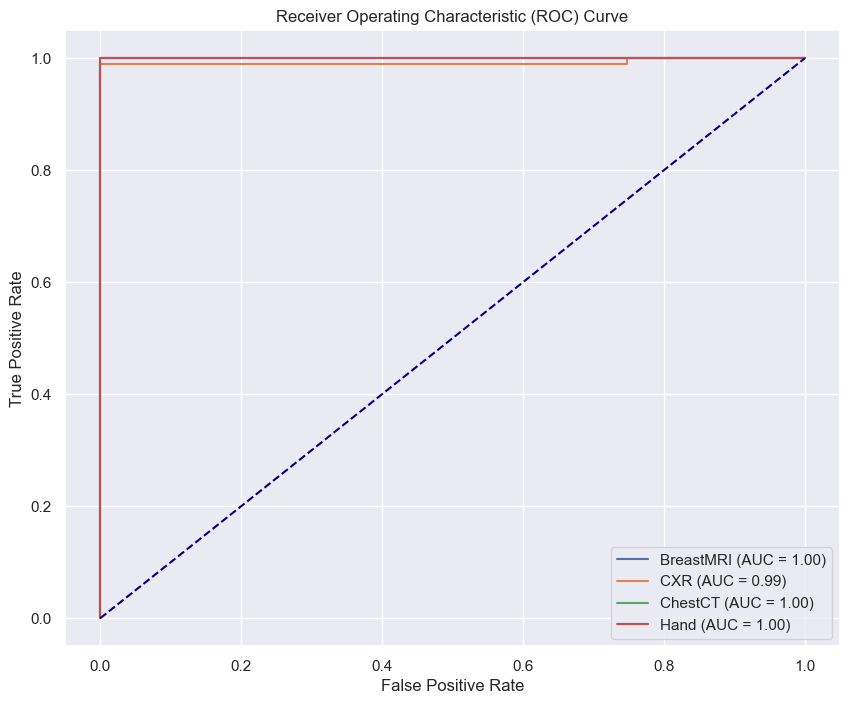

In [22]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear'],  
    'penalty': ['l1', 'l2']
}

# Ορισμός του Logistic Regression
logreg = LogisticRegression(max_iter=1000, random_state=42)

# Ορισμός του GridSearchCV για την εύρεση των καλύτερων υπερπαραμέτρων
grid_search = GridSearchCV(logreg, param_grid, cv=5, n_jobs=-1, verbose=1)

# Εκπαίδευση του μοντέλου με την καλύτερη παραμέτρους
grid_search.fit(X_train_pca, y_train)  # Χρησιμοποιούμε τα δεδομένα με PCA

# Εμφάνιση των καλύτερων υπερπαραμέτρων
print("Best parameters found: ", grid_search.best_params_)

# Κάνουμε προβλέψεις για το test set
y_pred = grid_search.best_estimator_.predict(X_test_pca)  # Χρησιμοποιούμε τα PCA δεδομένα

# Εκτύπωση classification report
print(classification_report(y_test, y_pred))

# Accuracy
print("Accuracy: ", accuracy_score(y_test, y_pred))

# ROC-AUC (για πολλαπλή ταξινόμηση)
print("ROC-AUC: ", roc_auc_score(y_test, grid_search.best_estimator_.predict_proba(X_test_pca), multi_class='ovr'))

# Ελέγξτε τις διαστάσεις των δεδομένων
print("Shape of X_test_pca:", X_test_pca.shape)

# Αν χρειαστεί να κάνουμε reshape για να βεβαιωθούμε ότι το X_test_pca είναι 2D
X_test_pca = X_test_pca.reshape(X_test_pca.shape[0], -1)

# Προβλέψεις πιθανότητας για κάθε κλάση
y_pred_prob = grid_search.best_estimator_.predict_proba(X_test_pca)

# Binarize the labels (κανόνας για πολλαπλές κλάσεις)
unique_classes = np.unique(y_test)
y_test_bin = label_binarize(y_test, classes=unique_classes)

# Δημιουργία της ROC Curve για κάθε κλάση
fpr = {}
tpr = {}
roc_auc = {}

# Για κάθε κλάση
for i in range(len(unique_classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Οπτικοποίηση των ROC curves
plt.figure(figsize=(10, 8))

for i in range(len(unique_classes)):
    plt.plot(fpr[i], tpr[i], label=f'{unique_classes[i]} (AUC = {roc_auc[i]:.2f})')

# ROC Curve για το "random classifier"
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Ρυθμίσεις της εμφάνισης του γραφήματος
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

Απο τα αποτελέσματα μετά το Grid Search, βλέπουμε πως η accuracy ανήλθε σε 0.9980 και το ROC-AUC σε 1.0 (για όλες σχεδόν τις κατηγορίες), δείχνοντας βελτίωση στην απόδοση και καλύτερη διάκριση των κλάσεων. 

Κατηγορίες (LabelEncoder): ['BreastMRI' 'CXR' 'ChestCT' 'Hand']


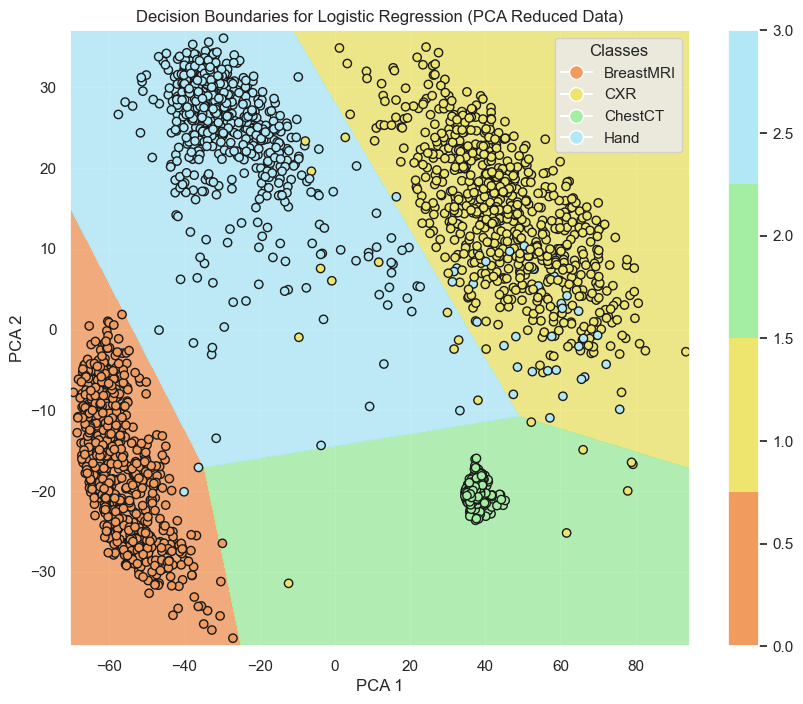

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import ListedColormap

# Μετατροπή των κατηγοριών σε αριθμητικές τιμές με LabelEncoder
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)  # Κωδικοποιούμε τις κατηγορίες του training set

# Αν οι διαστάσεις του PCA είναι περισσότερες από 2, περιορίζουμε τα δεδομένα στις δύο πρώτες διαστάσεις
X_pca_2d = X_train_pca[:, :2]  # Χρησιμοποιούμε μόνο τις δύο πρώτες διαστάσεις

# Εκπαίδευση του Logistic Regression στα 2D δεδομένα
clf = LogisticRegression(max_iter=1000, random_state=42)
clf.fit(X_pca_2d, y_train_encoded)  # Χρησιμοποιούμε τις κωδικοποιημένες ετικέτες

# Δημιουργία πλέγματος για τις προβλέψεις
h = .02  # Βήμα για την περιοχή των δεδομένων

x_min, x_max = X_pca_2d[:, 0].min() - 1, X_pca_2d[:, 0].max() + 1
y_min, y_max = X_pca_2d[:, 1].min() - 1, X_pca_2d[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Προβλέψεις για κάθε σημείο του πλέγματος
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

# Εξασφαλίζουμε ότι το Z είναι 1D με αριθμητικά δεδομένα
Z = Z.reshape(xx.shape)

# Δημιουργία προσαρμοσμένου χρωματικού πίνακα
# Προσδιορίζουμε τα χρώματα χειροκίνητα για κάθε κατηγορία
colors = ["#F29B5E", "#EEE56F", "#A3EEA3", "#B2E8F6"]  # Χρώματα για τις κατηγορίες (χρησιμοποιούμε ακριβή χρώματα)
custom_cmap = ListedColormap(colors)

# Χρωματισμός περιοχών απόφασης με τον προσαρμοσμένο χρωματικό πίνακα
plt.figure(figsize=(10, 8))

# Χρωματίζουμε τα όρια απόφασης
plt.contourf(xx, yy, Z, alpha=0.8, cmap=custom_cmap)

# Χρωματίζουμε τα σημεία των δεδομένων
scatter = plt.scatter(X_pca_2d[:, 0], X_pca_2d[:, 1], c=y_train_encoded, cmap=custom_cmap, edgecolors='k', marker='o')

# Ρυθμίσεις για τα labels
plt.title("Decision Boundaries for Logistic Regression (PCA Reduced Data)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.colorbar(scatter)  # Εμφανίζουμε τον χρωματικό πίνακα

# Επαλήθευση των κατηγοριών (LabelEncoder)
print("Κατηγορίες (LabelEncoder):", le.classes_)  # Εκτύπωση των κατηγοριών

# Δημιουργία του legend με τα χειροκίνητα χρώματα
unique_classes = le.classes_  # Ανάκτηση των αρχικών κατηγοριών από τον LabelEncoder
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=custom_cmap(i / len(unique_classes)), markersize=10, label=unique_classes[i]) for i in range(len(unique_classes))]
plt.legend(handles=handles, title="Classes", loc="best")

# Εμφάνιση του γραφήματος
plt.show()

Οπτικοποιήσαμε τα decision boundaries που καθορίζουν την κατηγοριοποίηση των δεδομένων στον 2D χώρο. Χρησιμοποιήθηκε Label Encoding για την κωδικοποίηση των κατηγοριών, και το διάγραμμα απεικονίζει τα όρια απόφασης και την κατανομή των δεδομένων από το training set.




Support Vector Machines χρησιμοποιώντας τα δεδομένα που έχουν υποστεί PCA 

Train Accuracy with SVM (PCA): 1.0000
Validation Accuracy with SVM (PCA): 0.9950
Test Accuracy with SVM (PCA): 0.9949
Classification Report for Training Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       700
         CXR       1.00      1.00      1.00       700
     ChestCT       1.00      1.00      1.00       700
        Hand       1.00      1.00      1.00       700

    accuracy                           1.00      2800
   macro avg       1.00      1.00      1.00      2800
weighted avg       1.00      1.00      1.00      2800

Classification Report for Validation Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       201
         CXR       0.99      0.99      0.99       201
     ChestCT       1.00      1.00      1.00       201
        Hand       0.99      0.99      0.99       201

    accuracy                           1.00       804
   macro avg       1.00      1.00      

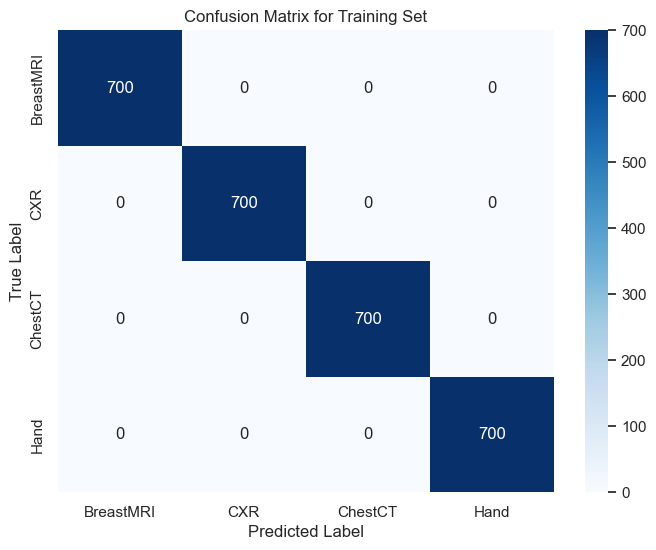

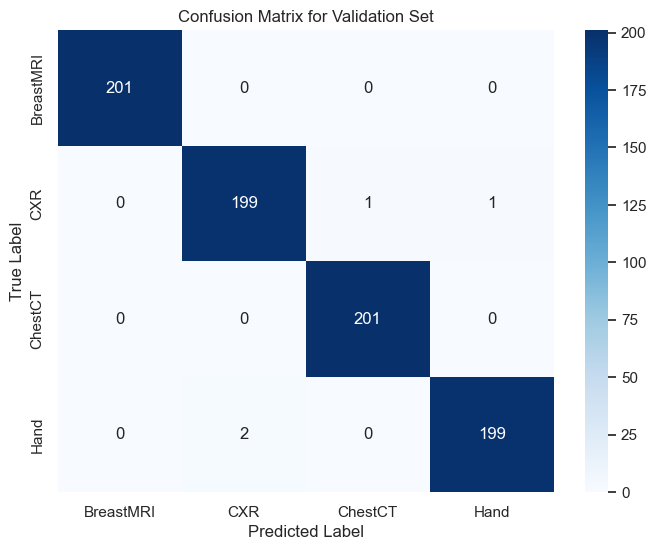

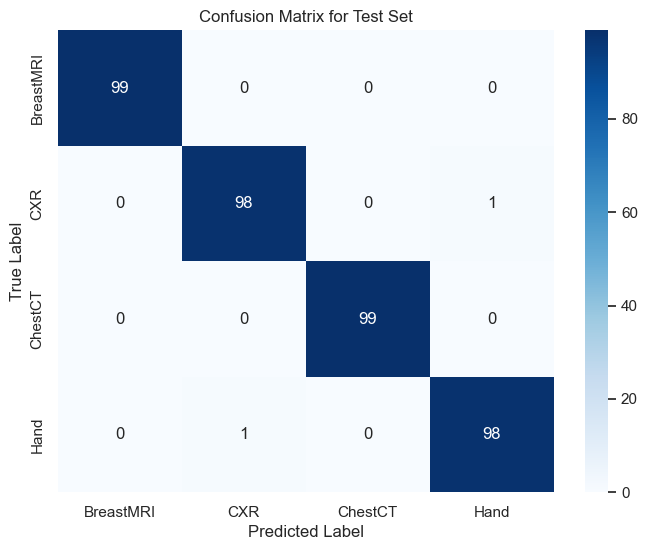

In [24]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Εκπαίδευση του SVM με τα δεδομένα που προκύπτουν από το PCA
clf_svm = SVC(kernel='linear', probability=True)  # Ενεργοποιεί την πιθανότητα προβλέψεων
clf_svm.fit(X_train_pca, y_train)  # Χρησιμοποιούμε τα δεδομένα από το PCA

# Προβλέψεις για το Training Set
y_pred_train_svm = clf_svm.predict(X_train_pca)  # Προβλέψεις για το Training Set
train_accuracy_svm = accuracy_score(y_train, y_pred_train_svm)

# Προβλέψεις για το Validation Set
y_pred_val_svm = clf_svm.predict(X_val_pca)  # Προβλέψεις για το Validation Set
val_accuracy_svm = accuracy_score(y_val, y_pred_val_svm)

# Προβλέψεις για το Test Set
y_pred_test_svm = clf_svm.predict(X_test_pca)  # Προβλέψεις για το Test Set
test_accuracy_svm = accuracy_score(y_test, y_pred_test_svm)

# Εκτύπωση των αποτελεσμάτων ακρίβειας
print(f"Train Accuracy with SVM (PCA): {train_accuracy_svm:.4f}")
print(f"Validation Accuracy with SVM (PCA): {val_accuracy_svm:.4f}")
print(f"Test Accuracy with SVM (PCA): {test_accuracy_svm:.4f}")

# Εκτύπωση του Classification Report για το Training Set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train_svm))

# Εκτύπωση Classification Report για Validation Set
print("Classification Report for Validation Set:")
print(classification_report(y_val, y_pred_val_svm))

# Εκτύπωση του Classification Report για το Test Set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test_svm))

# Εκτύπωση του Confusion Matrix για το Training Set
print("Confusion Matrix for Training Set:")
cm_train_svm = confusion_matrix(y_train, y_pred_train_svm)
print(cm_train_svm)

# Εκτύπωση του Confusion Matrix για το Validation Set
print("Confusion Matrix for Validation Set:")
cm_val_svm = confusion_matrix(y_val, y_pred_val_svm)
print(cm_val_svm)

# Εκτύπωση του Confusion Matrix για το Test Set
print("Confusion Matrix for Test Set:")
cm_test_svm = confusion_matrix(y_test, y_pred_test_svm)
print(cm_test_svm)

# Οπτικοποίηση του Confusion Matrix για το Training Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train_svm, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.title("Confusion Matrix for Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Validation Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_val_svm, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_val), yticklabels=np.unique(y_val))
plt.title("Confusion Matrix for Validation Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Test Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test_svm, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title("Confusion Matrix for Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Για το μοντέλο Support Vector Machine (SVM) χρησιμοποιήσαμε γραμμικό (linear) πυρήνα στα δεδομένα που είχαν υποστεί PCA. Το μοντέλο απέδωσε εξαιρετικά με ακρίβεια 1.0000 στο training set και καλές επιδόσεις στο validation (0.9950) και test set (0.9949), υποδεικνύοντας καλή γενίκευση σε νέα δεδομένα. Τα confusion matrices και τα classification reports επιβεβαιώνουν την ακρίβεια των προβλέψεων. Προχωρούμε με GridSearchCV για βελτιστοποίηση των υπερπαραμέτρων.

Fitting 5 folds for each of 24 candidates, totalling 120 fits
Best parameters found:  {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'probability': True}
Train Accuracy with optimized SVM: 1.0000
Validation Accuracy with optimized SVM: 0.9988
Test Accuracy with optimized SVM: 0.9975
Classification Report for Training Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       700
         CXR       1.00      1.00      1.00       700
     ChestCT       1.00      1.00      1.00       700
        Hand       1.00      1.00      1.00       700

    accuracy                           1.00      2800
   macro avg       1.00      1.00      1.00      2800
weighted avg       1.00      1.00      1.00      2800

Classification Report for Validation Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       201
         CXR       1.00      1.00      1.00       201
     ChestCT       1.00      1.00     

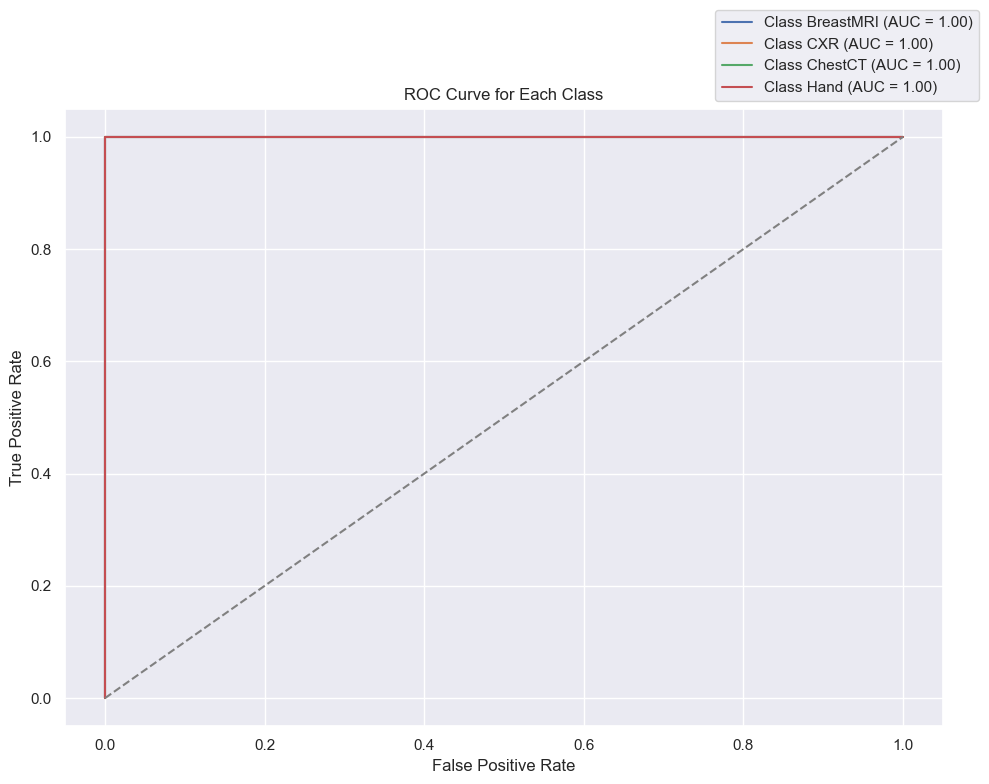

In [25]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import numpy as np

# Ορισμός των υπερπαραμέτρων που θέλουμε να δοκιμάσουμε
param_grid = {
    'C': [0.1, 1, 10, 100],  # Παράγοντας ποινής
    'kernel': ['linear', 'rbf', 'poly'],  # Τύποι πυρήνα
    'gamma': ['scale', 'auto'],  # Παράμετρος για το RBF kernel
    'probability': [True]  # Ενεργοποίηση του predict_proba
}

# Δημιουργία του GridSearchCV με ενεργοποιημένο το probability
grid_search = GridSearchCV(
    SVC(random_state=42),  
    param_grid,
    cv=5,
    scoring='accuracy',
    verbose=1
)

# Εκπαίδευση του GridSearchCV για να βρει τις καλύτερες υπερπαραμέτρους
grid_search.fit(X_train_pca, y_train)  # Εδώ χρησιμοποιούμε τα δεδομένα από PCA

# Εκτύπωση των καλύτερων υπερπαραμέτρων
print("Best parameters found: ", grid_search.best_params_)

# Προβλέψεις με τις βελτιστοποιημένες παραμέτρους
best_svm = grid_search.best_estimator_
y_pred_train_svm = best_svm.predict(X_train_pca)
y_pred_val_svm = best_svm.predict(X_val_pca)
y_pred_test_svm = best_svm.predict(X_test_pca)

# Εκτύπωση των αποτελεσμάτων
print(f"Train Accuracy with optimized SVM: {accuracy_score(y_train, y_pred_train_svm):.4f}")
print(f"Validation Accuracy with optimized SVM: {accuracy_score(y_val, y_pred_val_svm):.4f}")
print(f"Test Accuracy with optimized SVM: {accuracy_score(y_test, y_pred_test_svm):.4f}")

# Εκτύπωση του Classification Report για το Training Set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train_svm))

# Εκτύπωση του Classification Report για το Validation Set
print("Classification Report for Validation Set:")
print(classification_report(y_val, y_pred_val_svm))

# Εκτύπωση του Classification Report για το Test Set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test_svm))


y_pred_test_prob = best_svm.predict_proba(X_test_pca)  # Χρησιμοποιούμε το X_test_pca

# Ανάκτηση των μοναδικών κλάσεων από τον LabelEncoder ή τις πραγματικές κλάσεις
unique_classes = np.unique(y_train)  # Αν δεν έχεις τον LabelEncoder, χρησιμοποίησε np.unique(y_train)

# Binarize the labels (για πολλαπλές κλάσεις)
y_train_bin = label_binarize(y_train, classes=unique_classes)
y_test_bin = label_binarize(y_test, classes=unique_classes)

# Υπολογισμός ROC για το Test Set για κάθε κλάση
fpr = {}
tpr = {}
roc_auc = {}

# Για κάθε κλάση υπολογίζουμε το ROC και το AUC
for i in range(y_train_bin.shape[1]):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_test_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Σχεδίαση της ROC Curve για κάθε κλάση
plt.figure(figsize=(10, 8))

# Σχεδίαση της ROC Curve για κάθε κλάση
for i in range(y_train_bin.shape[1]):
    plt.plot(fpr[i], tpr[i], label=f'Class {unique_classes[i]} (AUC = {roc_auc[i]:.2f})')

# Γραμμή για το τυχαίο μοντέλο (diagonal line)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

# Ρυθμίσεις για το γράφημα
plt.title('ROC Curve for Each Class')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right', bbox_to_anchor=(1.05, 1))  # Σωστή τοποθέτηση του υπομνήματος εκτός του άξονα
plt.tight_layout()  # Προσαρμόζει τα περιθώρια για να χωράει το legend
plt.show()

Παρατηρούμε πως τόσο η validation accuracy (0.9988) όσο και η test accuracy (0.9975) αυξήθηκαν με τη βελτιστοποίηση των υπερπαραμέτρων καθώς επίσης έχουμε ROC AUC 1.0 για όλες τις κατηγορίες.

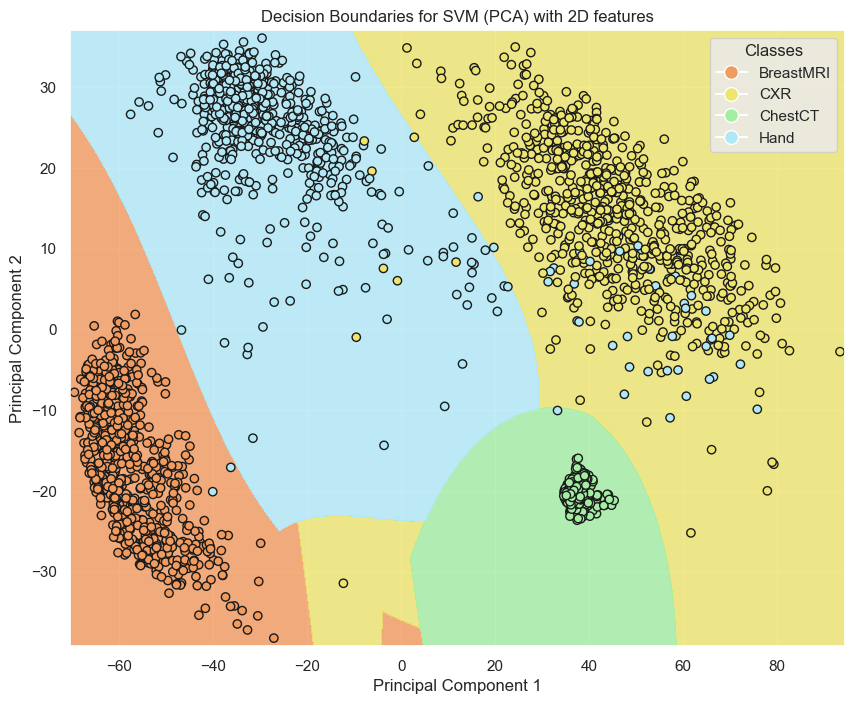

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import ListedColormap


X_train_pca_2d = X_train_pca[:, :2]
X_val_pca_2d = X_val_pca[:, :2]
X_test_pca_2d = X_test_pca[:, :2]

# Ανάκτηση των κατηγοριών από τον LabelEncoder
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)  # Κωδικοποιούμε τις κατηγορίες του training set

# Εκπαίδευση του SVM με τα δεδομένα PCA (2D)
clf_svm = SVC(kernel='rbf', C=10, gamma='scale', probability=True)
clf_svm.fit(X_train_pca_2d, y_train_encoded)

# Δημιουργία πλέγματος για τις προβλέψεις
h = .02  # Βήμα στο grid (μικρότερο για πιο λεπτομερή οπτικοποίηση)
x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Πρόβλεψη για κάθε σημείο του grid
Z = clf_svm.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Δημιουργία προσαρμοσμένου χρωματικού πίνακα
colors = ["#F29B5E", "#EEE56F", "#A3EEA3", "#B2E8F6"]  # Χρώματα για τις κατηγορίες (χρησιμοποιούμε ακριβή χρώματα)
custom_cmap = ListedColormap(colors)

# Οπτικοποίηση των ορίων απόφασης
plt.figure(figsize=(10, 8))

# Χρωματίζουμε τα όρια απόφασης
plt.contourf(xx, yy, Z, alpha=0.8, cmap=custom_cmap)

# Χρωματίζουμε τα σημεία των δεδομένων
scatter = plt.scatter(X_train_pca_2d[:, 0], X_train_pca_2d[:, 1], c=y_train_encoded, cmap=custom_cmap, edgecolors='k', marker='o')

# Ρυθμίσεις για τα labels
plt.title('Decision Boundaries for SVM (PCA) with 2D features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Δημιουργία του legend με τα χειροκίνητα χρώματα
unique_classes = le.classes_  # Ανάκτηση των αρχικών κατηγοριών από τον LabelEncoder
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=custom_cmap(i / len(unique_classes)), markersize=10, label=unique_classes[i]) for i in range(len(unique_classes))]
plt.legend(handles=handles, title="Classes", loc="best")

# Εμφάνιση του γραφήματος
plt.show()

k-Κοντινότεροι Γείτονες (k-NN) χρησιμοποιώντας τα δεδομένα που έχουν υποστεί PCA

Train Accuracy with k-NN (PCA): 0.9964
Validation Accuracy with k-NN (PCA): 0.9950
Test Accuracy with k-NN (PCA): 0.9924
Classification Report for Training Set:
              precision    recall  f1-score   support

   BreastMRI       0.99      1.00      1.00       700
         CXR       1.00      0.99      1.00       700
     ChestCT       1.00      1.00      1.00       700
        Hand       1.00      0.99      0.99       700

    accuracy                           1.00      2800
   macro avg       1.00      1.00      1.00      2800
weighted avg       1.00      1.00      1.00      2800

Classification Report for Validation Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       201
         CXR       0.99      1.00      0.99       201
     ChestCT       1.00      1.00      1.00       201
        Hand       0.99      0.99      0.99       201

    accuracy                           1.00       804
   macro avg       1.00      1.00   

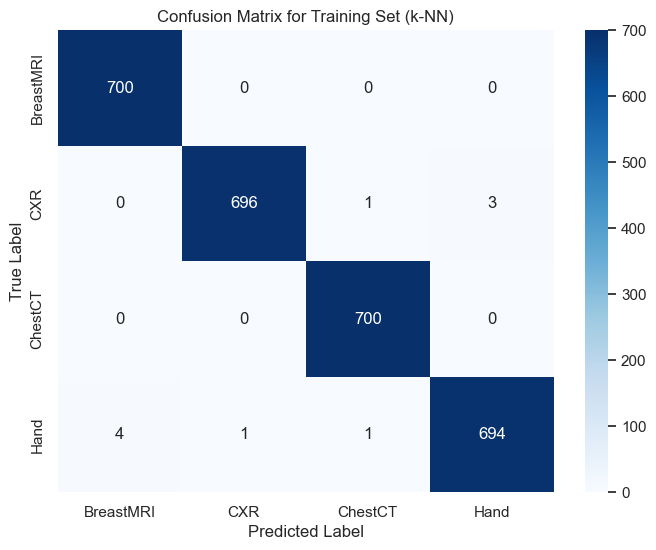

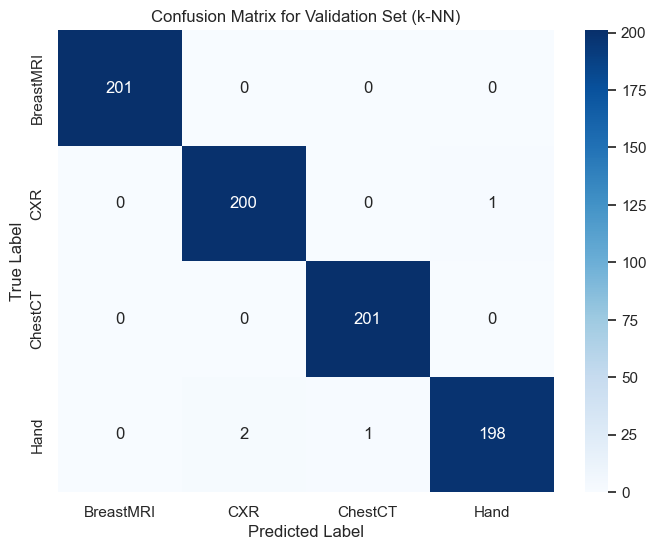

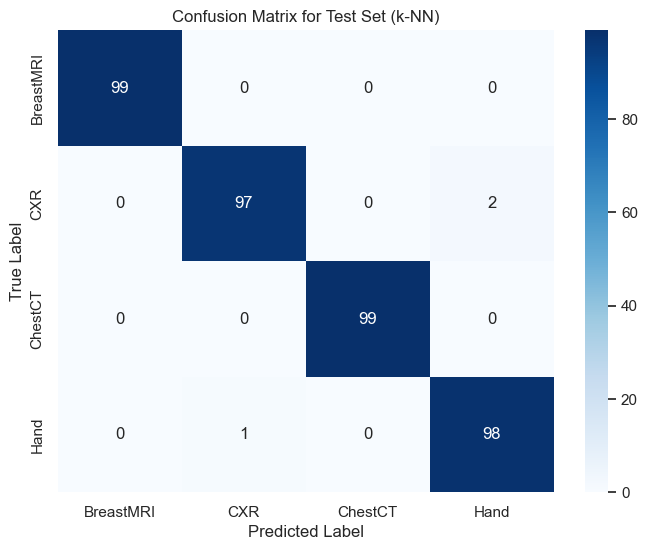

In [27]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Εκπαίδευση του k-NN με τα δεδομένα που προκύπτουν από το PCA
clf_knn = KNeighborsClassifier(n_neighbors=5)  # Εδώ επιλέγουμε τον αριθμό των γειτόνων (k=5)
clf_knn.fit(X_train_pca, y_train)  # Χρησιμοποιούμε τα δεδομένα από το PCA

# Προβλέψεις για το Training Set
y_pred_train_knn = clf_knn.predict(X_train_pca)  # Προβλέψεις για το Training Set
train_accuracy_knn = accuracy_score(y_train, y_pred_train_knn)

# Προβλέψεις για το Validation Set
y_pred_val_knn = clf_knn.predict(X_val_pca)  # Προβλέψεις για το Validation Set
val_accuracy_knn = accuracy_score(y_val, y_pred_val_knn)

# Προβλέψεις για το Test Set
y_pred_test_knn = clf_knn.predict(X_test_pca)  # Προβλέψεις για το Test Set
test_accuracy_knn = accuracy_score(y_test, y_pred_test_knn)

# Εκτύπωση των αποτελεσμάτων ακρίβειας
print(f"Train Accuracy with k-NN (PCA): {train_accuracy_knn:.4f}")
print(f"Validation Accuracy with k-NN (PCA): {val_accuracy_knn:.4f}")
print(f"Test Accuracy with k-NN (PCA): {test_accuracy_knn:.4f}")

# Εκτύπωση του Classification Report για το Training Set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train_knn))

# Εκτύπωση του Classification Report για το Validation Set
print("Classification Report for Validation Set:")
print(classification_report(y_val, y_pred_val_knn))

# Εκτύπωση του Classification Report για το Test Set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test_knn))

# Εκτύπωση του Confusion Matrix για το Training Set
print("Confusion Matrix for Training Set:")
cm_train_knn = confusion_matrix(y_train, y_pred_train_knn)
print(cm_train_knn)

# Εκτύπωση του Confusion Matrix για το Validation Set
print("Confusion Matrix for Validation Set:")
cm_val_knn = confusion_matrix(y_val, y_pred_val_knn)
print(cm_val_knn)

# Εκτύπωση του Confusion Matrix για το Test Set
print("Confusion Matrix for Test Set:")
cm_test_knn = confusion_matrix(y_test, y_pred_test_knn)
print(cm_test_knn)

# Οπτικοποίηση του Confusion Matrix για το Training Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train_knn, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.title("Confusion Matrix for Training Set (k-NN)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Validation Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_val_knn, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_val), yticklabels=np.unique(y_val))
plt.title("Confusion Matrix for Validation Set (k-NN)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Test Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test_knn, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title("Confusion Matrix for Test Set (k-NN)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Στο σύνολο εκπαίδευσης η ακρίβεια φτάνει το 0.9964, ενώ στα σύνολα επικύρωσης και δοκιμής η ακρίβεια είναι 0.9950 και 0.9924, αντίστοιχα. Ο αλγόριθμος αποδίδει υψηλές τιμές στον δείκτη precision, recall και f1-score για όλες τις κατηγορίες, επιβεβαιώνοντας την καλή απόδοση του αλγορίθμου και την ικανότητά του να ταξινομήσει σωστά τις εικόνες. Η ανάλυση του confusion matrix για το training, validation και test set δείχνει ότι η πλειονότητα των προβλέψεων είναι σωστές, με ελάχιστα λάθη για την κατηγορία CXR και κάποια ελαφριά σφάλματα στην κατηγορία Hand.

Fitting 5 folds for each of 960 candidates, totalling 4800 fits
Best parameters found:  {'algorithm': 'auto', 'leaf_size': 20, 'metric': 'euclidean', 'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
Train Accuracy with optimized K-NN: 0.9975
Validation Accuracy with optimized K-NN: 0.9975
Test Accuracy with optimized K-NN: 0.9975
Classification Report for Training Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       700
           1       1.00      0.99      1.00       700
           2       1.00      1.00      1.00       700
           3       1.00      1.00      1.00       700

    accuracy                           1.00      2800
   macro avg       1.00      1.00      1.00      2800
weighted avg       1.00      1.00      1.00      2800

Classification Report for Validation Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       201
           1       1.00      1.00      1.00

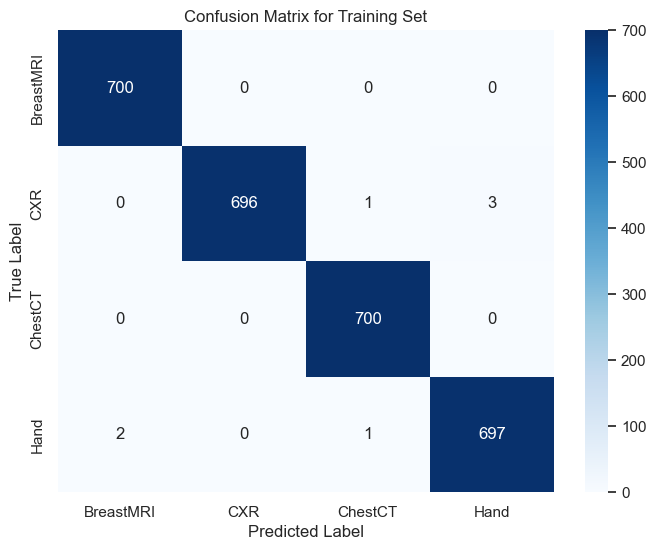

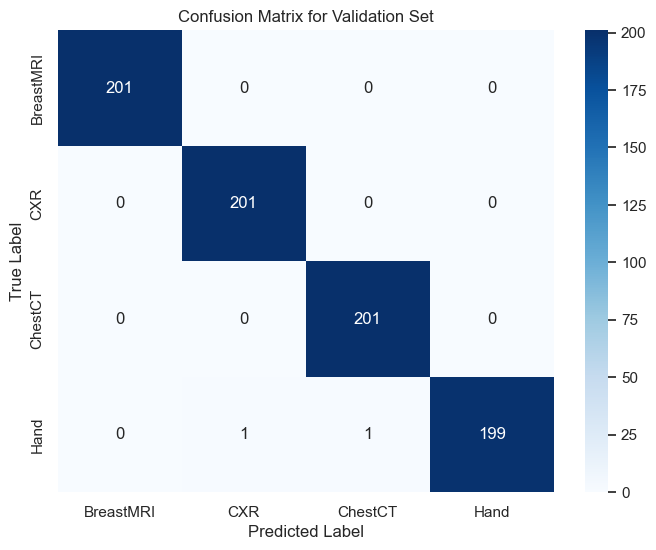

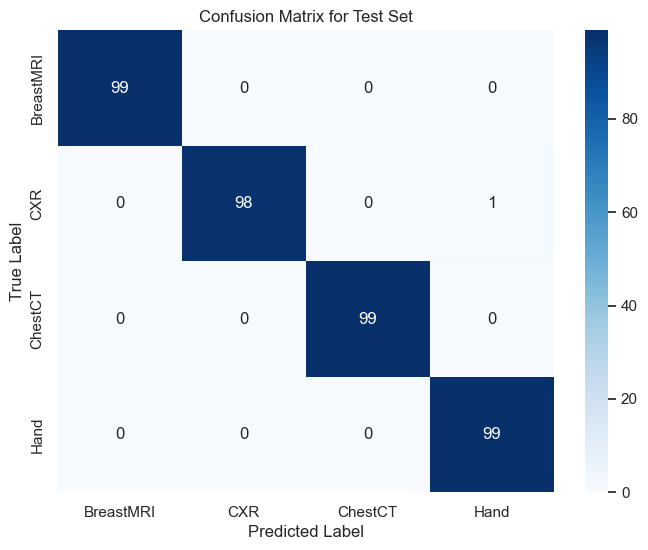

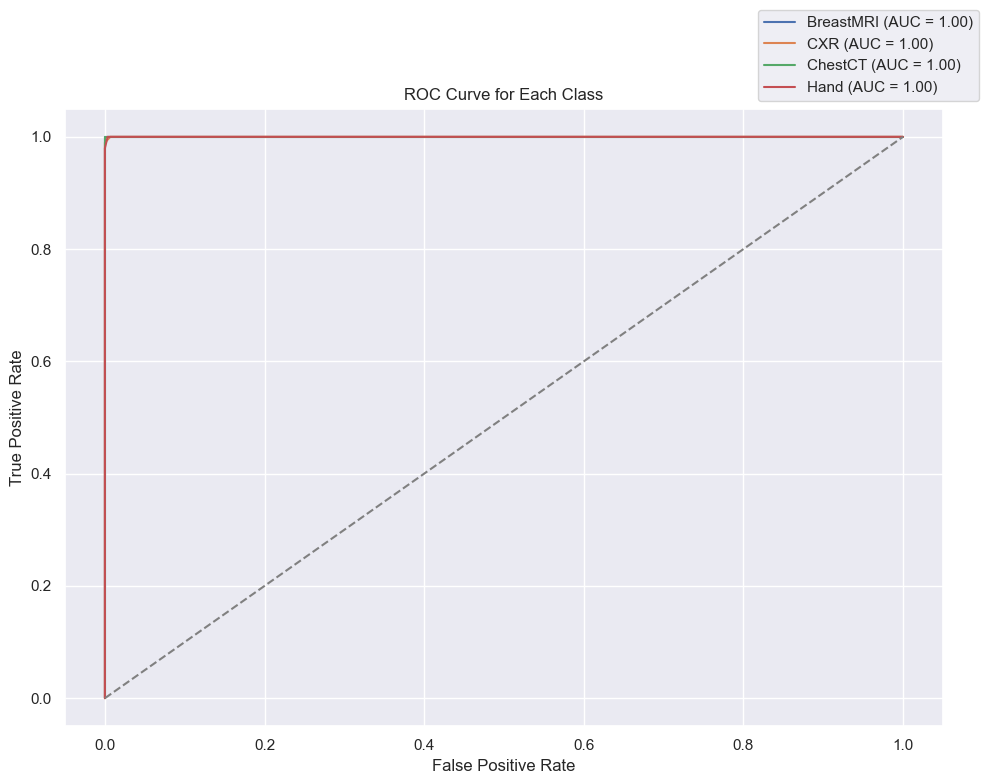

In [28]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Κωδικοποίηση των κατηγοριών με LabelEncoder
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)  # Κωδικοποίηση των κατηγοριών του training set
y_val_encoded = le.transform(y_val)  # Κωδικοποίηση των κατηγοριών του validation set
y_test_encoded = le.transform(y_test)  # Κωδικοποίηση των κατηγοριών του test set

# Ορισμός των υπερπαραμέτρων για το GridSearch
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],  # Αριθμός γειτόνων
    'weights': ['uniform', 'distance'],  # Βάρη (ισοδύναμα ή βάρη με βάση την απόσταση)
    'metric': ['euclidean', 'manhattan', 'minkowski'],  # Μέτρο απόστασης
    'p': [1, 2],  # Επιλογές για το Minkowski (1 = Manhattan, 2 = Euclidean)
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Αλγόριθμοι
    'leaf_size': [20, 30, 40, 50]  # Μέγεθος φύλλου (για ball_tree και kd_tree)
}

# Δημιουργία του GridSearchCV
grid_search_knn = GridSearchCV(
    KNeighborsClassifier(),  # Αλγόριθμος K-NN
    param_grid,
    cv=5,
    scoring='accuracy',
    verbose=1
)

# Εκπαίδευση του GridSearchCV
grid_search_knn.fit(X_train_pca, y_train_encoded)  # Χρησιμοποιούμε τα PCA δεδομένα και τις κωδικοποιημένες ετικέτες

# Εκτύπωση των καλύτερων παραμέτρων
print("Best parameters found: ", grid_search_knn.best_params_)

# Προβλέψεις με τις βελτιστοποιημένες παραμέτρους
best_knn = grid_search_knn.best_estimator_
y_pred_train_knn = best_knn.predict(X_train_pca)
y_pred_val_knn = best_knn.predict(X_val_pca)
y_pred_test_knn = best_knn.predict(X_test_pca)

# Εκτύπωση των αποτελεσμάτων
print(f"Train Accuracy with optimized K-NN: {accuracy_score(y_train_encoded, y_pred_train_knn):.4f}")
print(f"Validation Accuracy with optimized K-NN: {accuracy_score(y_val_encoded, y_pred_val_knn):.4f}")
print(f"Test Accuracy with optimized K-NN: {accuracy_score(y_test_encoded, y_pred_test_knn):.4f}")

# Εκτύπωση του Classification Report για το Training Set
print("Classification Report for Training Set:")
print(classification_report(y_train_encoded, y_pred_train_knn))

# Εκτύπωση του Classification Report για το Validation Set
print("Classification Report for Validation Set:")
print(classification_report(y_val_encoded, y_pred_val_knn))

# Εκτύπωση του Classification Report για το Test Set
print("Classification Report for Test Set:")
print(classification_report(y_test_encoded, y_pred_test_knn))

# Οπτικοποίηση του Confusion Matrix για το Training Set
cm_train_knn = confusion_matrix(y_train_encoded, y_pred_train_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train_knn, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Confusion Matrix for Training Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Validation Set
cm_val_knn = confusion_matrix(y_val_encoded, y_pred_val_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_val_knn, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Confusion Matrix for Validation Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Test Set
cm_test_knn = confusion_matrix(y_test_encoded, y_pred_test_knn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test_knn, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.title("Confusion Matrix for Test Set")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Ανάκτηση των μοναδικών κλάσεων από τον LabelEncoder
unique_classes = le.classes_

# Binarize the labels (για πολλαπλές κλάσεις)
y_train_bin = label_binarize(y_train, classes=unique_classes)
y_test_bin = label_binarize(y_test, classes=unique_classes)

# Πρόβλεψη των πιθανοτήτων για το Test Set
y_pred_test_prob = best_knn.predict_proba(X_test_pca)  # Χρησιμοποιούμε την predict_proba() για να πάρουμε τις πιθανότητες

# Υπολογισμός ROC για το Test Set για κάθε κλάση
fpr = {}
tpr = {}
roc_auc = {}

# Για κάθε κλάση υπολογίζουμε το ROC και το AUC
for i in range(y_train_bin.shape[1]):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_test_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Σχεδίαση των ROC Curves
plt.figure(figsize=(10, 8))

# Σχεδίαση της ROC Curve για κάθε κλάση
for i in range(y_train_bin.shape[1]):
    plt.plot(fpr[i], tpr[i], label=f'{unique_classes[i]} (AUC = {roc_auc[i]:.2f})')

# Γραμμή για το τυχαίο μοντέλο (diagonal line)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

# Ρυθμίσεις για το γράφημα
plt.title('ROC Curve for Each Class')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right', bbox_to_anchor=(1.05, 1))  # Σωστή τοποθέτηση του υπομνήματος εκτός του άξονα
plt.tight_layout()  # Προσαρμόζει τα περιθώρια για να χωράει το legend
plt.show()

Με τη βελτιστοποίηση των υπερπαραμέτρων παρατηρούμε αύξηση της ακρίβειας και στα τρία sets (train: 0.9975, validation: 0.9975,test: 0.9975) και ROC AUC 1.0 

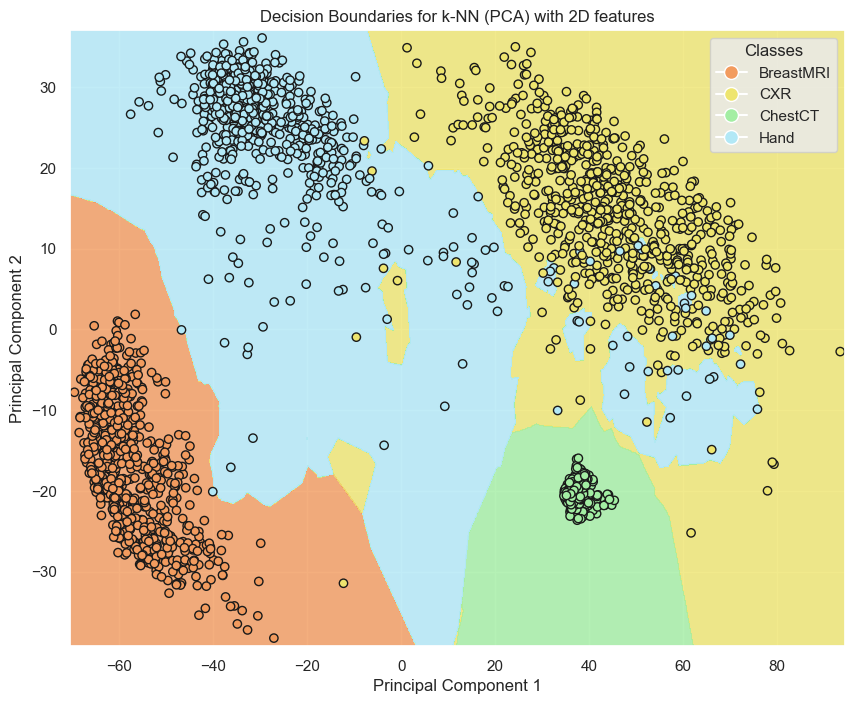

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder


X_train_pca_2d = X_train_pca[:, :2]  # Χρησιμοποιούμε τις πρώτες 2 διαστάσεις για την οπτικοποίηση
X_val_pca_2d = X_val_pca[:, :2]
X_test_pca_2d = X_test_pca[:, :2]

# Ανάκτηση των κατηγοριών από τον LabelEncoder
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)  # Κωδικοποιούμε τις κατηγορίες του training set

# Εκπαίδευση του k-NN με τα δεδομένα PCA (2D)
best_k = grid_search_knn.best_params_['n_neighbors']  # Ο καλύτερος αριθμός γειτόνων από το GridSearch
clf_knn = KNeighborsClassifier(n_neighbors=best_k)
clf_knn.fit(X_train_pca_2d, y_train_encoded)

# Δημιουργία πλέγματος για τις προβλέψεις (αυξάνουμε το βήμα για να μειώσουμε τη χρονική διάρκεια)
h = 0.1  # Αυξήσαμε το βήμα στο grid για να το κάνουμε πιο γρήγορο
x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Πρόβλεψη για κάθε σημείο του grid
Z = clf_knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Δημιουργία προσαρμοσμένου χρωματικού πίνακα
colors = ["#F29B5E", "#EEE56F", "#A3EEA3", "#B2E8F6"]  # Χρώματα για τις κατηγορίες
custom_cmap = ListedColormap(colors)

# Οπτικοποίηση των ορίων απόφασης
plt.figure(figsize=(10, 8))

# Χρωματίζουμε τα όρια απόφασης
plt.contourf(xx, yy, Z, alpha=0.8, cmap=custom_cmap)

# Χρωματίζουμε τα σημεία των δεδομένων
scatter = plt.scatter(X_train_pca_2d[:, 0], X_train_pca_2d[:, 1], c=y_train_encoded, cmap=custom_cmap, edgecolors='k', marker='o')

# Ρυθμίσεις για τα labels
plt.title('Decision Boundaries for k-NN (PCA) with 2D features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Δημιουργία του legend με τα χειροκίνητα χρώματα
unique_classes = le.classes_  # Ανάκτηση των αρχικών κατηγοριών από τον LabelEncoder
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=custom_cmap(i / len(unique_classes)), markersize=10, label=unique_classes[i]) for i in range(len(unique_classes))]
plt.legend(handles=handles, title="Classes", loc="best")

# Εμφάνιση του γραφήματος
plt.show()

Naive Bayes με τα δεδομένα που έχουν υποστεί PCA

Train Accuracy with Naive Bayes (PCA): 0.9821
Validation Accuracy with Naive Bayes (PCA): 0.9851
Test Accuracy with Naive Bayes (PCA): 0.9823
Classification Report for Training Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       700
         CXR       0.94      1.00      0.97       700
     ChestCT       1.00      0.99      1.00       700
        Hand       0.99      0.94      0.97       700

    accuracy                           0.98      2800
   macro avg       0.98      0.98      0.98      2800
weighted avg       0.98      0.98      0.98      2800

Classification Report for Validation Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       201
         CXR       0.95      0.99      0.97       201
     ChestCT       1.00      1.00      1.00       201
        Hand       0.99      0.96      0.97       201

    accuracy                           0.99       804
   macro avg   

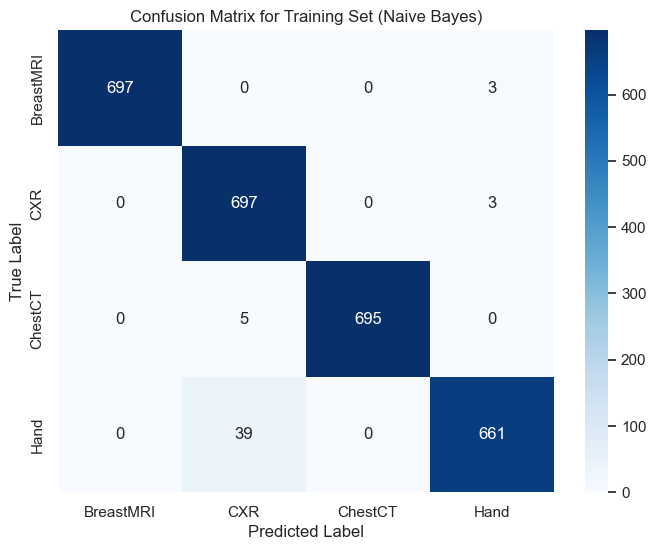

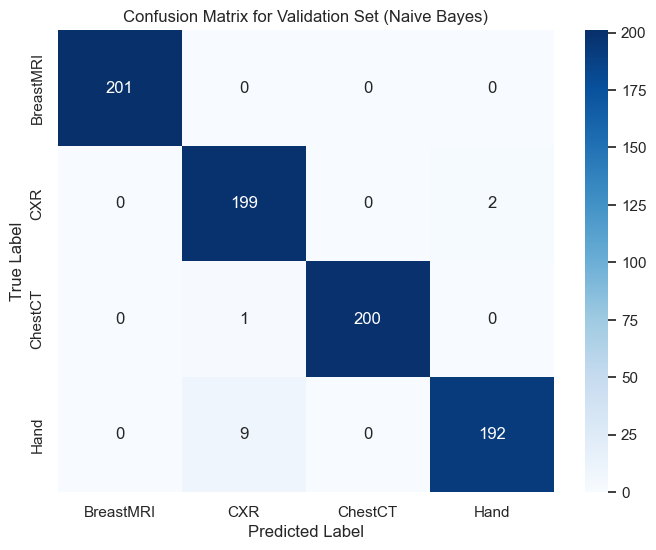

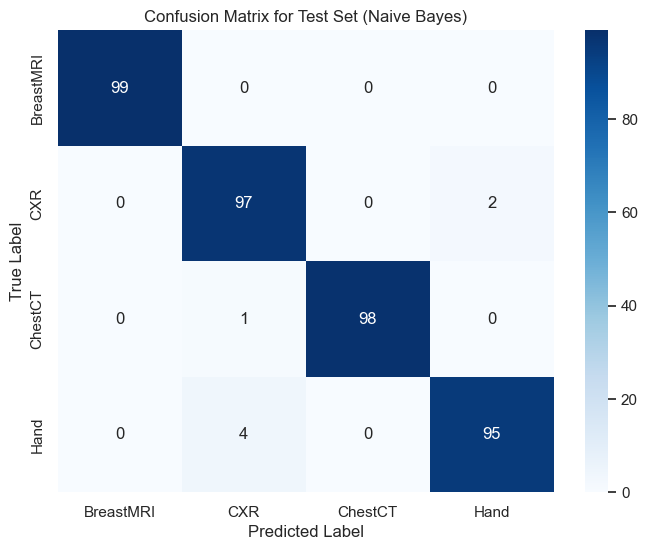

In [30]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Εκπαίδευση του Naive Bayes με τα δεδομένα που προκύπτουν από το PCA
clf_nb = GaussianNB()
clf_nb.fit(X_train_pca, y_train)  # Χρησιμοποιούμε τα δεδομένα από το PCA

# Προβλέψεις για το Training Set
y_pred_train_nb = clf_nb.predict(X_train_pca)
train_accuracy_nb = accuracy_score(y_train, y_pred_train_nb)

# Προβλέψεις για το Validation Set
y_pred_val_nb = clf_nb.predict(X_val_pca)
val_accuracy_nb = accuracy_score(y_val, y_pred_val_nb)

# Προβλέψεις για το Test Set
y_pred_test_nb = clf_nb.predict(X_test_pca)
test_accuracy_nb = accuracy_score(y_test, y_pred_test_nb)

# Εκτύπωση των αποτελεσμάτων ακρίβειας
print(f"Train Accuracy with Naive Bayes (PCA): {train_accuracy_nb:.4f}")
print(f"Validation Accuracy with Naive Bayes (PCA): {val_accuracy_nb:.4f}")
print(f"Test Accuracy with Naive Bayes (PCA): {test_accuracy_nb:.4f}")

# Εκτύπωση του Classification Report για το Training Set
print("Classification Report for Training Set:")
print(classification_report(y_train, y_pred_train_nb))

# Εκτύπωση του Classification Report για το Validation Set
print("Classification Report for Validation Set:")
print(classification_report(y_val, y_pred_val_nb))

# Εκτύπωση του Classification Report για το Test Set
print("Classification Report for Test Set:")
print(classification_report(y_test, y_pred_test_nb))

# Εκτύπωση του Confusion Matrix για το Training Set
print("Confusion Matrix for Training Set:")
cm_train_nb = confusion_matrix(y_train, y_pred_train_nb)
print(cm_train_nb)

# Εκτύπωση του Confusion Matrix για το Validation Set
print("Confusion Matrix for Validation Set:")
cm_val_nb = confusion_matrix(y_val, y_pred_val_nb)
print(cm_val_nb)

# Εκτύπωση του Confusion Matrix για το Test Set
print("Confusion Matrix for Test Set:")
cm_test_nb = confusion_matrix(y_test, y_pred_test_nb)
print(cm_test_nb)

# Οπτικοποίηση του Confusion Matrix για το Training Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train_nb, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_train), yticklabels=np.unique(y_train))
plt.title("Confusion Matrix for Training Set (Naive Bayes)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Validation Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_val_nb, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_val), yticklabels=np.unique(y_val))
plt.title("Confusion Matrix for Validation Set (Naive Bayes)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Οπτικοποίηση του Confusion Matrix για το Test Set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test_nb, annot=True, fmt="d", cmap="Blues", xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title("Confusion Matrix for Test Set (Naive Bayes)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

Τα αποτελέσματα δείχνουν ότι ο αλγόριθμος Naive Bayes απέδωσε αρκετά καλά με την ακρίβεια να είναι γύρω από το 0.9823 για το test set. Η οπτικοποίηση των confusion matrices επιβεβαιώνει ότι το μοντέλο έκανε ελάχιστα λάθη στην ταξινόμηση, και ιδιαίτερα για τις κατηγορίες BreastMRI και ChestCT, η απόδοση ήταν σχεδόν τέλεια.

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters found for Naive Bayes:  {'var_smoothing': np.float64(0.0015199110829529332)}
Train Accuracy with optimized Naive Bayes: 0.9836
Validation Accuracy with optimized Naive Bayes: 0.9851
Test Accuracy with optimized Naive Bayes: 0.9823
Classification Report for Training Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       700
           1       0.94      0.99      0.97       700
           2       1.00      1.00      1.00       700
           3       0.99      0.94      0.97       700

    accuracy                           0.98      2800
   macro avg       0.98      0.98      0.98      2800
weighted avg       0.98      0.98      0.98      2800

Classification Report for Validation Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       201
           1       0.95      0.99      0.97       201
          

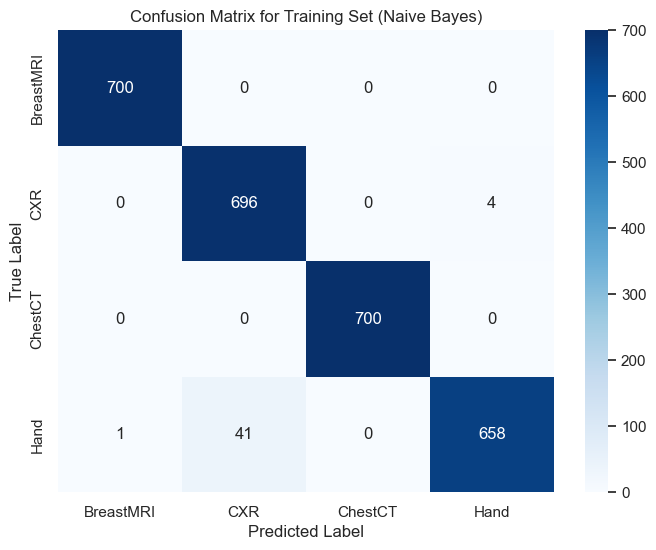

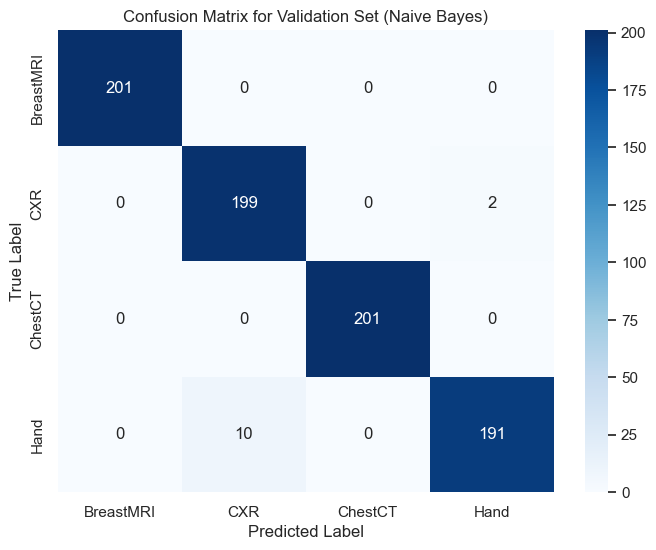

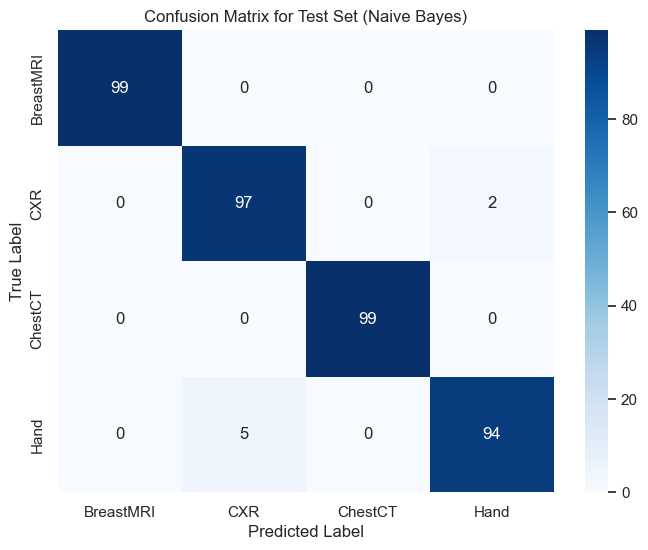

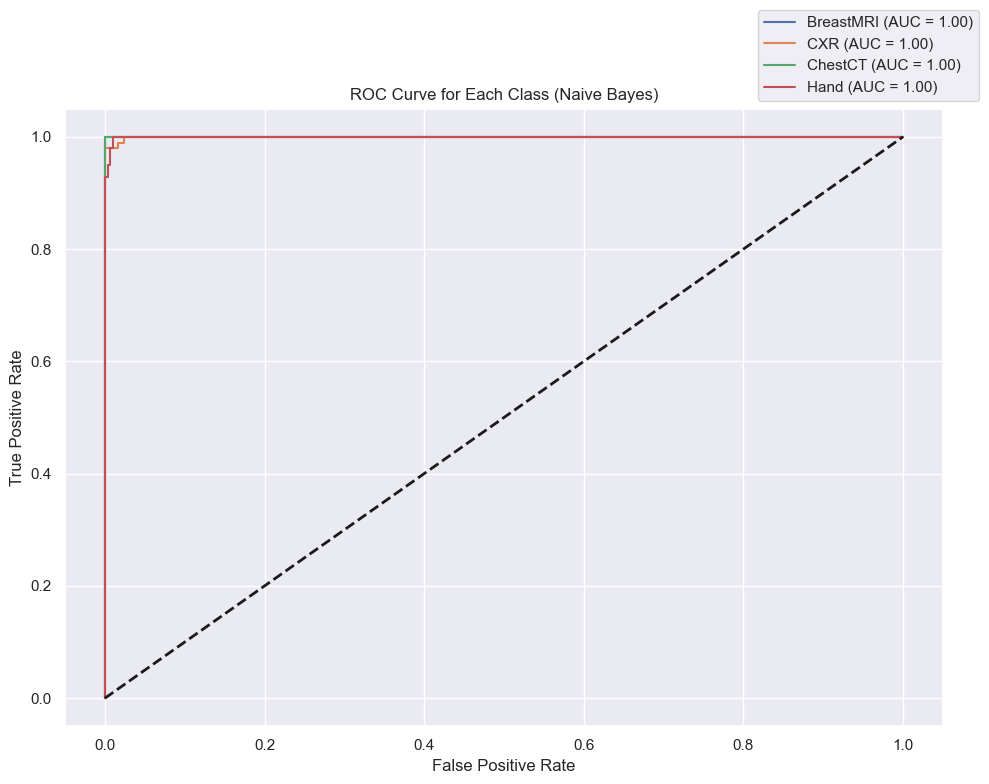

In [31]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import LabelEncoder, label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Κωδικοποίηση των ετικετών 
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_val_encoded = le.transform(y_val)
y_test_encoded = le.transform(y_test)

# Ορισμός του μοντέλου Naive Bayes
nb = GaussianNB()

# Ορισμός των παραμέτρων για grid search
param_grid = {
    'var_smoothing': np.logspace(0,-9, num=100)  # Π.χ. 100 τιμές από 1 έως 1e-9
}

# Δημιουργία GridSearchCV
grid_search_nb = GridSearchCV(
    nb,
    param_grid,
    cv=5,
    scoring='accuracy',
    verbose=1
)

# Εκπαίδευση του GridSearchCV με τα PCA δεδομένα
grid_search_nb.fit(X_train_pca, y_train_encoded)

# Βέλτιστες παράμετροι
print("Best parameters found for Naive Bayes: ", grid_search_nb.best_params_)

# Βέλτιστο μοντέλο
best_nb = grid_search_nb.best_estimator_

# Προβλέψεις
y_pred_train_nb = best_nb.predict(X_train_pca)
y_pred_val_nb = best_nb.predict(X_val_pca)
y_pred_test_nb = best_nb.predict(X_test_pca)

# Ακρίβειες
print(f"Train Accuracy with optimized Naive Bayes: {accuracy_score(y_train_encoded, y_pred_train_nb):.4f}")
print(f"Validation Accuracy with optimized Naive Bayes: {accuracy_score(y_val_encoded, y_pred_val_nb):.4f}")
print(f"Test Accuracy with optimized Naive Bayes: {accuracy_score(y_test_encoded, y_pred_test_nb):.4f}")

# Classification reports
print("Classification Report for Training Set:")
print(classification_report(y_train_encoded, y_pred_train_nb))

print("Classification Report for Validation Set:")
print(classification_report(y_val_encoded, y_pred_val_nb))

print("Classification Report for Test Set:")
print(classification_report(y_test_encoded, y_pred_test_nb))

# Confusion matrices και οπτικοποιήσεις
def plot_cm(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(title)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

plot_cm(y_train_encoded, y_pred_train_nb, "Confusion Matrix for Training Set (Naive Bayes)")
plot_cm(y_val_encoded, y_pred_val_nb, "Confusion Matrix for Validation Set (Naive Bayes)")
plot_cm(y_test_encoded, y_pred_test_nb, "Confusion Matrix for Test Set (Naive Bayes)")

# Ανάκτηση των μοναδικών κλάσεων
unique_classes = le.classes_

# Binarize labels για ROC curves (multi-class)
y_train_bin = label_binarize(y_train_encoded, classes=np.arange(len(unique_classes)))
y_test_bin = label_binarize(y_test_encoded, classes=np.arange(len(unique_classes)))

# Πρόβλεψη πιθανοτήτων για Test set
y_pred_test_prob = best_nb.predict_proba(X_test_pca)

# Υπολογισμός ROC και AUC για κάθε κλάση
fpr = {}
tpr = {}
roc_auc = {}

for i in range(len(unique_classes)):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_test_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Σχεδίαση ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(unique_classes)):
    plt.plot(fpr[i], tpr[i], label=f'{unique_classes[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.title('ROC Curve for Each Class (Naive Bayes)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

Με τη βελτιστοποίηση των υπερπαραμέτρων παρατηρούμε ότι η train accuracy αυξήθηκε σε 0.9836, ενώ η validation και test accuracy παρέμειναν ίδιες με πριν

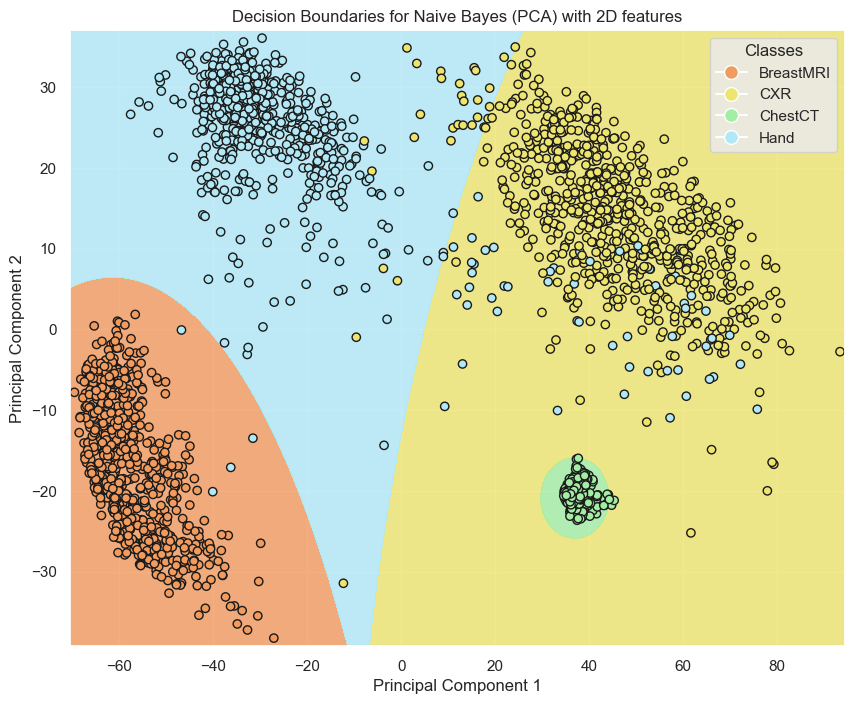

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import ListedColormap

# Χρησιμοποιούμε τα πρώτα δύο χαρακτηριστικά του PCA για την εκπαίδευση του Naive Bayes
X_train_pca_2d = X_train_pca[:, :2]
X_val_pca_2d = X_val_pca[:, :2]
X_test_pca_2d = X_test_pca[:, :2]

# Κωδικοποίηση των ετικετών για την εκπαίδευση
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)

# Εκπαίδευση του Naive Bayes με τα πρώτα δύο χαρακτηριστικά
best_nb = GaussianNB()  # Δημιουργία μοντέλου Naive Bayes
best_nb.fit(X_train_pca_2d, y_train_encoded)

# Δημιουργία πλέγματος για τις προβλέψεις
h = .02  # Βήμα στο grid (μικρότερο για πιο λεπτομερή οπτικοποίηση)
x_min, x_max = X_train_pca_2d[:, 0].min() - 1, X_train_pca_2d[:, 0].max() + 1
y_min, y_max = X_train_pca_2d[:, 1].min() - 1, X_train_pca_2d[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Πρόβλεψη για κάθε σημείο του grid
Z = best_nb.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Δημιουργία προσαρμοσμένου χρωματικού πίνακα
colors = ["#F29B5E", "#EEE56F", "#A3EEA3", "#B2E8F6"]  # Χρώματα για τις κατηγορίες
custom_cmap = ListedColormap(colors)

# Οπτικοποίηση των ορίων απόφασης
plt.figure(figsize=(10, 8))

# Χρωματίζουμε τα όρια απόφασης
plt.contourf(xx, yy, Z, alpha=0.8, cmap=custom_cmap)

# Χρωματίζουμε τα σημεία των δεδομένων
scatter = plt.scatter(X_train_pca_2d[:, 0], X_train_pca_2d[:, 1], c=y_train_encoded, cmap=custom_cmap, edgecolors='k', marker='o')

# Ρυθμίσεις για τα labels
plt.title('Decision Boundaries for Naive Bayes (PCA) with 2D features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Δημιουργία του legend με τα χειροκίνητα χρώματα
unique_classes = le.classes_  # Ανάκτηση των αρχικών κατηγοριών από τον LabelEncoder
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=custom_cmap(i / len(unique_classes)), markersize=10, label=unique_classes[i]) for i in range(len(unique_classes))]
plt.legend(handles=handles, title="Classes", loc="best")

# Εμφάνιση του γραφήματος
plt.show()

Βαθιά Νευρωνικά Δίκτυα

Απλό πολυεπίπεδο νευρωνικό δίκτυο (MLP) με τα δεδομένα που έχουν υποστεί PCA

Using device: cuda
Epoch [10/20], Loss: 0.2243, Train Accuracy: 95.50%, Validation Accuracy: 97.64%, Test Accuracy: 97.98%
Epoch [20/20], Loss: 0.0716, Train Accuracy: 97.89%, Validation Accuracy: 99.13%, Test Accuracy: 99.49%


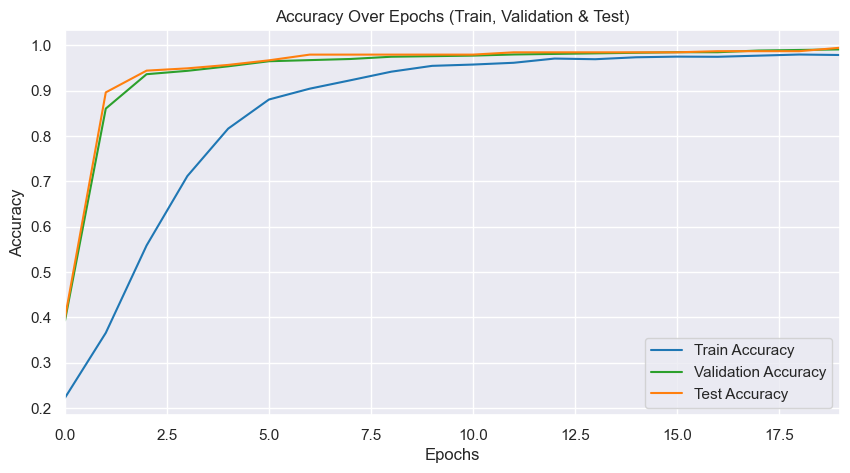

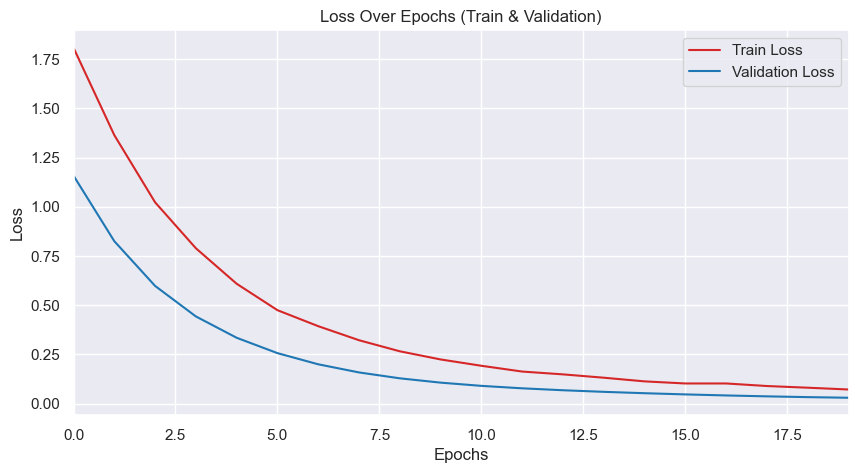

In [33]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Κωδικοποίηση των ετικετών σε αριθμητική μορφή
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Δημιουργία του μοντέλου MLP με κανονικοποίηση (Dropout και L2 regularization)
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, dropout_rate):
        super(MLP, self).__init__()
        self.hidden1 = nn.Linear(input_size, hidden_size)
        self.hidden2 = nn.Linear(hidden_size, hidden_size)
        self.output = nn.Linear(hidden_size, output_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(dropout_rate)

    def forward(self, x):
        x = self.relu(self.hidden1(x))
        x = self.dropout(x)
        x = self.relu(self.hidden2(x))
        x = self.dropout(x)
        x = self.output(x)
        return x

# Ορισμός παραμέτρων μοντέλου
input_size = X_train_pca.shape[1]  # Από το PCA
hidden_size = 128
output_size = len(set(y_train_encoded))

# Δημιουργία του μοντέλου
dropout_rate = 0.3  # Ορισμός του dropout
model = MLP(input_size, hidden_size, output_size, dropout_rate)

# Ορισμός του device (GPU ή CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')
model.to(device)

# Μεταφορά των δεδομένων στην GPU
X_train_tensor = torch.tensor(X_train_pca, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train_encoded, dtype=torch.long).to(device)
X_val_tensor = torch.tensor(X_val_pca, dtype=torch.float32).to(device)
y_val_tensor = torch.tensor(y_val_encoded, dtype=torch.long).to(device)
X_test_tensor = torch.tensor(X_test_pca, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test_encoded, dtype=torch.long).to(device)

# Ορισμός της συνάρτησης κόστους και του optimizer
criterion = nn.CrossEntropyLoss()  # Χρήση του CrossEntropyLoss για πολυκατηγορηματική ταξινόμηση
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=0.01)  # Adam optimizer με L2 regularization (weight_decay)

# Εκπαίδευση του μοντέλου
num_epochs = 20
train_losses = []  # Απώλεια εκπαίδευσης
val_losses = []  # Απώλεια validation
train_accuracies = []  # Ακρίβεια εκπαίδευσης
val_accuracies = []  # Ακρίβεια validation
test_accuracies = []  # Ακρίβεια test

for epoch in range(num_epochs):
    model.train()
    
    # Forward pass για τα δεδομένα εκπαίδευσης
    outputs = model(X_train_tensor)
    _, predicted = torch.max(outputs, 1)
    train_accuracy = accuracy_score(y_train_tensor.cpu(), predicted.cpu())
    train_accuracies.append(train_accuracy)

    # Υπολογισμός απώλειας
    loss = criterion(outputs, y_train_tensor)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    # Αποθήκευση της τιμής της απώλειας
    train_losses.append(loss.item())

    # Υπολογισμός και αποθήκευση της ακρίβειας για το validation set
    model.eval()
    with torch.no_grad():
        val_outputs = model(X_val_tensor)
        val_loss = criterion(val_outputs, y_val_tensor)
        val_losses.append(val_loss.item())  # Αποθήκευση της απώλειας του validation set
        
        _, val_predicted = torch.max(val_outputs, 1)
        val_accuracy = accuracy_score(y_val_tensor.cpu(), val_predicted.cpu())
        val_accuracies.append(val_accuracy)

        # Υπολογισμός και αποθήκευση της ακρίβειας για το test set
        test_outputs = model(X_test_tensor)
        _, test_predicted = torch.max(test_outputs, 1)
        test_accuracy = accuracy_score(y_test_tensor.cpu(), test_predicted.cpu())
        test_accuracies.append(test_accuracy)

    # Εκτύπωση της απώλειας και ακρίβειας κάθε 10 εποχές
    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, '
              f'Train Accuracy: {train_accuracy * 100:.2f}%, '
              f'Validation Accuracy: {val_accuracy * 100:.2f}%, '
              f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Γράφημα με τις Ακρίβειες
plt.figure(figsize=(10, 5))

# Καμπύλες για την ακρίβεια
plt.plot(range(num_epochs), train_accuracies, color='tab:blue', label='Train Accuracy')
plt.plot(range(num_epochs), val_accuracies, color='tab:green', label='Validation Accuracy')
plt.plot(range(num_epochs), test_accuracies, color='tab:orange', label='Test Accuracy')

# Ρυθμίσεις
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs (Train, Validation & Test)')
plt.legend(loc='lower right')
plt.grid(True)

# Ρύθμιση του άξονα x για να ξεκινάει από 0 και να τελειώνει στο num_epochs - 1
plt.xlim(0, num_epochs - 1)  # Εξασφαλίζουμε ότι το γράφημα τελειώνει στην τελευταία εποχή (20)

plt.show()

# Γράφημα με τις Απώλειες
plt.figure(figsize=(10, 5))

# Καμπύλες για την απώλεια
plt.plot(range(num_epochs), train_losses, color='tab:red', label='Train Loss')
plt.plot(range(num_epochs), val_losses, color='tab:blue', label='Validation Loss')

# Ρυθμίσεις
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Over Epochs (Train & Validation)')
plt.legend(loc='upper right')
plt.grid(True)

# Ρύθμιση του άξονα x για να ξεκινάει από 0 και να τελειώνει στο num_epochs - 1
plt.xlim(0, num_epochs - 1)  # Εξασφαλίζουμε ότι το γράφημα τελειώνει στην τελευταία εποχή (20)
plt.show()


Για την αρχιτεκτονική του MLP (πολυεπίπεδο νευρωνικό δίκτυο), έχουμε επιλέξει δύο κρυφά επίπεδα, καθένα από τα οποία έχει 128 νευρώνες. Η συγκεκριμένη επιλογή βασίζεται στην ιδέα ότι για πιο περίπλοκες κατανομές δεδομένων, τα πιο βαθιά δίκτυα (με περισσότερα επίπεδα και νευρώνες) μπορούν να μάθουν πιο σύνθετες σχέσεις. Το dropout χρησιμοποιείται για την αποφυγή της υπερπροσαρμογής (overfitting), επιτρέποντας στο μοντέλο να γενικεύει καλύτερα σε άγνωστα δεδομένα. Επιλέγουμε τη συνάρτηση ενεργοποίησης ReLU λόγω των καλών επιδόσεων σε πολλά προβλήματα και της απλότητάς της. Το L2 regularization (μέσω του weight_decay στον Adam optimizer) αποτρέπει την υπερβολική προσαρμογή στις ειδικές περιπτώσεις του training set. Ακολουθούν ακόμη κάποιοι πειραματισμοί με διαφορετικές υπερπαραμέτρους (ρυθμός μάθησης-learning rate, αριθμός επιπέδων και νευρώνων, συναρτήσεις ενεργοποίησης) και τεχνικές κανονικοποίησης και regularization.

Epoch [10/20], Loss: 0.3208, Train Accuracy: 94.18%, Validation Accuracy: 97.51%, Test Accuracy: 97.98%
Epoch [20/20], Loss: 0.1174, Train Accuracy: 97.25%, Validation Accuracy: 98.01%, Test Accuracy: 98.48%
Epoch [10/20], Loss: 0.4358, Train Accuracy: 85.32%, Validation Accuracy: 97.51%, Test Accuracy: 98.23%
Epoch [20/20], Loss: 0.1767, Train Accuracy: 95.43%, Validation Accuracy: 98.13%, Test Accuracy: 99.24%
Epoch [10/20], Loss: 1.5902, Train Accuracy: 31.14%, Validation Accuracy: 44.03%, Test Accuracy: 40.40%
Epoch [20/20], Loss: 1.2642, Train Accuracy: 46.82%, Validation Accuracy: 67.16%, Test Accuracy: 65.40%
Epoch [10/20], Loss: 1.8460, Train Accuracy: 30.32%, Validation Accuracy: 52.74%, Test Accuracy: 54.04%
Epoch [20/20], Loss: 1.5288, Train Accuracy: 39.29%, Validation Accuracy: 65.92%, Test Accuracy: 65.66%
Epoch [10/20], Loss: 0.0470, Train Accuracy: 98.79%, Validation Accuracy: 99.25%, Test Accuracy: 99.49%
Epoch [20/20], Loss: 0.0107, Train Accuracy: 99.64%, Validation 

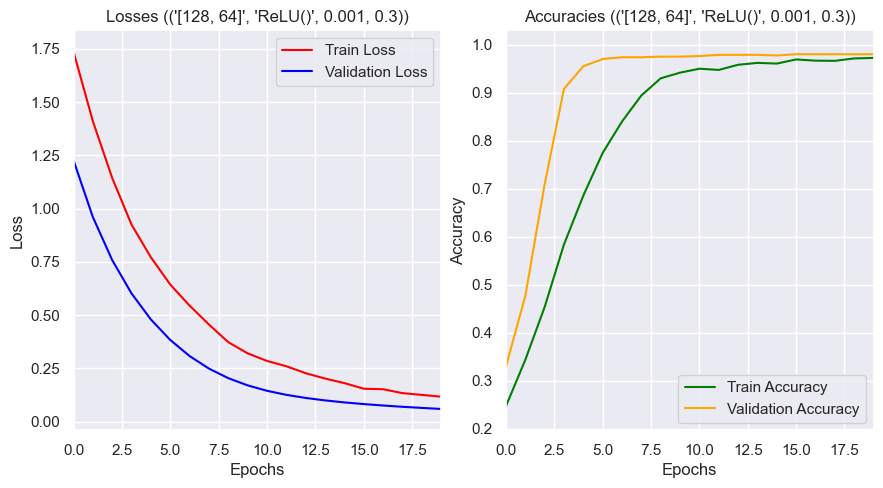

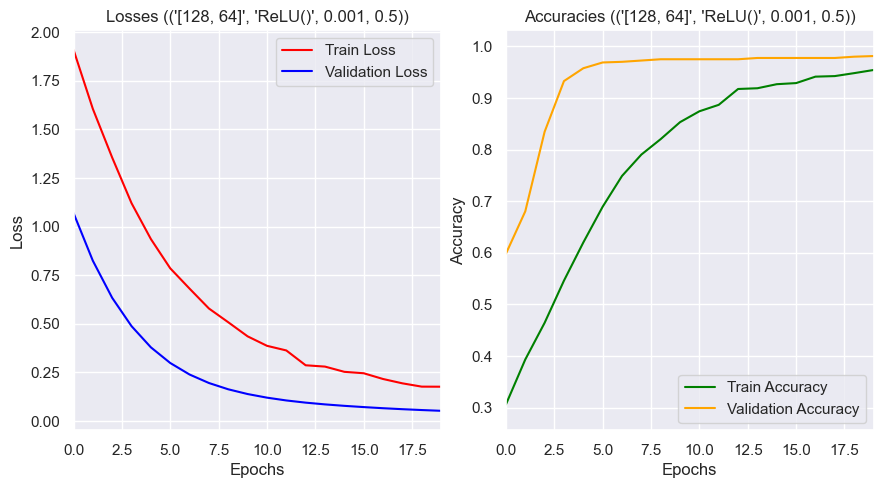

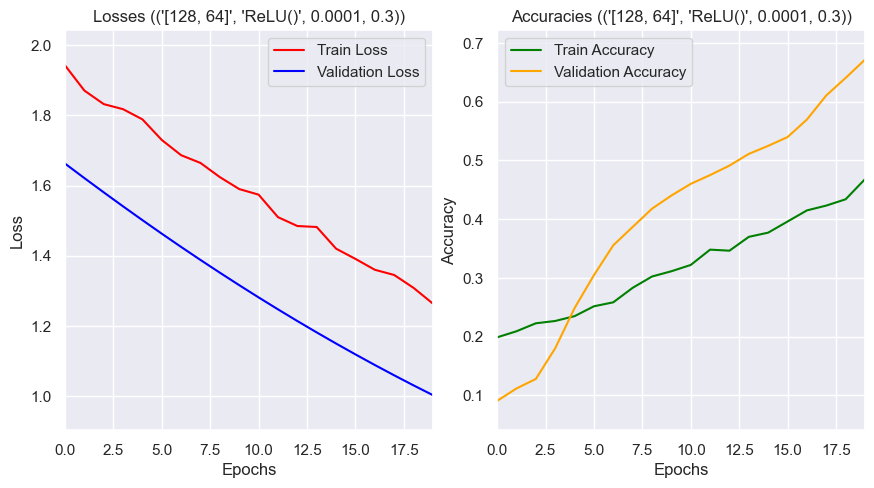

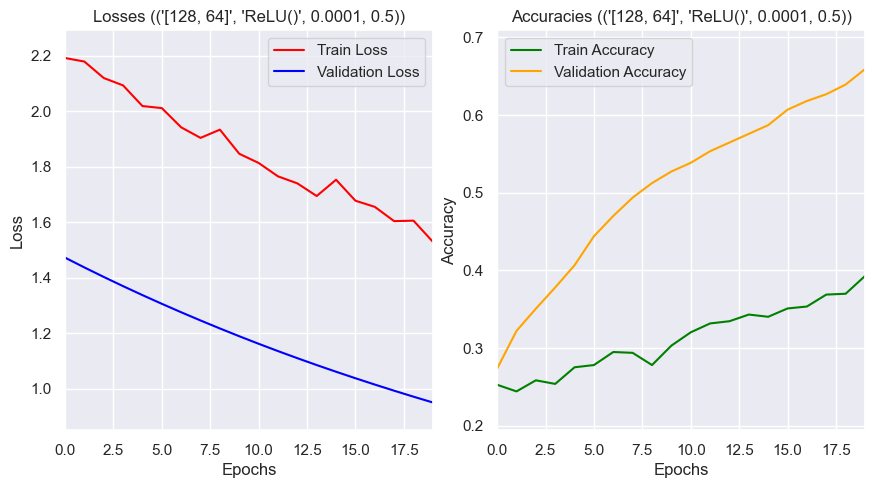

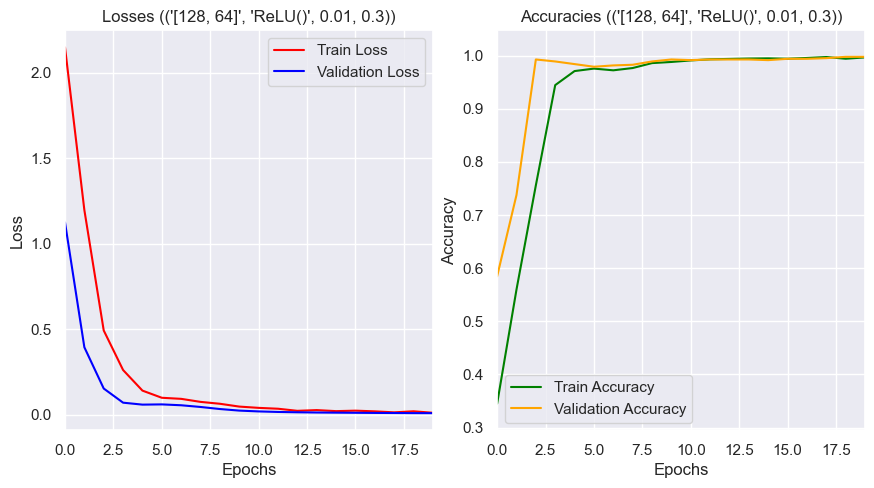

...

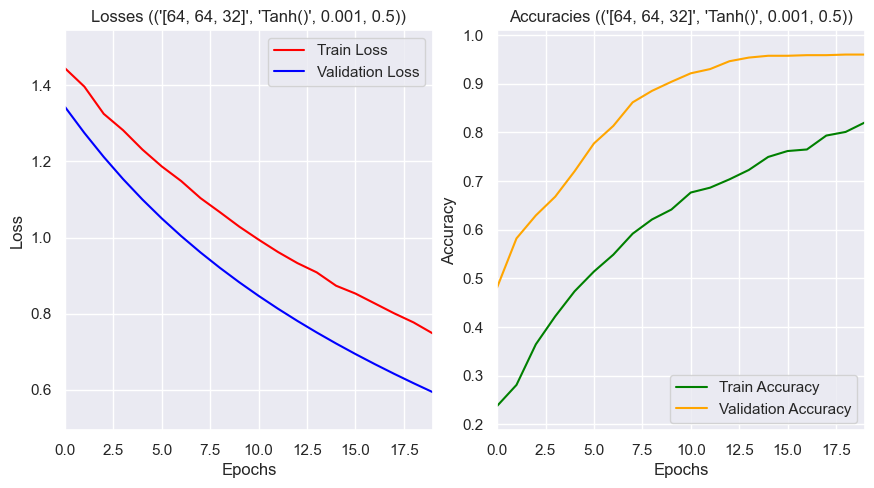

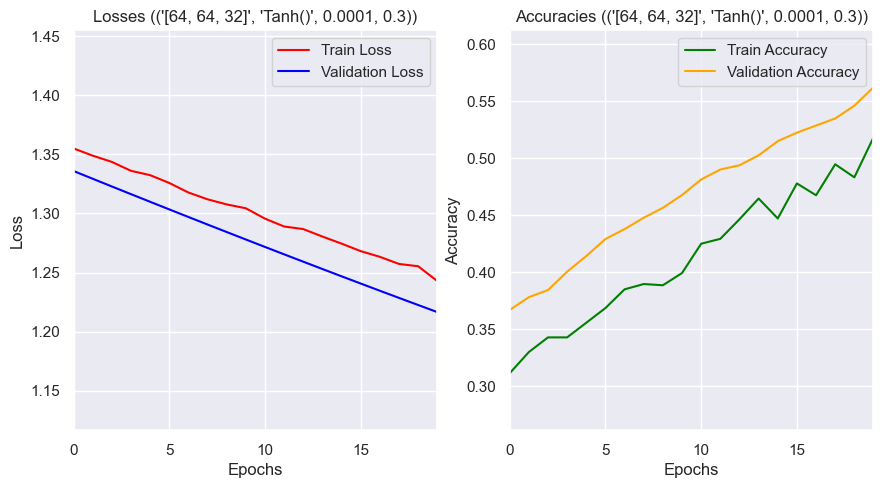

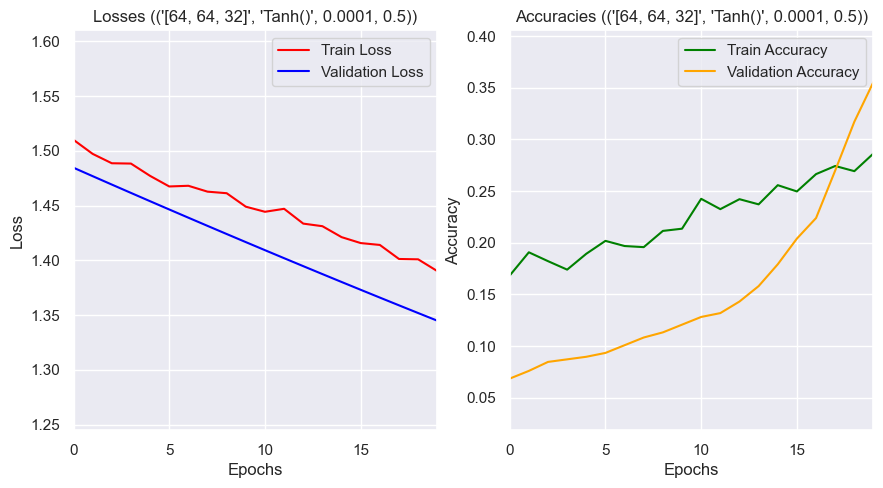

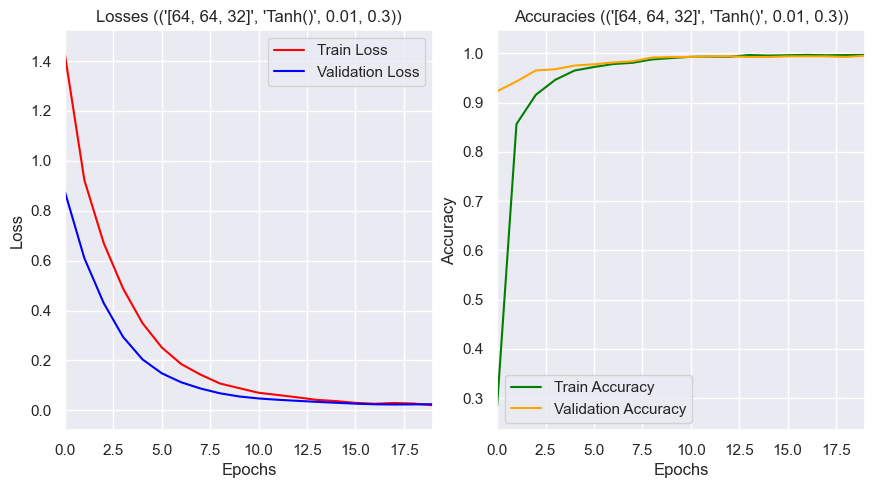

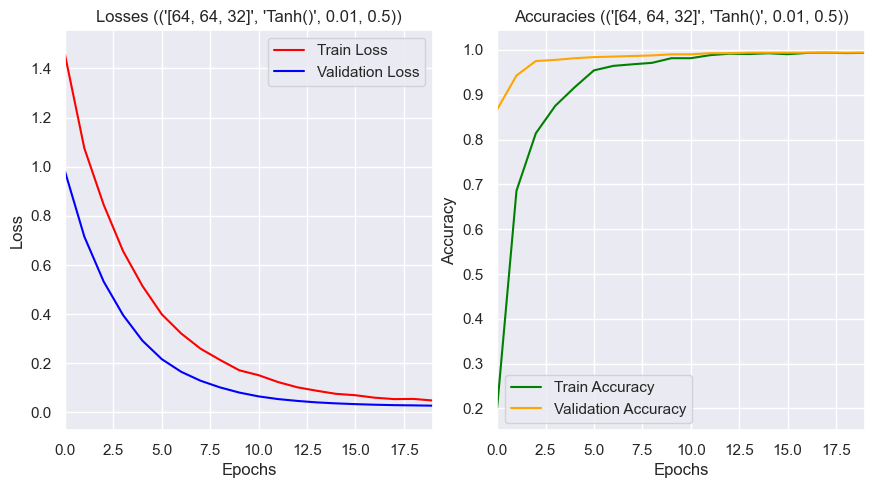

In [34]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Κωδικοποίηση των ετικετών σε αριθμητική μορφή
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Δημιουργία του μοντέλου MLP με κανονικοποίηση (Dropout και L2 regularization)
class MLP(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size, dropout_rate, activation_function):
        super(MLP, self).__init__()
        self.layers = nn.ModuleList()
        in_size = input_size
        for hidden_size in hidden_sizes:
            self.layers.append(nn.Linear(in_size, hidden_size))
            self.layers.append(activation_function)  # Συναρτήσεις ενεργοποίησης
            self.layers.append(nn.Dropout(dropout_rate))  # Dropout μετά από κάθε κρυφό επίπεδο
            in_size = hidden_size
        self.output = nn.Linear(hidden_sizes[-1], output_size)

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        x = self.output(x)
        return x

# Ορισμός του criterion (συνάρτηση κόστους)
criterion = nn.CrossEntropyLoss()

# Δημιουργία και εκπαίδευση με διαφορετικές υπερπαραμέτρους
activation_functions = [nn.ReLU(), nn.LeakyReLU(), nn.Tanh()]  # Πειραματισμός με συναρτήσεις ενεργοποίησης
hidden_layers_options = [[128, 64], [256, 128], [64, 64, 32]]  # Διάφοροι αριθμοί κρυφών επιπέδων
learning_rates = [0.001, 0.0001, 0.01]  # Διάφοροι ρυθμοί μάθησης
dropout_rates = [0.3, 0.5]  # Διαφορετικοί ρυθμοί dropout

# Αποθήκευση των αποτελεσμάτων για σύγκριση
results = {}

# Ορισμός παραμέτρων μοντέλου
input_size = X_train_pca.shape[1]  # Από το PCA
output_size = len(set(y_train_encoded))  # Από τον αριθμό των κατηγοριών

best_model = None
best_val_accuracy = 0

# Εκπαίδευση με διαφορετικές παραμέτρους
for activation_function in activation_functions:
    for hidden_layers in hidden_layers_options:
        for lr in learning_rates:
            for dropout_rate in dropout_rates:
                
                # Δημιουργία του μοντέλου με τις τρέχουσες υπερπαράμετρους
                model = MLP(input_size, hidden_layers, output_size, dropout_rate, activation_function).to(device)
                
                # Ορισμός του optimizer και της συνάρτησης κόστους
                optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.01)  # L2 regularization
                
                # Εκπαίδευση του μοντέλου
                num_epochs = 20
                train_losses = []
                val_losses = []
                train_accuracies = []
                val_accuracies = []
                test_accuracies = []

                for epoch in range(num_epochs):
                    model.train()

                    # Forward pass για τα δεδομένα εκπαίδευσης
                    outputs = model(X_train_tensor)
                    _, predicted = torch.max(outputs, 1)
                    train_accuracy = accuracy_score(y_train_tensor.cpu(), predicted.cpu())
                    train_accuracies.append(train_accuracy)

                    # Υπολογισμός απώλειας
                    loss = criterion(outputs, y_train_tensor)
                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()

                    # Αποθήκευση της τιμής της απώλειας
                    train_losses.append(loss.item())

                    # Υπολογισμός και αποθήκευση της ακρίβειας για το validation set
                    model.eval()
                    with torch.no_grad():
                        val_outputs = model(X_val_tensor)
                        val_loss = criterion(val_outputs, y_val_tensor)
                        val_losses.append(val_loss.item())  # Αποθήκευση της απώλειας του validation set

                        _, val_predicted = torch.max(val_outputs, 1)
                        val_accuracy = accuracy_score(y_val_tensor.cpu(), val_predicted.cpu())
                        val_accuracies.append(val_accuracy)

                        # Υπολογισμός και αποθήκευση της ακρίβειας για το test set
                        test_outputs = model(X_test_tensor)
                        _, test_predicted = torch.max(test_outputs, 1)
                        test_accuracy = accuracy_score(y_test_tensor.cpu(), test_predicted.cpu())
                        test_accuracies.append(test_accuracy)

                    # Εκτύπωση της απώλειας και ακρίβειας κάθε 10 εποχές
                    if (epoch+1) % 10 == 0:
                        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, '
                              f'Train Accuracy: {train_accuracy * 100:.2f}%, '
                              f'Validation Accuracy: {val_accuracy * 100:.2f}%, '
                              f'Test Accuracy: {test_accuracy * 100:.2f}%')

                # Αποθήκευση του μοντέλου με την καλύτερη ακρίβεια validation
                if val_accuracy > best_val_accuracy:
                    best_val_accuracy = val_accuracy
                    best_model = model
                    best_hyperparameters = (str(hidden_layers), activation_function.__class__.__name__, lr, dropout_rate)
                    best_result = {
                        'train_losses': train_losses.copy(),
                        'val_losses': val_losses.copy(),
                        'train_accuracies': train_accuracies.copy(),
                        'val_accuracies': val_accuracies.copy()
                    }

                # Αποθήκευση των αποτελεσμάτων για σύγκριση
                results[(str(hidden_layers), str(activation_function), lr, dropout_rate)] = {
                    'train_losses': train_losses,
                    'val_losses': val_losses,
                    'train_accuracies': train_accuracies,
                    'val_accuracies': val_accuracies,
                    'test_accuracies': test_accuracies,
                    'model': model  # Προσθήκη του μοντέλου στο dictionary
                }

# Εκτύπωση των βέλτιστων υπερπαραμέτρων
print(f'Best Hyperparameters: {best_hyperparameters}')


# Οπτικοποίηση των αποτελεσμάτων
for param_set, result in results.items():
    train_losses = result['train_losses']
    val_losses = result['val_losses']
    train_accuracies = result['train_accuracies']
    val_accuracies = result['val_accuracies']
    
    plt.figure(figsize=(10, 5))

    # Γράφημα για τις Απώλειες
    plt.subplot(1, 2, 1)
    plt.plot(range(num_epochs), train_losses, label='Train Loss', color='red')
    plt.plot(range(num_epochs), val_losses, label='Validation Loss', color='blue')
    plt.title(f'Losses ({param_set})')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Ορισμός του άξονα x ώστε να ξεκινά από το 0
    plt.xlim(0, num_epochs-1)  # Ορίζουμε το x να ξεκινά από το 0
    plt.ylim(min(train_losses + val_losses) - 0.1, max(train_losses + val_losses) + 0.1)

    # Γράφημα για τις Ακρίβειες
    plt.subplot(1, 2, 2)
    plt.plot(range(num_epochs), train_accuracies, label='Train Accuracy', color='green')
    plt.plot(range(num_epochs), val_accuracies, label='Validation Accuracy', color='orange')
    plt.title(f'Accuracies ({param_set})')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Ορισμός του άξονα x ώστε να ξεκινά από το 0
    plt.xlim(0, num_epochs-1)
    plt.ylim(min(train_accuracies + val_accuracies) - 0.05, max(train_accuracies + val_accuracies) + 0.05)

    # Προσαρμογή του layout για να αποφύγουμε την επικαλυπτόμενη περιοχή
    plt.tight_layout()

    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
    
    plt.show()

Test Loss: 0.0114


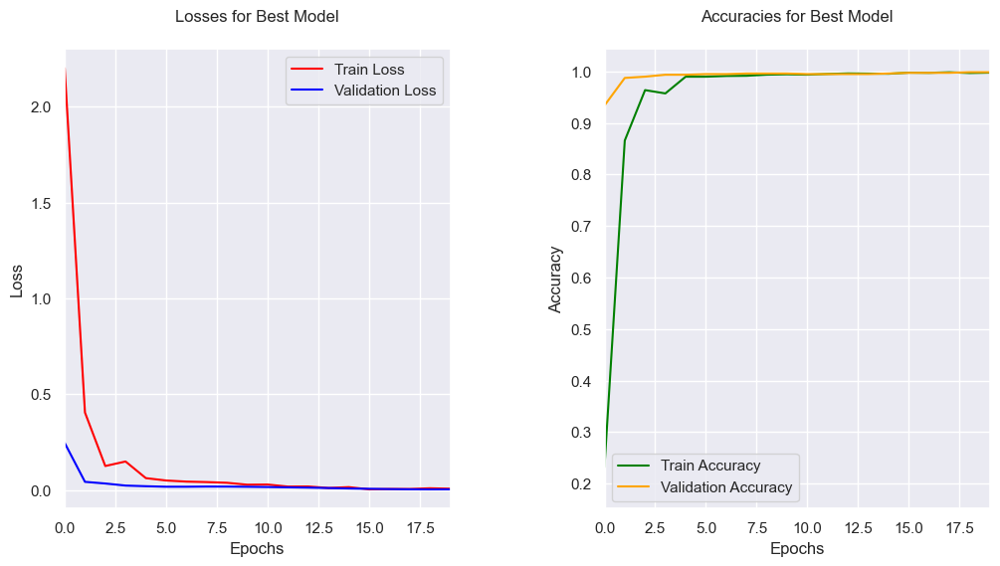

In [35]:
import matplotlib.pyplot as plt
import torch

# Υπολογισμός του Test Loss 
with torch.no_grad():
    test_outputs = best_model(X_test_tensor)  # Υπολογισμός εξόδου για το test set
    test_loss = criterion(test_outputs, y_test_tensor).item()  # Υπολογισμός του Test Loss

# Εκτύπωση του Test Loss για το καλύτερο μοντέλο
print(f'Test Loss: {test_loss:.4f}')

# Οπτικοποίηση των αποτελεσμάτων χωρίς το Test Loss και Test Accuracy
plt.figure(figsize=(12, 6))

# Γράφημα για τις Απώλειες του καλύτερου μοντέλου
plt.subplot(1, 2, 1)
plt.plot(range(num_epochs), best_result['train_losses'], label='Train Loss', color='red')
plt.plot(range(num_epochs), best_result['val_losses'], label='Validation Loss', color='blue')
plt.title(f'Losses for Best Model', pad=20)  # Προσθήκη padding στον τίτλο
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Ορισμός του άξονα x ώστε να ξεκινά από το 0
plt.xlim(0, num_epochs-1)  # Ορίζουμε το x να ξεκινά από το 0
plt.ylim(min(best_result['train_losses'] + best_result['val_losses']) - 0.1, 
         max(best_result['train_losses'] + best_result['val_losses']) + 0.1)

# Γράφημα για τις Ακρίβειες του καλύτερου μοντέλου
plt.subplot(1, 2, 2)
plt.plot(range(num_epochs), best_result['train_accuracies'], label='Train Accuracy', color='green')
plt.plot(range(num_epochs), best_result['val_accuracies'], label='Validation Accuracy', color='orange')
plt.title(f'Accuracies for Best Model', pad=20)  # Προσθήκη padding στον τίτλο
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Ορισμός του άξονα x ώστε να ξεκινά από το 0
plt.xlim(0, num_epochs-1)
plt.ylim(min(train_accuracies + val_accuracies) - 0.05, max(train_accuracies + val_accuracies) + 0.05)

# Χρήση του `subplots_adjust` για να αυξήσεις την απόσταση μεταξύ των υποπλοτ
plt.subplots_adjust(wspace=0.4, hspace=0.4)

plt.show()

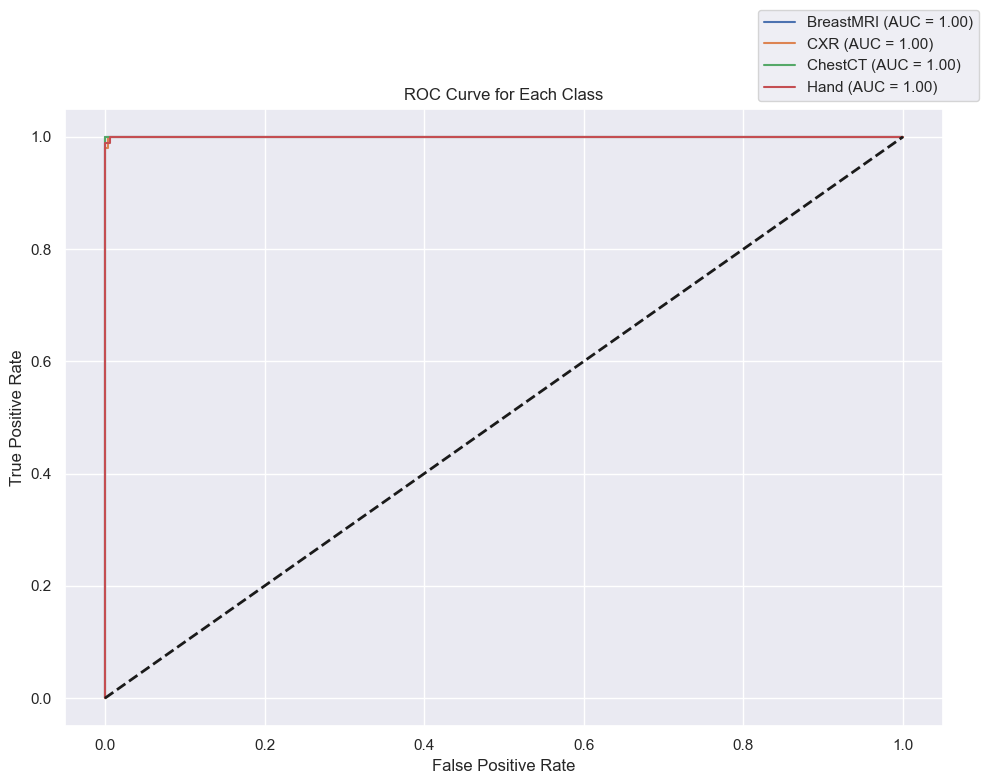

Classification Report for Test Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00        99
         CXR       1.00      0.98      0.99        99
     ChestCT       1.00      1.00      1.00        99
        Hand       0.98      1.00      0.99        99

    accuracy                           0.99       396
   macro avg       1.00      0.99      0.99       396
weighted avg       1.00      0.99      0.99       396

Classification Report for Train Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       700
         CXR       1.00      1.00      1.00       700
     ChestCT       1.00      1.00      1.00       700
        Hand       1.00      1.00      1.00       700

    accuracy                           1.00      2800
   macro avg       1.00      1.00      1.00      2800
weighted avg       1.00      1.00      1.00      2800

Classification Report for Validation Set:
              p

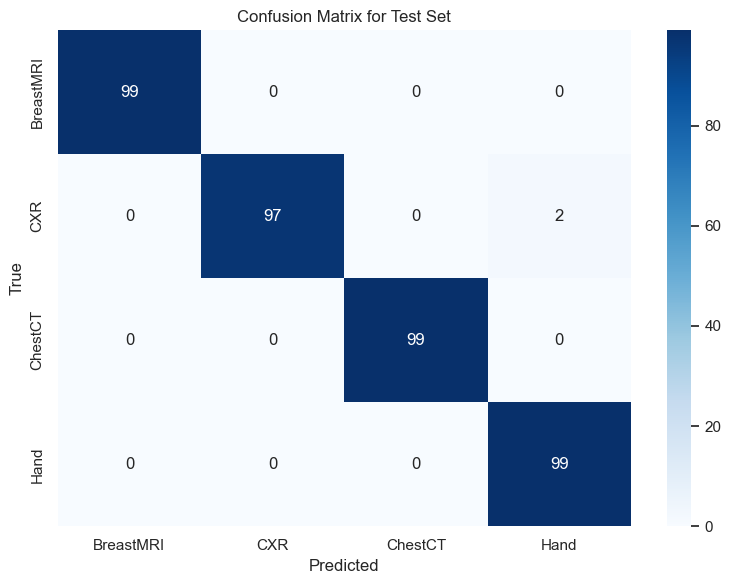

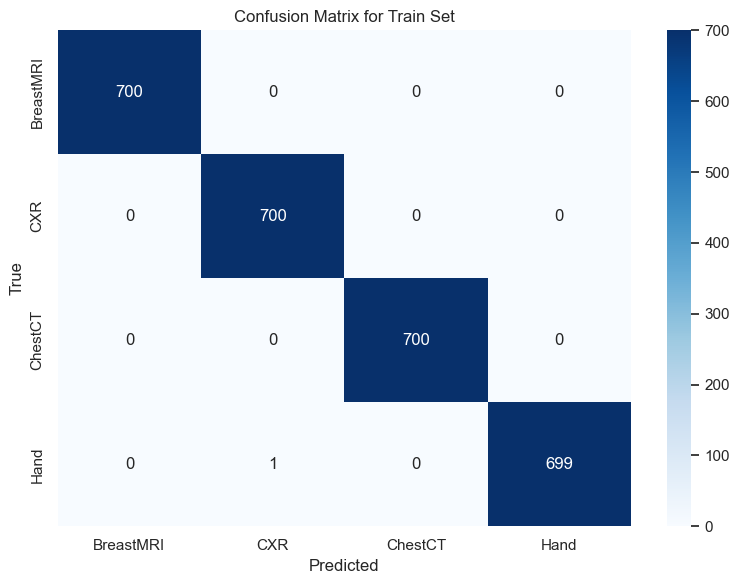

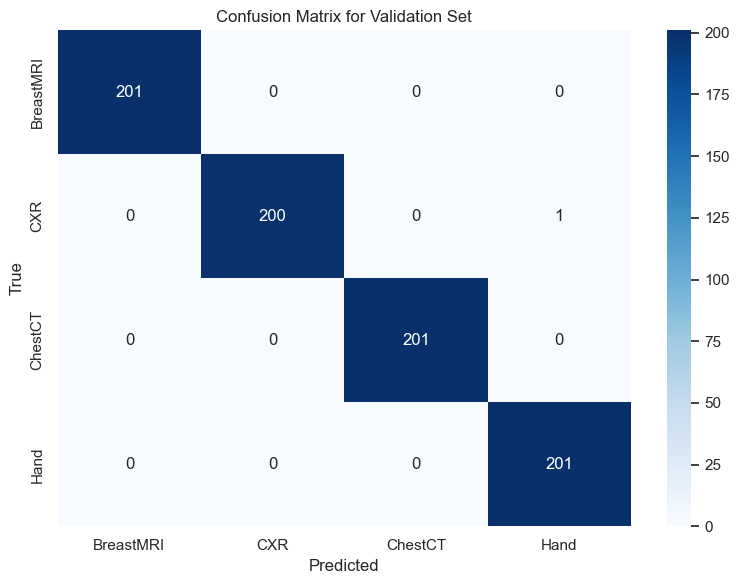

In [36]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import torch
import numpy as np
from sklearn.preprocessing import label_binarize

# Ελέγχουμε αν η class_names είναι ορισμένη. Αν όχι, τη δημιουργούμε
if 'class_names' not in locals():
    class_names = label_encoder.classes_  

# Βρίσκουμε τον αριθμό των κατηγοριών από τα δεδομένα
num_classes = len(class_names)  

# Ελέγχουμε αν η συσκευή (device) είναι ορισμένη
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Υπολογισμός πιθανοτήτων για το test set
with torch.no_grad():
    outputs = best_model(X_test_tensor.to(device))  # Υπολογισμός εξόδου για το test set
    probs = torch.softmax(outputs, dim=1)  # Εφαρμογή softmax για πιθανότητες

# Binarization των ετικετών για το ROC
y_test_bin = label_binarize(y_test_tensor.cpu().numpy(), classes=np.arange(num_classes))

# Υπολογισμός ROC και AUC για κάθε κατηγορία
fpr = {}
tpr = {}
roc_auc = {}

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], probs[:, i].cpu().numpy())
    roc_auc[i] = auc(fpr[i], tpr[i])

# Σχεδίαση ROC curves
plt.figure(figsize=(10, 8))
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Διάσπαση για την τυχαία απόδοση
plt.title('ROC Curve for Each Class')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

# Εκτύπωση Classification Report για το Test Set με τα ονόματα των κατηγοριών
y_pred_test = torch.argmax(probs, dim=1).cpu().numpy()  # Ταξινόμηση με τις μεγάλες πιθανότητες
print("Classification Report for Test Set:")
print(classification_report(y_test_tensor.cpu().numpy(), y_pred_test, target_names=class_names))

# Εκτύπωση Classification Report για το Train Set
y_pred_train = torch.argmax(best_model(X_train_tensor.to(device)), dim=1).cpu().numpy()
print("Classification Report for Train Set:")
print(classification_report(y_train_tensor.cpu().numpy(), y_pred_train, target_names=class_names))

# Εκτύπωση Classification Report για το Validation Set
y_pred_val = torch.argmax(best_model(X_val_tensor.to(device)), dim=1).cpu().numpy()
print("Classification Report for Validation Set:")
print(classification_report(y_val_tensor.cpu().numpy(), y_pred_val, target_names=class_names))

# Confusion Matrix για το Test Set
conf_matrix_test = confusion_matrix(y_test_tensor.cpu().numpy(), y_pred_test)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix for Test Set")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()

# Confusion Matrix για το Train Set
conf_matrix_train = confusion_matrix(y_train_tensor.cpu().numpy(), y_pred_train)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_train, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix for Train Set")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()

# Confusion Matrix για το Validation Set
conf_matrix_val = confusion_matrix(y_val_tensor.cpu().numpy(), y_pred_val)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_val, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix for Validation Set")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()


Συνελικτικό Νευρωνικό Δίκτυο (CNN)

Ο στόχος είναι να χρησιμοποιήσουμε τα data με τέτοιον τρόπο, προκειμένου το CNN δίκτυο που θα δημιουργήσουμε να μπορεί να αναγνωρίσει μοτίβα μέσα στις εικόνες. Το CNN είναι βελτιστοποιημένο για να επεξεργάζεται εικόνες και να ανιχνεύει τοπικά μοτίβα (π.χ., άκρα, υφές, σχήματα κ.λπ.) σε εικόνες. Επομένως, επιλέγουμε να αξιοποιήσουμε τα δεδομένα όπως ήταν πριν την εφαρμογή PCA, διότι με την εφαρμογή του ενδεχομένως χάσουμε αυτά τα τοπικά μοτίβα, καθώς το PCA, συνήθως, εξάγει γραμμικά συνδυασμένα χαρακτηριστικά και ίσως χάσουμε πληροφορία που το CNN θα μπορούσε να εκμεταλλευτεί.

Αρχικά δημιουργούμε ένα δίκτυο με 3 επίπεδα συνελίξεων (conv1, conv2, conv3), το καθένα με ReLU ως συνάρτηση ενεργοποίησης. Χρησιμοποιούμε MaxPooling2d για να μειώσουμε τις διαστάσεις των χαρακτηριστικών και να αποφύγουμε την υπερβολική υπολογιστική επιβάρυνση. Κάθε επίπεδο MaxPool2d μειώνει τις διαστάσεις των εικόνων κατά το ήμισυ. Τα επίπεδα fc1 και fc2 είναι πλήρως συνδεδεμένα, και χρησιμοποιούνται για την κατηγοριοποίηση των εξαγόμενων χαρακτηριστικών σε κατηγορίες. Το μοντέλο καταλήγει με ένα επίπεδο εξόδου (output layer) που έχει num_classes μονάδες (μία για κάθε κατηγορία), και η έξοδος είναι μια πιθανότητα για κάθε κατηγορία.

In [37]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Μετατροπή ετικετών σε αριθμούς
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Μετατροπή των εικόνων σε PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).unsqueeze(1)  # Προσθήκη καναλιού (1 για grayscale)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32).unsqueeze(1)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).unsqueeze(1)

# Δημιουργία TensorDataset και DataLoader
train_data = TensorDataset(X_train_tensor, torch.tensor(y_train_encoded, dtype=torch.long))
val_data = TensorDataset(X_val_tensor, torch.tensor(y_val_encoded, dtype=torch.long))
test_data = TensorDataset(X_test_tensor, torch.tensor(y_test_encoded, dtype=torch.long))

train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_loader = DataLoader(val_data, batch_size=32, shuffle=False)
test_loader = DataLoader(test_data, batch_size=32, shuffle=False)

# Ορισμός του CNN μοντέλου
class CNN(nn.Module):
    def __init__(self, num_classes):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)  # 1: κανάλι εικόνας (grayscale)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(128 * 8 * 8, 512)  # Προσαρμογή ανάλογα με το μέγεθος των εικόνων
        self.fc2 = nn.Linear(512, num_classes)
        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(2)

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.maxpool(x)
        x = self.relu(self.conv2(x))
        x = self.maxpool(x)
        x = self.relu(self.conv3(x))
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)  # Flatten το tensor
        x = self.relu(self.fc1(x))
        x = self.fc2(x)
        return x

# Ορισμός του μοντέλου, κριτηρίου και optimizer
model = CNN(num_classes=len(np.unique(y_train)))
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Εκπαίδευση του μοντέλου
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_accuracy = 100 * correct / total
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader):.4f}, Accuracy: {train_accuracy:.2f}%")

# Αξιολόγηση του μοντέλου στο Validation Set
model.eval()
val_correct = 0
val_total = 0
with torch.no_grad():
    for inputs, labels in val_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        val_total += labels.size(0)
        val_correct += (predicted == labels).sum().item()

val_accuracy = 100 * val_correct / val_total
print(f"Validation Accuracy: {val_accuracy:.2f}%")

# Αξιολόγηση του μοντέλου στο Test Set
test_correct = 0
test_total = 0
with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()

test_accuracy = 100 * test_correct / test_total
print(f"Test Accuracy: {test_accuracy:.2f}%")

Epoch 1/20, Loss: 2.1261, Accuracy: 93.86%
Epoch 2/20, Loss: 0.0170, Accuracy: 99.57%
Epoch 3/20, Loss: 0.0048, Accuracy: 99.86%
Epoch 4/20, Loss: 0.0025, Accuracy: 99.86%
Epoch 5/20, Loss: 0.0508, Accuracy: 98.79%
Epoch 6/20, Loss: 0.0740, Accuracy: 98.96%
Epoch 7/20, Loss: 0.0618, Accuracy: 98.96%
Epoch 8/20, Loss: 0.0111, Accuracy: 99.82%
Epoch 9/20, Loss: 0.0118, Accuracy: 99.82%
Epoch 10/20, Loss: 0.0056, Accuracy: 99.89%
Epoch 11/20, Loss: 0.0001, Accuracy: 100.00%
Epoch 12/20, Loss: 0.0000, Accuracy: 100.00%
Epoch 13/20, Loss: 0.0000, Accuracy: 100.00%
Epoch 14/20, Loss: 0.0000, Accuracy: 100.00%
Epoch 15/20, Loss: 0.0000, Accuracy: 100.00%
Epoch 16/20, Loss: 0.0000, Accuracy: 100.00%
Epoch 17/20, Loss: 0.0000, Accuracy: 100.00%
Epoch 18/20, Loss: 0.0000, Accuracy: 100.00%
Epoch 19/20, Loss: 0.0000, Accuracy: 100.00%
Epoch 20/20, Loss: 0.0000, Accuracy: 100.00%
Validation Accuracy: 99.75%
Test Accuracy: 99.75%


Τώρα που έχουμε ένα λειτουργικό μοντέλο, μπορούμε να προχωρήσουμε σε διάφορες βελτιώσεις: μπορούμε να πειραματιστούμε με τον αριθμό των συνελικτικών και πλήρως συνδεδεμένων επιπέδων για να βρούμε την καλύτερη αρχιτεκτονική, να δοκιμάσουμε διαφορετικούς ρυθμούς μάθησης για να βελτιώσουμε την σύγκλιση, να προσθέσουμε τεχνικές regularization όπως Dropout για να αποφύγουμε την υπερπροσαρμογή (overfitting).


Training with lr=0.001, activation_fn=ReLU, weight_decay=0.01
Epoch 1/20, Train Loss: 1.8378, Train Accuracy: 91.36%, Val Loss: 0.0734, Val Accuracy: 99.38%
Epoch 2/20, Train Loss: 0.0312, Train Accuracy: 99.11%, Val Loss: 0.0151, Val Accuracy: 99.25%
Epoch 3/20, Train Loss: 0.0197, Train Accuracy: 99.32%, Val Loss: 0.0151, Val Accuracy: 99.50%
Epoch 4/20, Train Loss: 0.0104, Train Accuracy: 99.64%, Val Loss: 0.0190, Val Accuracy: 99.38%
Epoch 5/20, Train Loss: 0.0199, Train Accuracy: 99.39%, Val Loss: 0.0096, Val Accuracy: 99.63%
Epoch 6/20, Train Loss: 0.0193, Train Accuracy: 99.39%, Val Loss: 0.0792, Val Accuracy: 97.76%
Epoch 7/20, Train Loss: 0.0184, Train Accuracy: 99.57%, Val Loss: 0.0178, Val Accuracy: 99.38%
Epoch 8/20, Train Loss: 0.0175, Train Accuracy: 99.43%, Val Loss: 0.0215, Val Accuracy: 99.38%
Epoch 9/20, Train Loss: 0.0345, Train Accuracy: 99.00%, Val Loss: 0.0206, Val Accuracy: 99.38%
Epoch 10/20, Train Loss: 0.0351, Train Accuracy: 99.14%, Val Loss: 0.0119, Val Acc

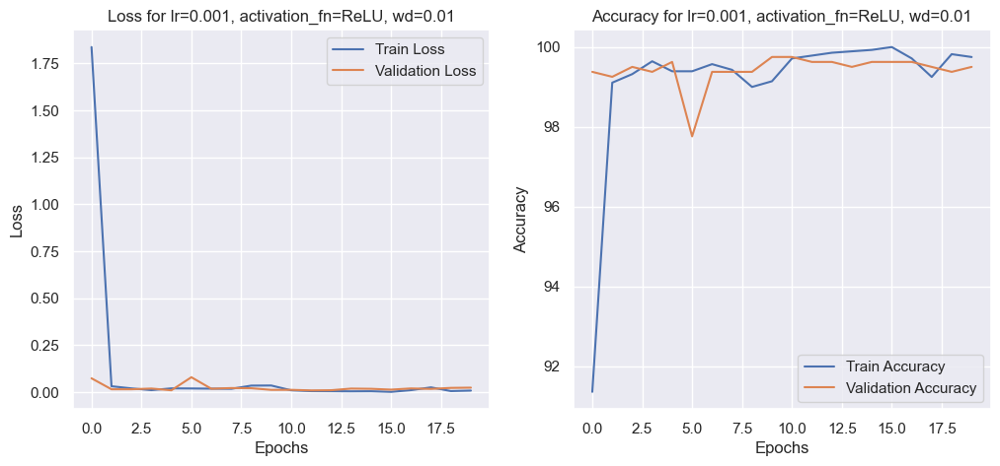


Training with lr=0.001, activation_fn=ReLU, weight_decay=0.001
Epoch 1/20, Train Loss: 0.7292, Train Accuracy: 93.71%, Val Loss: 0.0253, Val Accuracy: 99.00%
Epoch 2/20, Train Loss: 0.0296, Train Accuracy: 99.18%, Val Loss: 0.0112, Val Accuracy: 99.75%
Epoch 3/20, Train Loss: 0.0153, Train Accuracy: 99.54%, Val Loss: 0.0124, Val Accuracy: 99.50%
Epoch 4/20, Train Loss: 0.0078, Train Accuracy: 99.71%, Val Loss: 0.0032, Val Accuracy: 99.88%
Epoch 5/20, Train Loss: 0.0053, Train Accuracy: 99.82%, Val Loss: 0.0092, Val Accuracy: 99.63%
Epoch 6/20, Train Loss: 0.0060, Train Accuracy: 99.75%, Val Loss: 0.0042, Val Accuracy: 99.88%
Epoch 7/20, Train Loss: 0.0089, Train Accuracy: 99.64%, Val Loss: 0.0151, Val Accuracy: 99.50%
Epoch 8/20, Train Loss: 0.0031, Train Accuracy: 99.89%, Val Loss: 0.0094, Val Accuracy: 99.75%
Epoch 9/20, Train Loss: 0.0047, Train Accuracy: 99.79%, Val Loss: 0.0011, Val Accuracy: 99.88%
Epoch 10/20, Train Loss: 0.0003, Train Accuracy: 100.00%, Val Loss: 0.0022, Val A

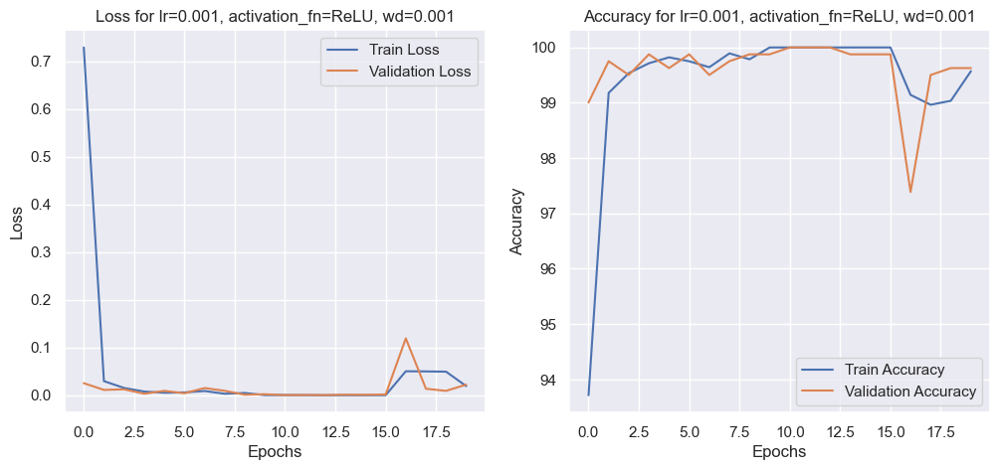


Training with lr=0.001, activation_fn=LeakyReLU, weight_decay=0.01
Epoch 1/20, Train Loss: 1.6343, Train Accuracy: 93.82%, Val Loss: 0.0245, Val Accuracy: 99.50%
Epoch 2/20, Train Loss: 0.0736, Train Accuracy: 98.64%, Val Loss: 0.0127, Val Accuracy: 99.63%
Epoch 3/20, Train Loss: 0.0220, Train Accuracy: 99.50%, Val Loss: 0.0073, Val Accuracy: 99.63%
Epoch 4/20, Train Loss: 0.0089, Train Accuracy: 99.71%, Val Loss: 0.0216, Val Accuracy: 99.50%
Epoch 5/20, Train Loss: 0.0920, Train Accuracy: 98.00%, Val Loss: 0.1740, Val Accuracy: 98.13%
Epoch 6/20, Train Loss: 0.1608, Train Accuracy: 98.14%, Val Loss: 0.0531, Val Accuracy: 99.25%
Epoch 7/20, Train Loss: 0.0440, Train Accuracy: 99.07%, Val Loss: 0.0101, Val Accuracy: 99.75%
Epoch 8/20, Train Loss: 0.0310, Train Accuracy: 99.57%, Val Loss: 0.0135, Val Accuracy: 99.88%
Epoch 9/20, Train Loss: 0.0095, Train Accuracy: 99.82%, Val Loss: 0.0134, Val Accuracy: 99.88%
Epoch 10/20, Train Loss: 0.0054, Train Accuracy: 99.86%, Val Loss: 0.0102, Va

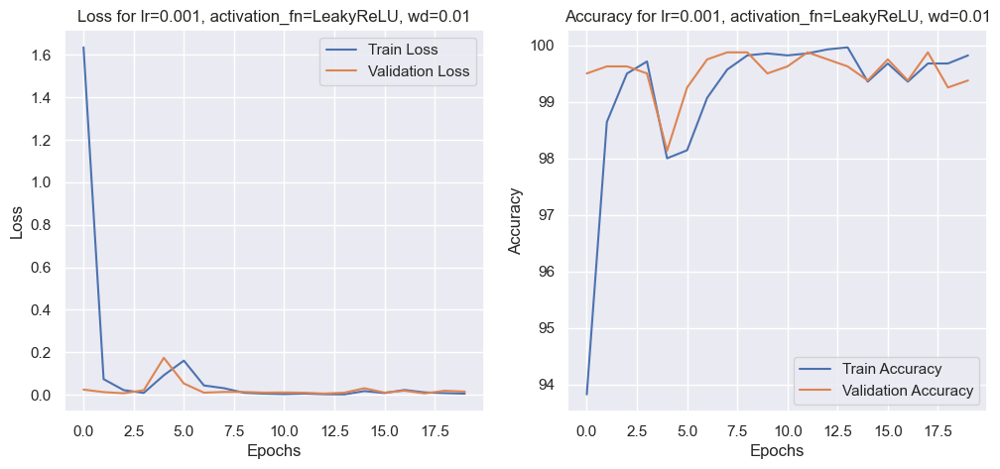


Training with lr=0.001, activation_fn=LeakyReLU, weight_decay=0.001
Epoch 1/20, Train Loss: 1.4910, Train Accuracy: 92.71%, Val Loss: 0.2359, Val Accuracy: 97.64%
Epoch 2/20, Train Loss: 0.1152, Train Accuracy: 98.46%, Val Loss: 0.0313, Val Accuracy: 99.50%
Epoch 3/20, Train Loss: 0.0408, Train Accuracy: 99.25%, Val Loss: 0.0425, Val Accuracy: 99.00%
Epoch 4/20, Train Loss: 0.0339, Train Accuracy: 99.54%, Val Loss: 0.0337, Val Accuracy: 99.00%
Epoch 5/20, Train Loss: 0.0139, Train Accuracy: 99.61%, Val Loss: 0.0555, Val Accuracy: 98.76%
Epoch 6/20, Train Loss: 0.0104, Train Accuracy: 99.79%, Val Loss: 0.0168, Val Accuracy: 99.38%
Epoch 7/20, Train Loss: 0.0126, Train Accuracy: 99.68%, Val Loss: 0.0205, Val Accuracy: 99.50%
Epoch 8/20, Train Loss: 0.0062, Train Accuracy: 99.82%, Val Loss: 0.0175, Val Accuracy: 99.38%
Epoch 9/20, Train Loss: 0.0011, Train Accuracy: 99.93%, Val Loss: 0.0158, Val Accuracy: 99.88%
Epoch 10/20, Train Loss: 0.0012, Train Accuracy: 99.96%, Val Loss: 0.0229, V

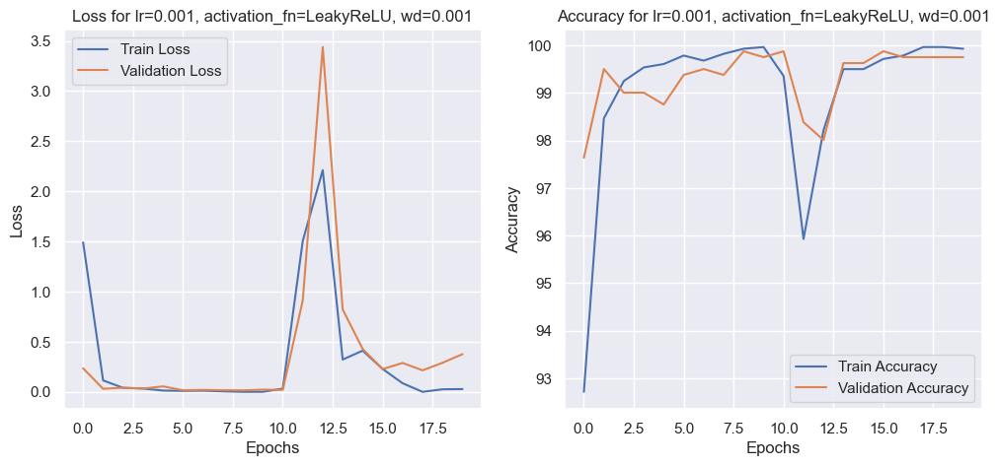


Training with lr=0.001, activation_fn=ELU, weight_decay=0.01
Epoch 1/20, Train Loss: 1.8451, Train Accuracy: 92.21%, Val Loss: 0.0221, Val Accuracy: 99.25%
Epoch 2/20, Train Loss: 0.0378, Train Accuracy: 98.93%, Val Loss: 0.0081, Val Accuracy: 99.75%
Epoch 3/20, Train Loss: 0.0137, Train Accuracy: 99.43%, Val Loss: 0.0059, Val Accuracy: 99.50%
Epoch 4/20, Train Loss: 0.0124, Train Accuracy: 99.61%, Val Loss: 0.0284, Val Accuracy: 98.63%
Epoch 5/20, Train Loss: 0.0253, Train Accuracy: 99.29%, Val Loss: 0.0890, Val Accuracy: 98.01%
Epoch 6/20, Train Loss: 0.0451, Train Accuracy: 98.96%, Val Loss: 0.0070, Val Accuracy: 99.63%
Epoch 7/20, Train Loss: 0.0179, Train Accuracy: 99.50%, Val Loss: 0.0514, Val Accuracy: 99.00%
Epoch 8/20, Train Loss: 0.0070, Train Accuracy: 99.86%, Val Loss: 0.0059, Val Accuracy: 99.75%
Epoch 9/20, Train Loss: 0.0085, Train Accuracy: 99.75%, Val Loss: 0.0173, Val Accuracy: 99.38%
Epoch 10/20, Train Loss: 0.0108, Train Accuracy: 99.79%, Val Loss: 0.0256, Val Accu

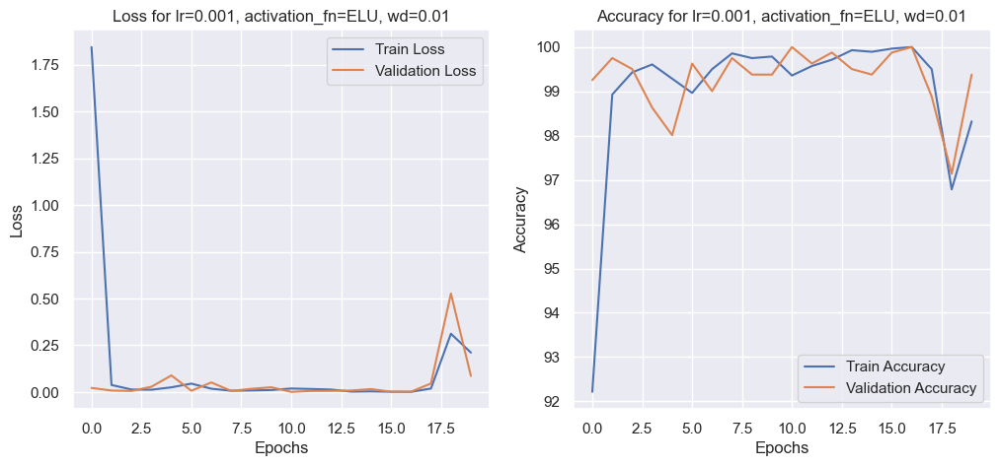


Training with lr=0.001, activation_fn=ELU, weight_decay=0.001
Epoch 1/20, Train Loss: 2.0813, Train Accuracy: 90.75%, Val Loss: 0.0313, Val Accuracy: 99.25%
Epoch 2/20, Train Loss: 0.0346, Train Accuracy: 98.93%, Val Loss: 0.0171, Val Accuracy: 99.50%
Epoch 3/20, Train Loss: 0.0174, Train Accuracy: 99.43%, Val Loss: 0.0224, Val Accuracy: 99.38%
Epoch 4/20, Train Loss: 0.0159, Train Accuracy: 99.54%, Val Loss: 0.0113, Val Accuracy: 99.50%
Epoch 5/20, Train Loss: 0.0118, Train Accuracy: 99.75%, Val Loss: 0.0161, Val Accuracy: 99.63%
Epoch 6/20, Train Loss: 0.0110, Train Accuracy: 99.71%, Val Loss: 0.0367, Val Accuracy: 99.38%
Epoch 7/20, Train Loss: 0.0619, Train Accuracy: 98.64%, Val Loss: 0.0130, Val Accuracy: 99.63%
Epoch 8/20, Train Loss: 0.0572, Train Accuracy: 99.11%, Val Loss: 0.0784, Val Accuracy: 98.26%
Epoch 9/20, Train Loss: 0.0795, Train Accuracy: 98.61%, Val Loss: 0.0783, Val Accuracy: 99.13%
Epoch 10/20, Train Loss: 0.7538, Train Accuracy: 96.46%, Val Loss: 0.6837, Val Acc

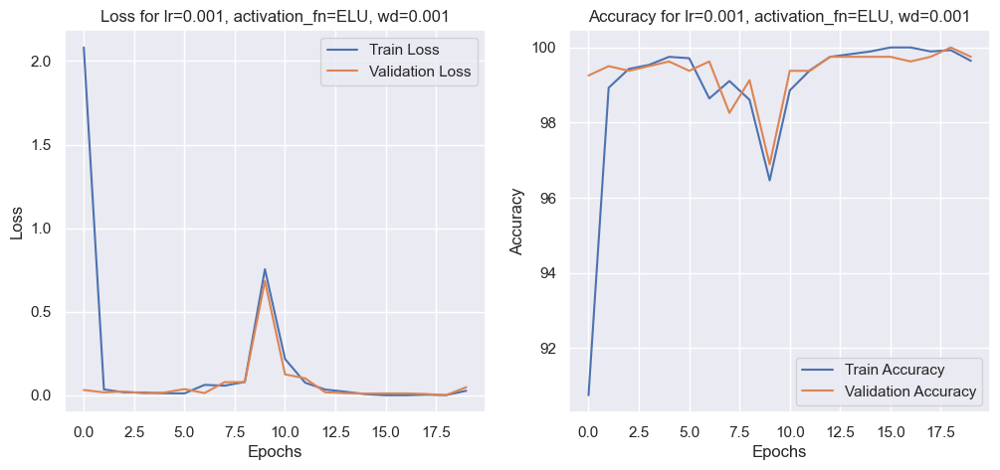


Training with lr=0.0001, activation_fn=ReLU, weight_decay=0.01
Epoch 1/20, Train Loss: 0.2855, Train Accuracy: 92.71%, Val Loss: 0.0120, Val Accuracy: 99.63%
Epoch 2/20, Train Loss: 0.0158, Train Accuracy: 99.46%, Val Loss: 0.0116, Val Accuracy: 99.63%
Epoch 3/20, Train Loss: 0.0109, Train Accuracy: 99.68%, Val Loss: 0.0059, Val Accuracy: 99.63%
Epoch 4/20, Train Loss: 0.0082, Train Accuracy: 99.75%, Val Loss: 0.0033, Val Accuracy: 99.88%
Epoch 5/20, Train Loss: 0.0026, Train Accuracy: 99.96%, Val Loss: 0.0136, Val Accuracy: 99.25%
Epoch 6/20, Train Loss: 0.0015, Train Accuracy: 99.96%, Val Loss: 0.0041, Val Accuracy: 99.88%
Epoch 7/20, Train Loss: 0.0029, Train Accuracy: 99.89%, Val Loss: 0.0035, Val Accuracy: 99.75%
Epoch 8/20, Train Loss: 0.0030, Train Accuracy: 99.89%, Val Loss: 0.0023, Val Accuracy: 99.88%
Epoch 9/20, Train Loss: 0.0033, Train Accuracy: 99.93%, Val Loss: 0.0029, Val Accuracy: 99.75%
Epoch 10/20, Train Loss: 0.0014, Train Accuracy: 99.96%, Val Loss: 0.0133, Val Ac

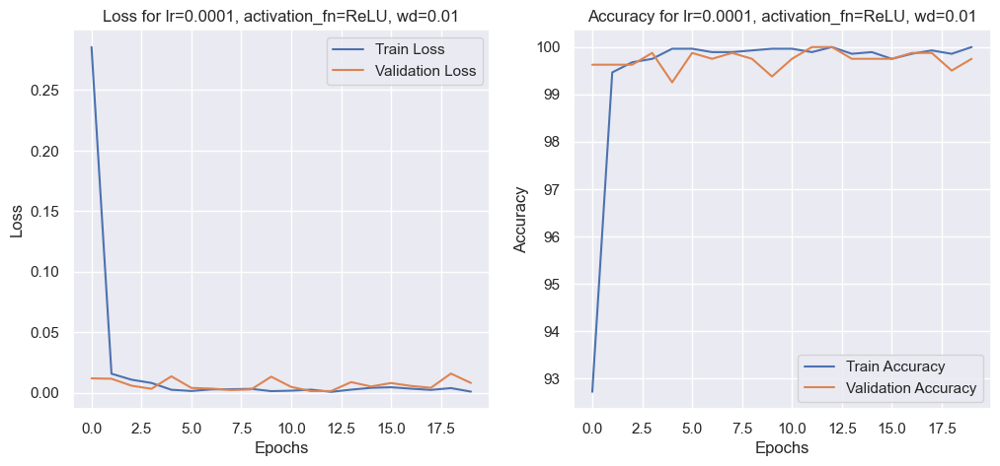


Training with lr=0.0001, activation_fn=ReLU, weight_decay=0.001
Epoch 1/20, Train Loss: 0.2266, Train Accuracy: 94.96%, Val Loss: 0.0086, Val Accuracy: 99.63%
Epoch 2/20, Train Loss: 0.0217, Train Accuracy: 99.29%, Val Loss: 0.0087, Val Accuracy: 99.75%
Epoch 3/20, Train Loss: 0.0053, Train Accuracy: 99.89%, Val Loss: 0.0142, Val Accuracy: 99.75%
Epoch 4/20, Train Loss: 0.0054, Train Accuracy: 99.86%, Val Loss: 0.0085, Val Accuracy: 99.75%
Epoch 5/20, Train Loss: 0.0022, Train Accuracy: 99.96%, Val Loss: 0.0104, Val Accuracy: 99.75%
Epoch 6/20, Train Loss: 0.0007, Train Accuracy: 100.00%, Val Loss: 0.0050, Val Accuracy: 99.75%
Epoch 7/20, Train Loss: 0.0069, Train Accuracy: 99.79%, Val Loss: 0.0070, Val Accuracy: 99.75%
Epoch 8/20, Train Loss: 0.0017, Train Accuracy: 99.96%, Val Loss: 0.0046, Val Accuracy: 99.75%
Epoch 9/20, Train Loss: 0.0040, Train Accuracy: 99.82%, Val Loss: 0.0072, Val Accuracy: 99.75%
Epoch 10/20, Train Loss: 0.0023, Train Accuracy: 99.93%, Val Loss: 0.0045, Val 

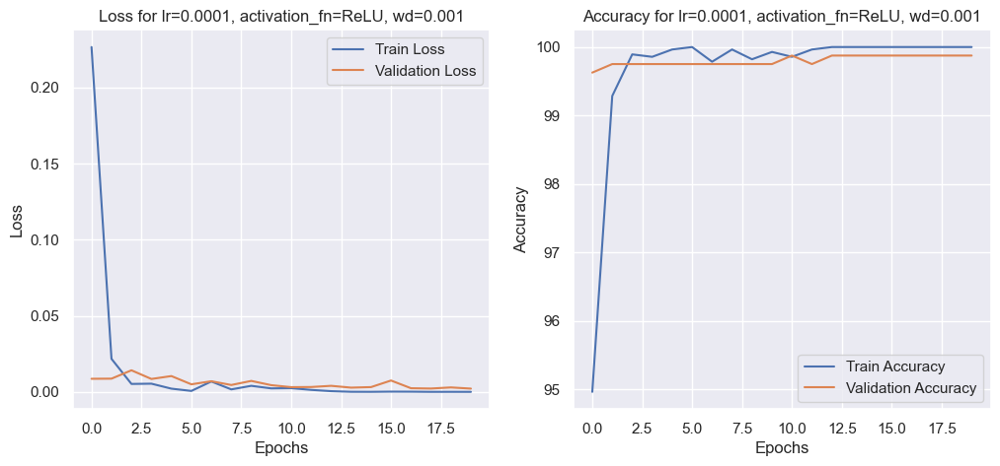


Training with lr=0.0001, activation_fn=LeakyReLU, weight_decay=0.01
Epoch 1/20, Train Loss: 0.3434, Train Accuracy: 93.68%, Val Loss: 0.0162, Val Accuracy: 99.13%
Epoch 2/20, Train Loss: 0.0185, Train Accuracy: 99.46%, Val Loss: 0.0134, Val Accuracy: 99.75%
Epoch 3/20, Train Loss: 0.0087, Train Accuracy: 99.79%, Val Loss: 0.0105, Val Accuracy: 99.75%
Epoch 4/20, Train Loss: 0.0056, Train Accuracy: 99.82%, Val Loss: 0.0092, Val Accuracy: 99.63%
Epoch 5/20, Train Loss: 0.0049, Train Accuracy: 99.79%, Val Loss: 0.0199, Val Accuracy: 99.13%
Epoch 6/20, Train Loss: 0.0042, Train Accuracy: 99.86%, Val Loss: 0.0116, Val Accuracy: 99.50%
Epoch 7/20, Train Loss: 0.0011, Train Accuracy: 99.96%, Val Loss: 0.0096, Val Accuracy: 99.50%
Epoch 8/20, Train Loss: 0.0005, Train Accuracy: 100.00%, Val Loss: 0.0051, Val Accuracy: 99.75%
Epoch 9/20, Train Loss: 0.0024, Train Accuracy: 99.96%, Val Loss: 0.0133, Val Accuracy: 99.38%
Epoch 10/20, Train Loss: 0.0052, Train Accuracy: 99.82%, Val Loss: 0.0081, 

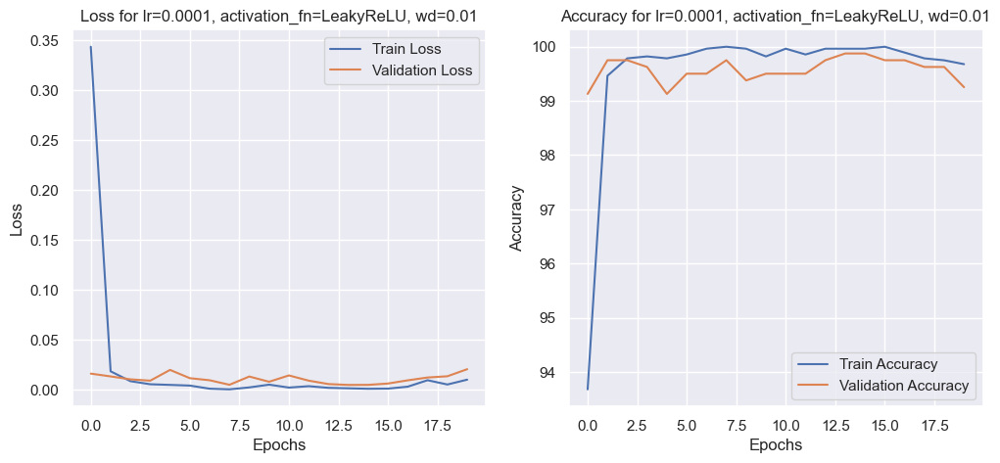


Training with lr=0.0001, activation_fn=LeakyReLU, weight_decay=0.001
Epoch 1/20, Train Loss: 0.5757, Train Accuracy: 93.07%, Val Loss: 0.0138, Val Accuracy: 99.63%
Epoch 2/20, Train Loss: 0.0204, Train Accuracy: 99.39%, Val Loss: 0.0073, Val Accuracy: 99.63%
Epoch 3/20, Train Loss: 0.0088, Train Accuracy: 99.71%, Val Loss: 0.0074, Val Accuracy: 99.75%
Epoch 4/20, Train Loss: 0.0053, Train Accuracy: 99.82%, Val Loss: 0.0048, Val Accuracy: 99.88%
Epoch 5/20, Train Loss: 0.0021, Train Accuracy: 99.93%, Val Loss: 0.0056, Val Accuracy: 99.88%
Epoch 6/20, Train Loss: 0.0029, Train Accuracy: 99.89%, Val Loss: 0.0115, Val Accuracy: 99.63%
Epoch 7/20, Train Loss: 0.0059, Train Accuracy: 99.82%, Val Loss: 0.0053, Val Accuracy: 99.75%
Epoch 8/20, Train Loss: 0.0100, Train Accuracy: 99.54%, Val Loss: 0.0208, Val Accuracy: 99.25%
Epoch 9/20, Train Loss: 0.0051, Train Accuracy: 99.82%, Val Loss: 0.0064, Val Accuracy: 99.63%
Epoch 10/20, Train Loss: 0.0038, Train Accuracy: 99.89%, Val Loss: 0.0017, 

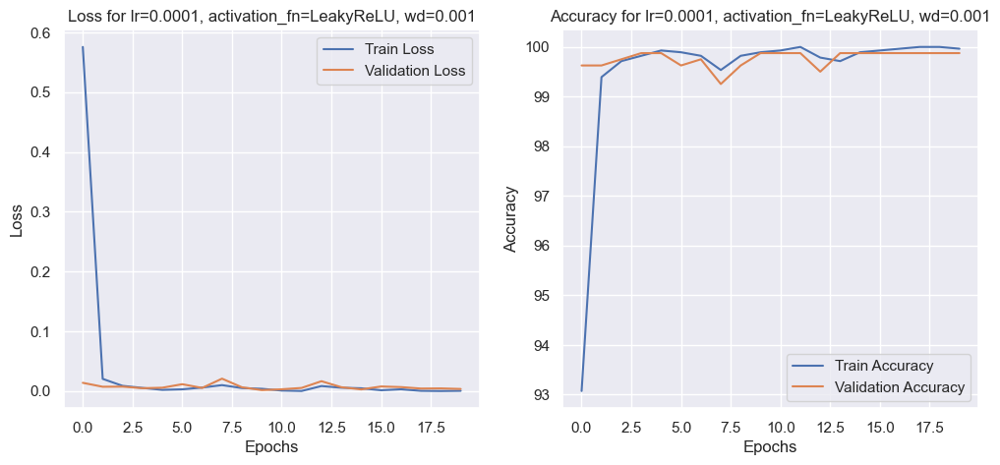


Training with lr=0.0001, activation_fn=ELU, weight_decay=0.01
Epoch 1/20, Train Loss: 0.5550, Train Accuracy: 92.54%, Val Loss: 0.0115, Val Accuracy: 99.50%
Epoch 2/20, Train Loss: 0.0151, Train Accuracy: 99.57%, Val Loss: 0.0111, Val Accuracy: 99.63%
Epoch 3/20, Train Loss: 0.0103, Train Accuracy: 99.68%, Val Loss: 0.0077, Val Accuracy: 99.75%
Epoch 4/20, Train Loss: 0.0070, Train Accuracy: 99.61%, Val Loss: 0.0088, Val Accuracy: 99.63%
Epoch 5/20, Train Loss: 0.0038, Train Accuracy: 99.89%, Val Loss: 0.0042, Val Accuracy: 99.88%
Epoch 6/20, Train Loss: 0.0095, Train Accuracy: 99.71%, Val Loss: 0.0056, Val Accuracy: 99.75%
Epoch 7/20, Train Loss: 0.0023, Train Accuracy: 99.96%, Val Loss: 0.0043, Val Accuracy: 99.88%
Epoch 8/20, Train Loss: 0.0012, Train Accuracy: 99.96%, Val Loss: 0.0050, Val Accuracy: 99.88%
Epoch 9/20, Train Loss: 0.0009, Train Accuracy: 100.00%, Val Loss: 0.0037, Val Accuracy: 99.88%
Epoch 10/20, Train Loss: 0.0024, Train Accuracy: 99.93%, Val Loss: 0.0127, Val Ac

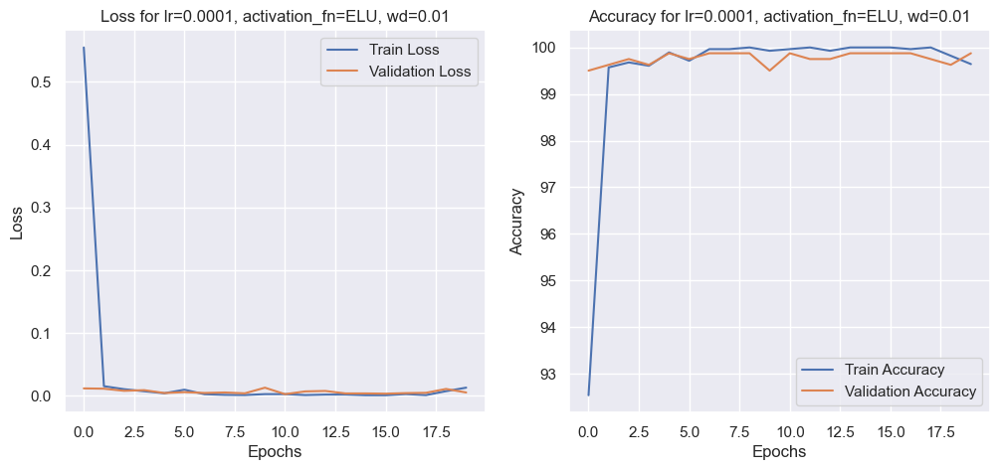


Training with lr=0.0001, activation_fn=ELU, weight_decay=0.001
Epoch 1/20, Train Loss: 0.5016, Train Accuracy: 92.93%, Val Loss: 0.0102, Val Accuracy: 99.75%
Epoch 2/20, Train Loss: 0.0162, Train Accuracy: 99.50%, Val Loss: 0.0037, Val Accuracy: 99.88%
Epoch 3/20, Train Loss: 0.0024, Train Accuracy: 100.00%, Val Loss: 0.0030, Val Accuracy: 99.88%
Epoch 4/20, Train Loss: 0.0150, Train Accuracy: 99.61%, Val Loss: 0.0048, Val Accuracy: 99.88%
Epoch 5/20, Train Loss: 0.0029, Train Accuracy: 99.89%, Val Loss: 0.0027, Val Accuracy: 99.88%
Epoch 6/20, Train Loss: 0.0008, Train Accuracy: 100.00%, Val Loss: 0.0022, Val Accuracy: 99.88%
Epoch 7/20, Train Loss: 0.0014, Train Accuracy: 99.96%, Val Loss: 0.0034, Val Accuracy: 99.88%
Epoch 8/20, Train Loss: 0.0004, Train Accuracy: 100.00%, Val Loss: 0.0027, Val Accuracy: 99.88%
Epoch 9/20, Train Loss: 0.0003, Train Accuracy: 100.00%, Val Loss: 0.0031, Val Accuracy: 99.88%
Epoch 10/20, Train Loss: 0.0005, Train Accuracy: 100.00%, Val Loss: 0.0027, V

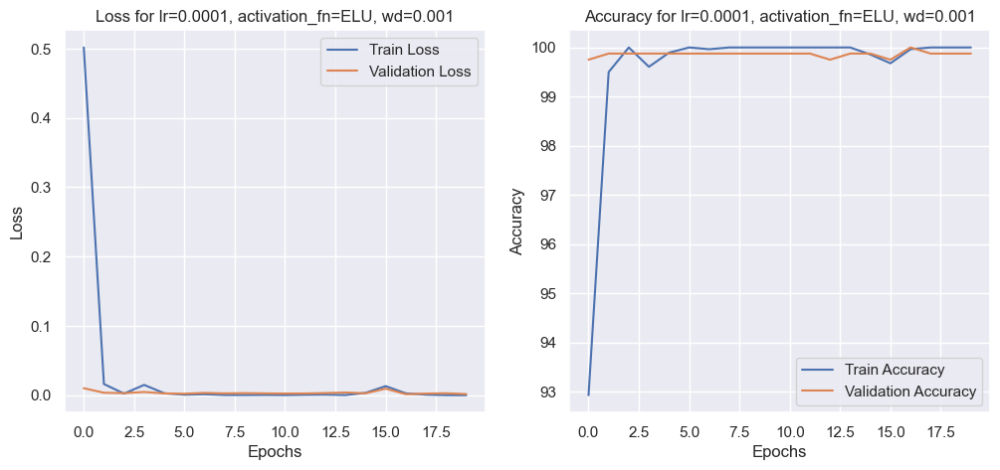

In [38]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import matplotlib.pyplot as plt

# Μετατροπή ετικετών σε αριθμούς
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Μετατροπή των εικόνων σε PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32).unsqueeze(1)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32).unsqueeze(1)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).unsqueeze(1)

# Δημιουργία TensorDataset και DataLoader
train_data = TensorDataset(X_train_tensor, torch.tensor(y_train_encoded, dtype=torch.long))
val_data = TensorDataset(X_val_tensor, torch.tensor(y_val_encoded, dtype=torch.long))
test_data = TensorDataset(X_test_tensor, torch.tensor(y_test_encoded, dtype=torch.long))

train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_loader = DataLoader(val_data, batch_size=32, shuffle=False)
test_loader = DataLoader(test_data, batch_size=32, shuffle=False)

# Ορισμός του CNN μοντέλου με Dropout και διαφορετικές συναρτήσεις ενεργοποίησης
class CNN(nn.Module):
    def __init__(self, num_classes, activation_fn='ReLU'):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.fc1 = nn.Linear(128 * 8 * 8, 512)  # Προσαρμογή ανάλογα με το μέγεθος των εικόνων
        self.fc2 = nn.Linear(512, num_classes)
        self.dropout = nn.Dropout(0.5)  # Dropout για κανονικοποίηση

        if activation_fn == 'ReLU':
            self.activation = nn.ReLU()
        elif activation_fn == 'LeakyReLU':
            self.activation = nn.LeakyReLU(0.1)
        elif activation_fn == 'ELU':
            self.activation = nn.ELU()
        else:
            raise ValueError(f"Unknown activation function: {activation_fn}")

        self.maxpool = nn.MaxPool2d(2)

    def forward(self, x):
        x = self.activation(self.conv1(x))
        x = self.maxpool(x)
        x = self.activation(self.conv2(x))
        x = self.maxpool(x)
        x = self.activation(self.conv3(x))
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)  # Flatten το tensor
        x = self.dropout(self.activation(self.fc1(x)))  # Dropout πριν από το πλήρως συνδεδεμένο επίπεδο
        x = self.fc2(x)
        return x

# Εφαρμογή Regularization μέσω L2 (Weight Decay) στον Adam optimizer
def create_model_and_optimizer(activation_fn='ReLU', lr=0.001, weight_decay=0.01):
    model = CNN(num_classes=len(np.unique(y_train)), activation_fn=activation_fn)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    return model, criterion, optimizer

# Ορισμός της διαδικασίας εκπαίδευσης με αποθήκευση του καλύτερου μοντέλου
def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=20):
    train_losses, train_accuracies = [], []
    val_losses, val_accuracies = [], []  
    
    best_val_accuracy = 0.0
    best_model_state_dict = None  # Για να αποθηκεύσουμε το state dict του καλύτερου μοντέλου

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        train_accuracy = 100 * correct / total
        train_losses.append(running_loss / len(train_loader))
        train_accuracies.append(train_accuracy)

        # Αξιολόγηση στο Validation Set
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_accuracy = 100 * val_correct / val_total
        val_losses.append(val_loss / len(val_loader))
        val_accuracies.append(val_accuracy)

        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Train Accuracy: {train_accuracies[-1]:.2f}%, Val Loss: {val_losses[-1]:.4f}, Val Accuracy: {val_accuracies[-1]:.2f}%")

        # Αν η ακρίβεια στο validation set είναι καλύτερη, αποθηκεύουμε το μοντέλο
        if val_accuracy > best_val_accuracy:
            best_val_accuracy = val_accuracy
            best_model_state_dict = model.state_dict()  # Αποθήκευση του state_dict του καλύτερου μοντέλου

    # Αποθήκευση του καλύτερου μοντέλου στο τέλος της εκπαίδευσης
    if best_model_state_dict is not None:
        torch.save(best_model_state_dict, 'best_model.pth')  # Αποθήκευση του καλύτερου μοντέλου

    return train_losses, train_accuracies, val_losses, val_accuracies


# Ορισμός υπερπαραμέτρων για τον πειραματισμό
learning_rates = [0.001, 0.0001]
activation_functions = ['ReLU', 'LeakyReLU', 'ELU']
weight_decays = [0.01, 0.001]

# Πειραματισμός με διαφορετικούς συνδυασμούς
for lr in learning_rates:
    for activation_fn in activation_functions:
        for wd in weight_decays:
            print(f"\nTraining with lr={lr}, activation_fn={activation_fn}, weight_decay={wd}")
            model, criterion, optimizer = create_model_and_optimizer(activation_fn, lr, wd)
            train_losses, train_accuracies, val_losses, val_accuracies = train_model(model, criterion, optimizer, train_loader, val_loader)

            # Οπτικοποίηση των καμπυλών μάθησης
            plt.figure(figsize=(12, 5))

            # Καμπύλες Απώλειας
            plt.subplot(1, 2, 1)
            plt.plot(train_losses, label='Train Loss')
            plt.plot(val_losses, label='Validation Loss')
            plt.title(f'Loss for lr={lr}, activation_fn={activation_fn}, wd={wd}')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()

            # Καμπύλες Ακρίβειας
            plt.subplot(1, 2, 2)
            plt.plot(train_accuracies, label='Train Accuracy')
            plt.plot(val_accuracies, label='Validation Accuracy')
            plt.title(f'Accuracy for lr={lr}, activation_fn={activation_fn}, wd={wd}')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()

            plt.show()

Best Hyperparameters: ('[256, 128]', 'ReLU', 0.01, 0.5)
Test Loss: 0.0232, Test Accuracy: 99.75%


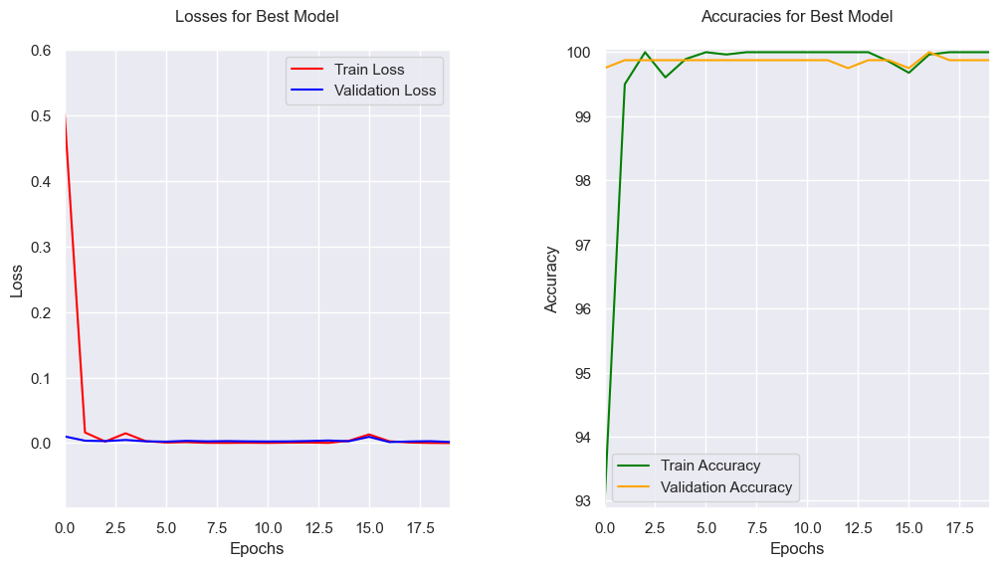

In [39]:
import torch
import matplotlib.pyplot as plt

# Φόρτωση του καλύτερου μοντέλου
best_model = CNN(num_classes=len(np.unique(y_train)), activation_fn='ReLU')  # Χρησιμοποιήστε τα ίδια χαρακτηριστικά του μοντέλου που είχατε πριν
best_model.load_state_dict(torch.load('best_model.pth'))  # Φορτώνουμε το state dict από το αρχείο

# Ορισμός του criterion
criterion = torch.nn.CrossEntropyLoss()

# Επαναφορά του μοντέλου σε "evaluation" mode
best_model.eval()

# Υπολογισμός του Test Loss και Test Accuracy (χωρίς να το εμφανίσουμε στα γραφήματα)
with torch.no_grad():
    test_outputs = best_model(X_test_tensor)  # Υπολογισμός εξόδου για το test set
    test_loss = criterion(test_outputs, torch.tensor(y_test_encoded, dtype=torch.long)).item()  # Υπολογισμός του Test Loss
    _, predicted = torch.max(test_outputs, 1)
    test_accuracy = (predicted == torch.tensor(y_test_encoded, dtype=torch.long)).sum().item() / len(y_test_encoded) * 100

# Εκτύπωση των βέλτιστων υπερπαραμέτρων
print(f'Best Hyperparameters: {best_hyperparameters}')
print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%')

# Αποθήκευση των αποτελεσμάτων στο best_result dictionary
best_result = {
    'train_losses': train_losses,  # Απώλειες για το train set κατά την εκπαίδευση
    'val_losses': val_losses,      # Απώλειες για το validation set κατά την εκπαίδευση
    'train_accuracies': train_accuracies,  # Ακρίβεια για το train set κατά την εκπαίδευση
    'val_accuracies': val_accuracies,      # Ακρίβεια για το validation set κατά την εκπαίδευση
}

# Οπτικοποίηση των αποτελεσμάτων χωρίς το Test Loss και Test Accuracy
plt.figure(figsize=(12, 6))

# Γράφημα για τις Απώλειες του καλύτερου μοντέλου
plt.subplot(1, 2, 1)
plt.plot(range(num_epochs), best_result['train_losses'], label='Train Loss', color='red')
plt.plot(range(num_epochs), best_result['val_losses'], label='Validation Loss', color='blue')
plt.title(f'Losses for Best Model', pad=20)  # Προσθήκη padding στον τίτλο
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Ορισμός του άξονα x ώστε να ξεκινά από το 0
plt.xlim(0, num_epochs-1)  # Ορίζουμε το x να ξεκινά από το 0
plt.ylim(min(train_losses + val_losses) - 0.1, max(train_losses + val_losses) + 0.1)

# Γράφημα για τις Ακρίβειες του καλύτερου μοντέλου
plt.subplot(1, 2, 2)
plt.plot(range(num_epochs), best_result['train_accuracies'], label='Train Accuracy', color='green')
plt.plot(range(num_epochs), best_result['val_accuracies'], label='Validation Accuracy', color='orange')
plt.title(f'Accuracies for Best Model', pad=20)  # Προσθήκη padding στον τίτλο
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Ορισμός του άξονα x ώστε να ξεκινά από το 0
plt.xlim(0, num_epochs-1)
plt.ylim(min(train_accuracies + val_accuracies) - 0.05, max(train_accuracies + val_accuracies) + 0.05)

# Χρήση του `subplots_adjust` για να αυξήσεις την απόσταση μεταξύ των υποπλοτ
plt.subplots_adjust(wspace=0.4, hspace=0.4)

plt.show()

Classification Report for Train Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       700
         CXR       1.00      1.00      1.00       700
     ChestCT       1.00      1.00      1.00       700
        Hand       1.00      1.00      1.00       700

    accuracy                           1.00      2800
   macro avg       1.00      1.00      1.00      2800
weighted avg       1.00      1.00      1.00      2800



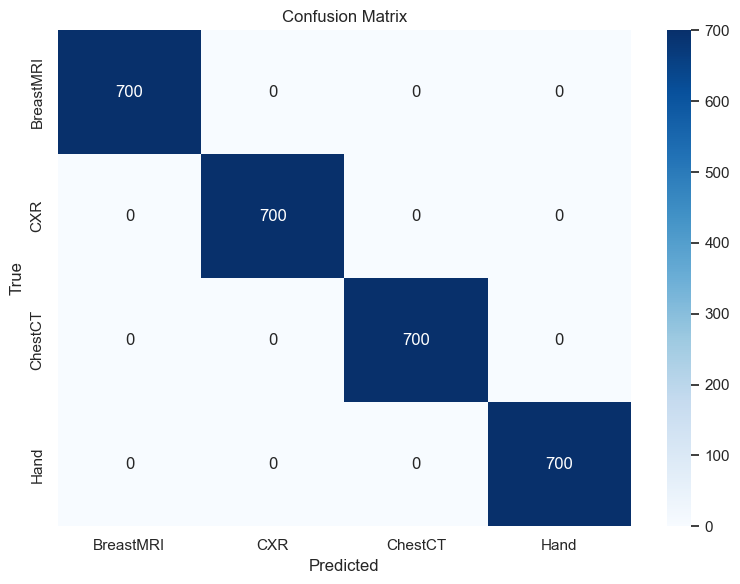

Classification Report for Validation Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00       201
         CXR       1.00      1.00      1.00       201
     ChestCT       1.00      1.00      1.00       201
        Hand       1.00      1.00      1.00       201

    accuracy                           1.00       804
   macro avg       1.00      1.00      1.00       804
weighted avg       1.00      1.00      1.00       804



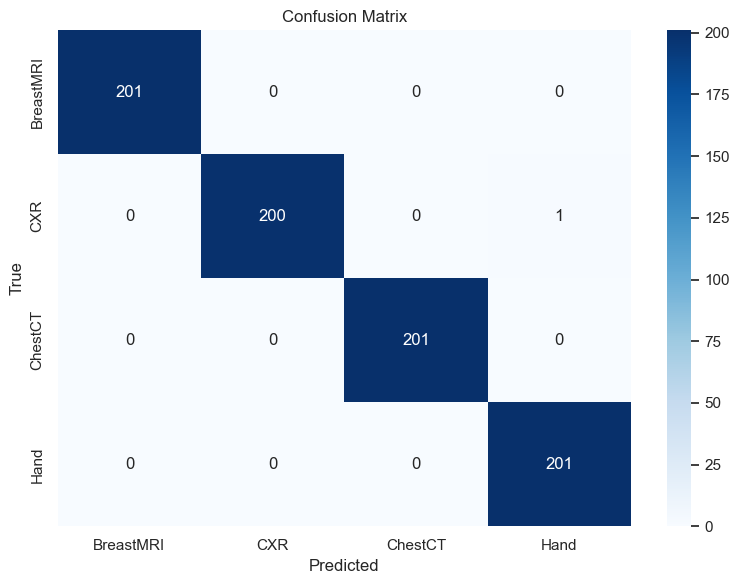

Classification Report for Test Set:
              precision    recall  f1-score   support

   BreastMRI       1.00      1.00      1.00        99
         CXR       1.00      0.99      0.99        99
     ChestCT       1.00      1.00      1.00        99
        Hand       0.99      1.00      0.99        99

    accuracy                           1.00       396
   macro avg       1.00      1.00      1.00       396
weighted avg       1.00      1.00      1.00       396



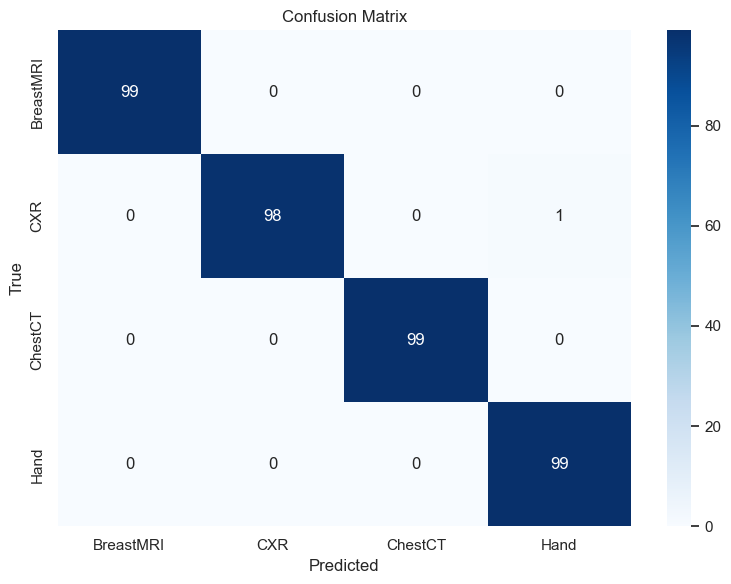

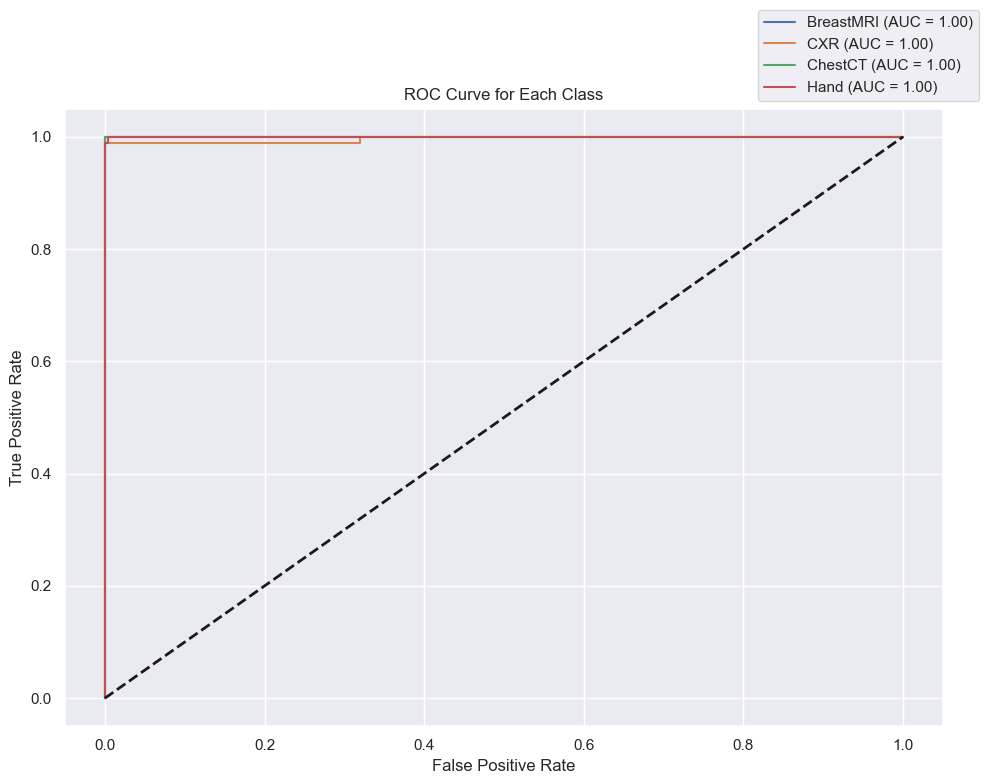

In [40]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize


# Μεταφορά του μοντέλου στην ίδια συσκευή
best_model.to(device)

# Συνάρτηση για την εκτύπωση του classification report και της confusion matrix
def evaluate_model(model, X_data_tensor, y_data_tensor, class_names, device):
    model.eval()  # Θέτουμε το μοντέλο σε κατάσταση αξιολόγησης
    with torch.no_grad():
        # Στείλε τα δεδομένα στην ίδια συσκευή με το μοντέλο
        X_data_tensor = X_data_tensor.to(device)
        y_data_tensor = y_data_tensor.to(device)

        # Υπολογισμός εξόδου
        outputs = model(X_data_tensor)
        _, predicted = torch.max(outputs, 1)

    # Μεταφορά των προβλέψεων και των αληθινών ετικετών στη CPU
    y_pred = predicted.cpu().numpy()
    y_true = y_data_tensor.cpu().numpy()

    # Εκτύπωση Classification Report
    print(classification_report(y_true, y_pred, target_names=class_names))

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title("Confusion Matrix")
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.show()

# Συνάρτηση για την δημιουργία της ROC Curve
def plot_roc_curve(model, X_test_tensor, y_test_encoded, class_names, device):
    # Binarize the true labels for ROC
    y_test_bin = label_binarize(y_test_encoded, classes=np.arange(len(class_names)))

    # Στείλε τα δεδομένα στην ίδια συσκευή με το μοντέλο
    X_test_tensor = X_test_tensor.to(device)
    y_test_encoded = torch.tensor(y_test_encoded, dtype=torch.long).to(device)

    with torch.no_grad():
        outputs = model(X_test_tensor)
        probs = torch.softmax(outputs, dim=1)

    fpr = {}
    tpr = {}
    roc_auc = {}

    # Υπολογισμός ROC και AUC για κάθε κατηγορία
    for i in range(len(class_names)):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], probs[:, i].cpu().numpy())
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Σχεδίαση ROC curve για κάθε κατηγορία
    plt.figure(figsize=(10, 8))
    for i in range(len(class_names)):
        plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)  # Διαχωριστική γραμμή για τυχαία απόδοση
    plt.title('ROC Curve for Each Class')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right', bbox_to_anchor=(1.05, 1))
    plt.tight_layout()
    plt.show()

# Εκτίμηση του μοντέλου για train, val και test set
class_names = label_encoder.classes_  # Αντιστοιχία κλάσεων προς τα ονόματα των κατηγοριών

# Αξιολόγηση στο Train Set
print("Classification Report for Train Set:")
evaluate_model(best_model, X_train_tensor, torch.tensor(y_train_encoded, dtype=torch.long), class_names, device)

# Αξιολόγηση στο Validation Set
print("Classification Report for Validation Set:")
evaluate_model(best_model, X_val_tensor, torch.tensor(y_val_encoded, dtype=torch.long), class_names, device)

# Αξιολόγηση στο Test Set
print("Classification Report for Test Set:")
evaluate_model(best_model, X_test_tensor, torch.tensor(y_test_encoded, dtype=torch.long), class_names, device)

# Εκτύπωση ROC Curve
plot_roc_curve(best_model, X_test_tensor, y_test_encoded, class_names, device)

Χρησιμοποιώντας classification report, confusion matrix και ROC curve, παρατηρούμε πως το μοντέλο έχει άριστη απόδοση με ακρίβεια 100% σε όλα τα σύνολα και AUC=1.00 για κάθε κατηγορία. Συνεπώς το μοντέλο κατατάσσει σωστά όλες τις κατηγορίες με τέλεια ακρίβεια και εξαιρετική ικανότητα διάκρισης μεταξύ των κλάσεων.